# 8 sample analysis- neurons Cell_type_Markers_Violin


#  <font color='blue'>Contents</font> 
1. Install package, load libraries and data
2.

.libPaths()

In [1]:
.libPaths()

[1] "/home/garret/anaconda3/envs/HR/lib/R/library"

In [2]:
library(scales)
library(Seurat)
library(dplyr)
library(magrittr)
IRdisplay::display_html("<style> .container { width:95% !important; } </style>")
library("xlsx")

library(ggplot2)
library(scales)
library(reshape2)



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [3]:
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
P23M<-readRDS(file ="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/P23M.rds")
P35M<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/P35M.rds")
AM<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/AM.rds")
Cast<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Cast.rds")
P23F<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/P23F.rds")
P35F<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/P35F.rds")
AF<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/AF.rds")
OVX<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/OVX.rds")

# assgin clusters to cell types

In [5]:
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)

In [7]:
DefaultAssay(MPOA.integrated) <- "integrated"

In [5]:
pdf(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/cluster_tree_all_RNA.pdf",width=10,height=12,paper='special') 
MPOA.integrated <- BuildClusterTree(MPOA.integrated, verbose = FALSE, reorder = FALSE)
PlotClusterTree(MPOA.integrated)
dev.off()

png 
  2

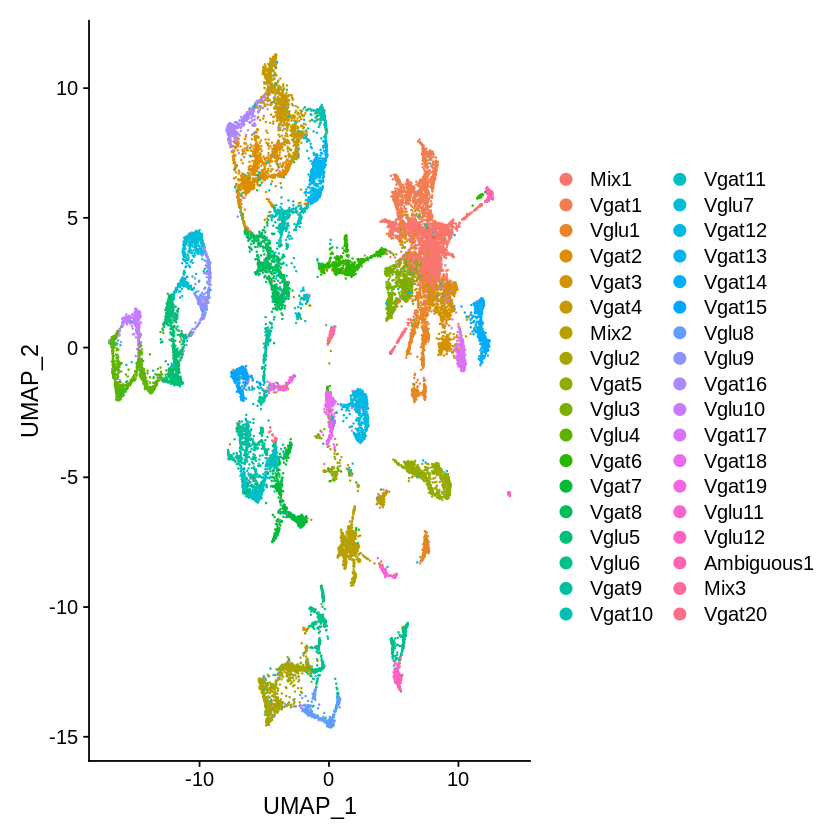

In [6]:
DimPlot(object = MPOA.integrated, reduction = "umap", label = FALSE, repel = TRUE,label.size = 8) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_no_name_2000_40.pdf",width=10,height=10)

In [4]:
color<-c("P23M"= "#697A21","P35M"="#88A0B4","AM" ="#000C3F","Cast"= "#FFDAB9","P23F"= "gray8",
"P35F"= "#E0479E",
"AF"="#832232",
"OVX"= "#FFCD73")

In [5]:
order<-rev(c("AM" ="#000C3F","AF"="#832232","P35M"="#88A0B4","P35F"= "#E0479E","Cast"= "#FFDAB9","OVX"= "#FFCD73","P23M"= "#697A21","P23F"= "gray8"))

In [17]:
help(DimPlot)

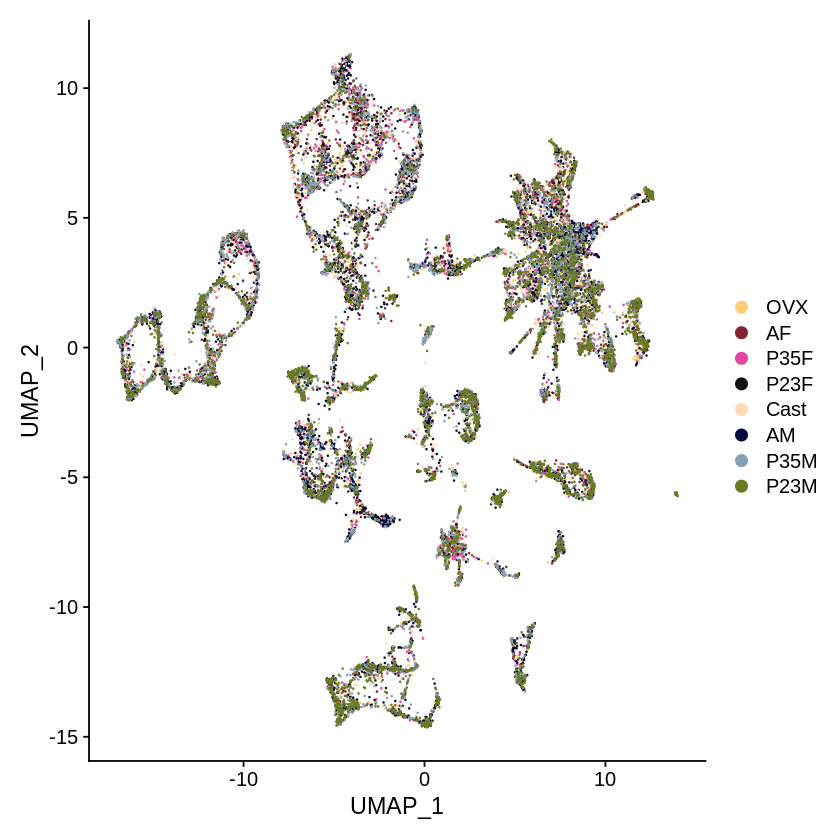

In [8]:
DimPlot(object = MPOA.integrated, reduction = "umap", group.by = "stim",label.size = 10,pt.size = 0.08,cols=color,order=order)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_group.pdf",width=8,height=10)

# Cell type analysis in each condition

In [6]:
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [22]:
test<-subset(MPOA.integrated,cells=Vgat1_barcode)
test@meta.data
MPOA.integrated@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,stim,percent.mito,integrated_snn_res.0.8,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<dbl>,<fct>,<fct>
AACCATGCACAACGTTP23M,10X_MPOA,1318,961,P23M,0.05159332,1,1
AACCATGTCACTTACTP23M,10X_MPOA,1511,1035,P23M,0.06684315,1,1
ACCGTAAAGACCACGAP23M,10X_MPOA,988,735,P23M,0.05263158,1,1
ACGGAGATCAACGAAAP23M,10X_MPOA,1010,776,P23M,0.02079208,1,1
ACGGGCTTCGGAGGTAP23M,10X_MPOA,880,685,P23M,0.06477273,1,1
ATAACGCAGCACCGTCP23M,10X_MPOA,1725,1169,P23M,0.04811594,1,1
ATAACGCCAGTACACTP23M,10X_MPOA,1029,783,P23M,0.06413994,1,1
ATAACGCGTCAAAGATP23M,10X_MPOA,903,713,P23M,0.03654485,1,1
ATAAGAGAGTAACCCTP23M,10X_MPOA,1073,805,P23M,0.07082945,1,1


,orig.ident,nCount_RNA,nFeature_RNA,stim,percent.mito,integrated_snn_res.0.8,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<dbl>,<fct>,<fct>
GGAACTTAGAGACGAAP23M,10X_MPOA,2469,1456,P23M,0.091130012,6,6
AAAGATGAGCCACGTCP23M,10X_MPOA,818,626,P23M,0.009779951,0,0
AAAGATGGTAATCGTCP23M,10X_MPOA,1558,1096,P23M,0.049422336,9,9
AAAGCAACATTGTGCAP23M,10X_MPOA,1450,1030,P23M,0.036551724,2,2
AAAGTAGTCATATCGGP23M,10X_MPOA,1189,872,P23M,0.084104289,0,0
AACCATGCACAACGTTP23M,10X_MPOA,1318,961,P23M,0.051593323,1,1
AACCATGGTACGACCCP23M,10X_MPOA,1327,990,P23M,0.036171816,2,2
AACCATGGTCGCTTTCP23M,10X_MPOA,1043,767,P23M,0.028763183,2,2
AACCATGTCACTTACTP23M,10X_MPOA,1511,1035,P23M,0.066843150,1,1


In [7]:
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
assign(paste(new.ident[i],"_barcode_P23M",sep=""),intersect(colnames(P23M@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
assign(paste(new.ident[i],"_barcode_P35M",sep=""),intersect(colnames(P35M@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
assign(paste(new.ident[i],"_barcode_AM",sep=""),intersect(colnames(AM@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
assign(paste(new.ident[i],"_barcode_Cast",sep=""),intersect(colnames(Cast@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
assign(paste(new.ident[i],"_barcode_P23F",sep=""),intersect(colnames(P23F@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
assign(paste(new.ident[i],"_barcode_P35F",sep=""),intersect(colnames(P35F@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
assign(paste(new.ident[i],"_barcode_AF",sep=""),intersect(colnames(AF@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
assign(paste(new.ident[i],"_barcode_OVX",sep=""),intersect(colnames(OVX@assays$RNA@data),eval(parse(text = paste(new.ident[i],"_barcode",sep="")))))
}

# Feature maps

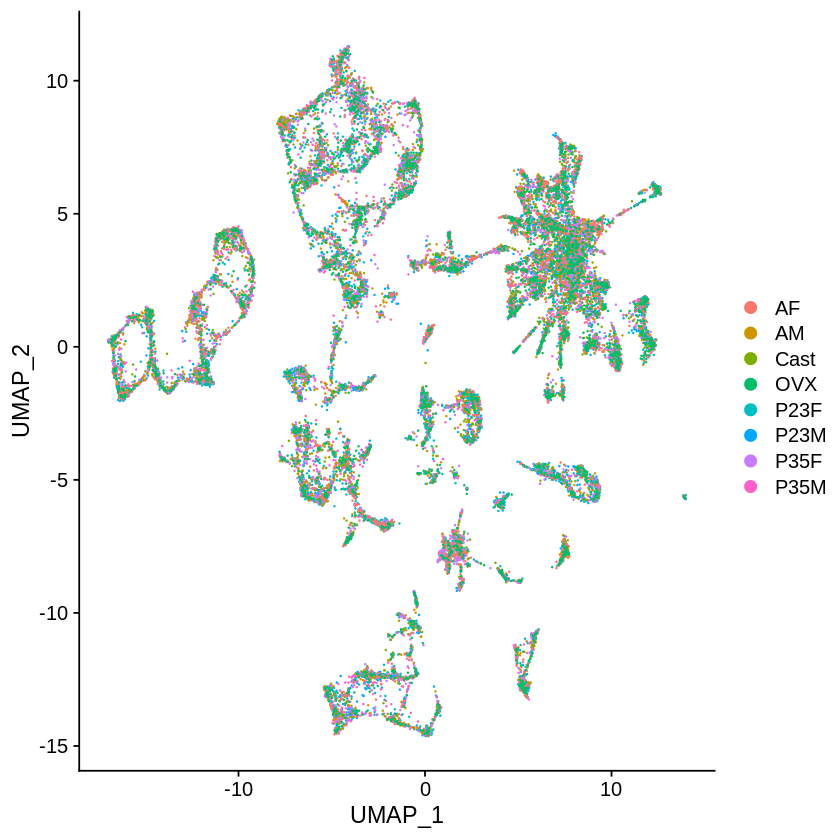

In [11]:
DimPlot(object = MPOA.integrated, reduction = "umap", group.by = "stim", label = FALSE, repel = TRUE) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_stim.pdf",width=10,height=10)

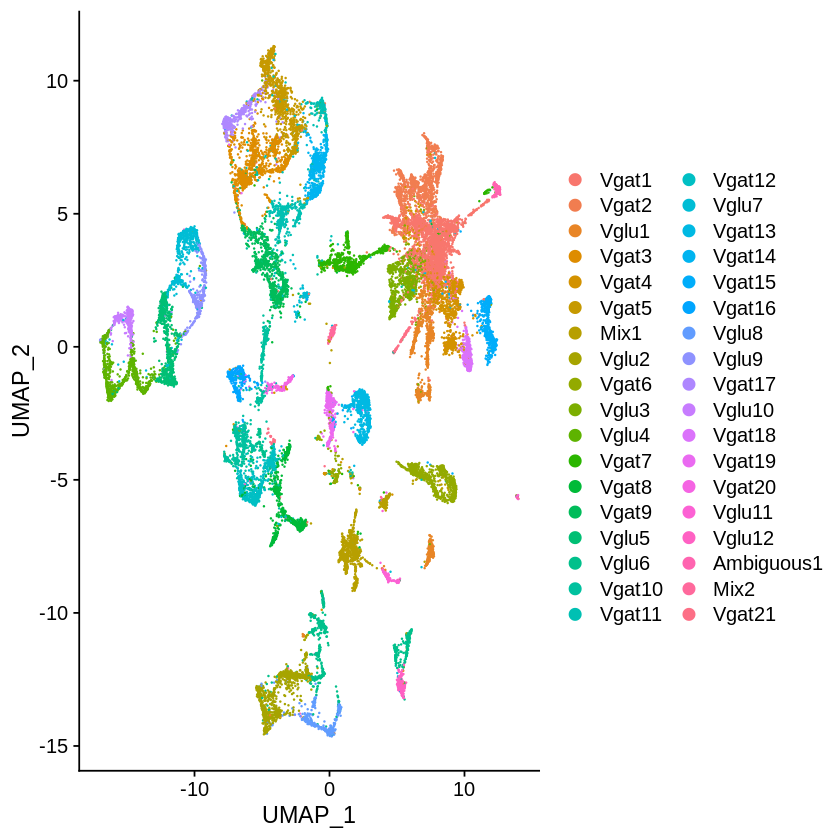

In [13]:
DimPlot(object = MPOA.integrated, reduction = "umap",  label = FALSE, repel = TRUE) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype.pdf",width=10,height=10)

In [5]:
#201124
type<-numeric()
for(i in 1:dim(MPOA.integrated@meta.data)[1]){
    type[i]<-new.ident[[MPOA.integrated@meta.data$seurat_clusters[i]]]
}
type<-factor(type,levels=new.ident)
MPOA.integrated@meta.data$type<-type
#need to remove ambiguous1
MPOA.integrated@meta.data<-subset(MPOA.integrated@meta.data,type!="Ambiguous1")

In [22]:
#number of clusters
length(unique(MPOA.integrated@meta.data$type))
#number of cells
dim(MPOA.integrated@meta.data)[1]
#median UMI
median(MPOA.integrated@meta.data$nCount_RNA)
#median gene
median(MPOA.integrated@meta.data$nFeature_RNA)
#% of Vgat cells
100*sum(grepl("Vgat",MPOA.integrated@meta.data$type))/dim(MPOA.integrated@meta.data)[1]
sum(grepl("Vgat",MPOA.integrated@meta.data$type))
#% of Vglu cells
100*sum(grepl("Vglu",MPOA.integrated@meta.data$type))/dim(MPOA.integrated@meta.data)[1]
sum(grepl("Vglu",MPOA.integrated@meta.data$type))
#% of Mix cells
100*sum(grepl("Mix",MPOA.integrated@meta.data$type))/dim(MPOA.integrated@meta.data)[1]

[1] 35

[1] 24627

[1] 5395

[1] 2592

[1] 54.14383

[1] 13334

[1] 31.09595

[1] 7658

[1] 14.76022

In [191]:
Idents(MPOA.integrated)<-factor(Idents(MPOA.integrated),levels=c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))

In [204]:
color<-c("lightblue","lightskyblue","skyblue","deepskyblue","lightsteelblue",
         "dodgerblue","cornflowerblue","steelblue","cadetblue","mediumslateblue",
         "slateblue","darkslateblue","royalblue","blue","mediumblue",
         "darkblue","navy","midnightblue","blueviolet","#4B0082",
         "lightsalmon","salmon","darksalmon","lightcoral","indianred",
         "#DC143C","firebrick","red","darkred","maroon",
         "tomato","orangered","darkgray","dimgray","slategray")

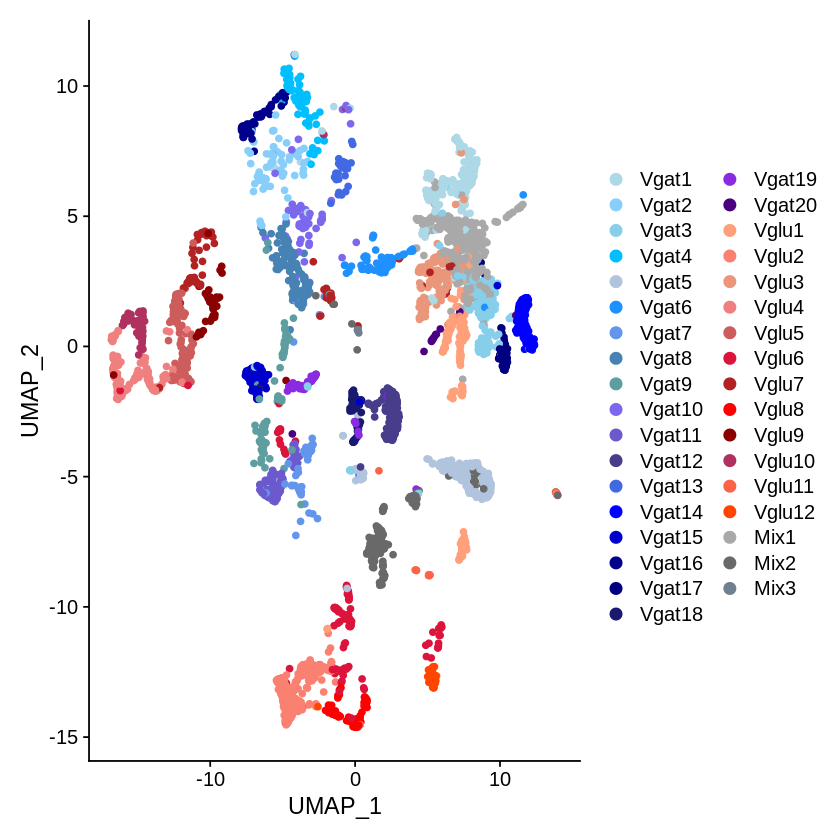

In [205]:
MPOA_P23M<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="P23M")))
DimPlot(object = MPOA_P23M, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_P23M.pdf",width=8,height=10)

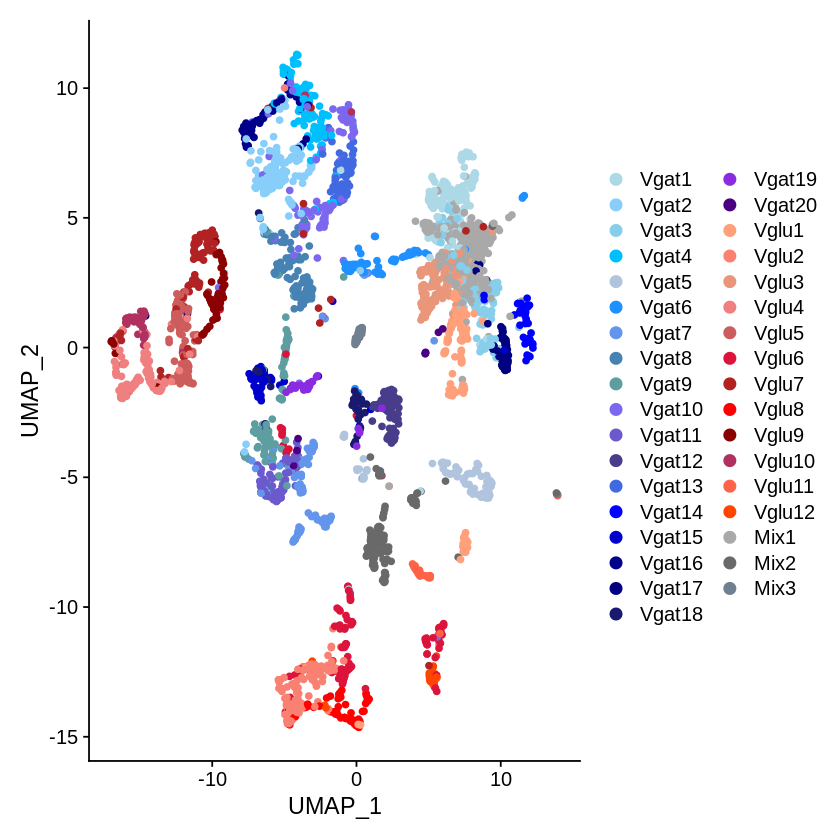

In [206]:
MPOA_P35M<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="P35M")))
DimPlot(object = MPOA_P35M, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_P35M.pdf",width=8,height=10)

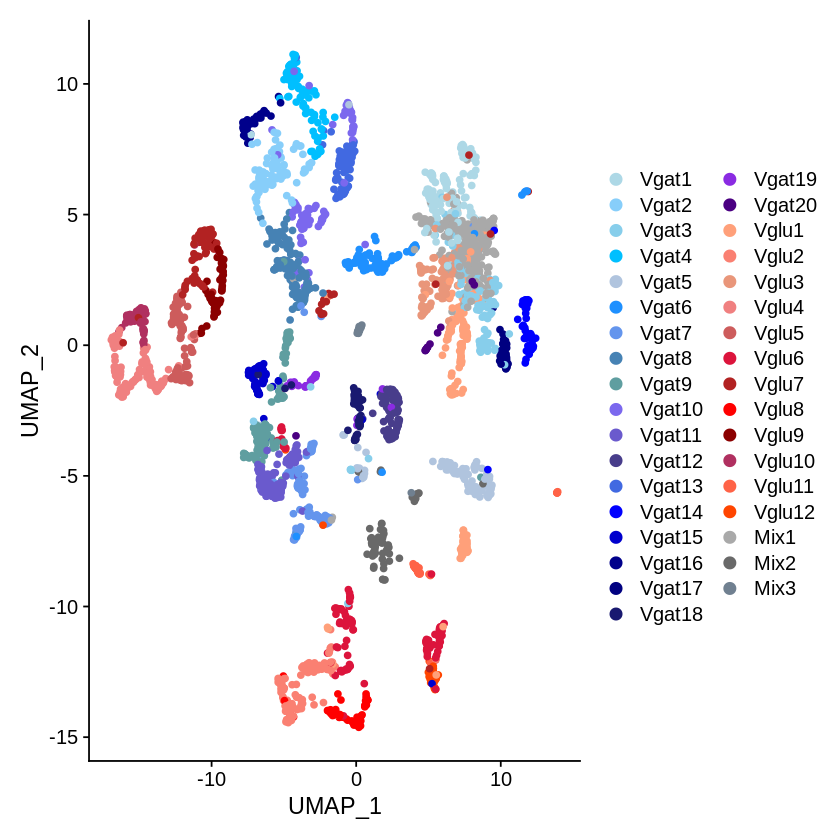

In [207]:
MPOA_AM<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AM")))
DimPlot(object = MPOA_AM, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_AM.pdf",width=8,height=10)

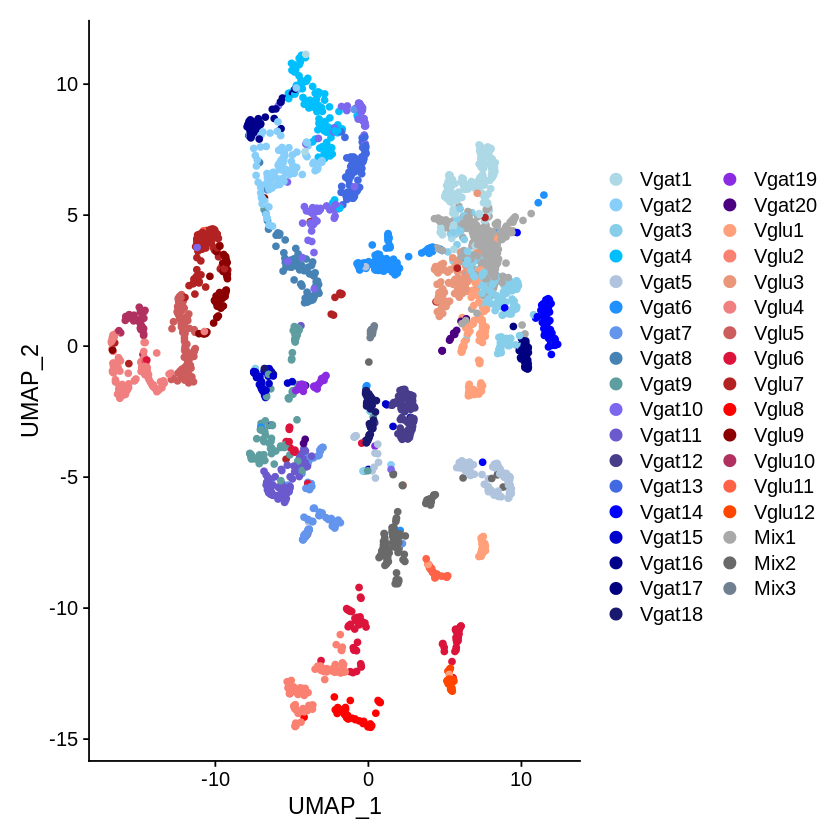

In [208]:
MPOA_Cast<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="Cast")))
DimPlot(object = MPOA_Cast, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_Cast.pdf",width=8,height=10)

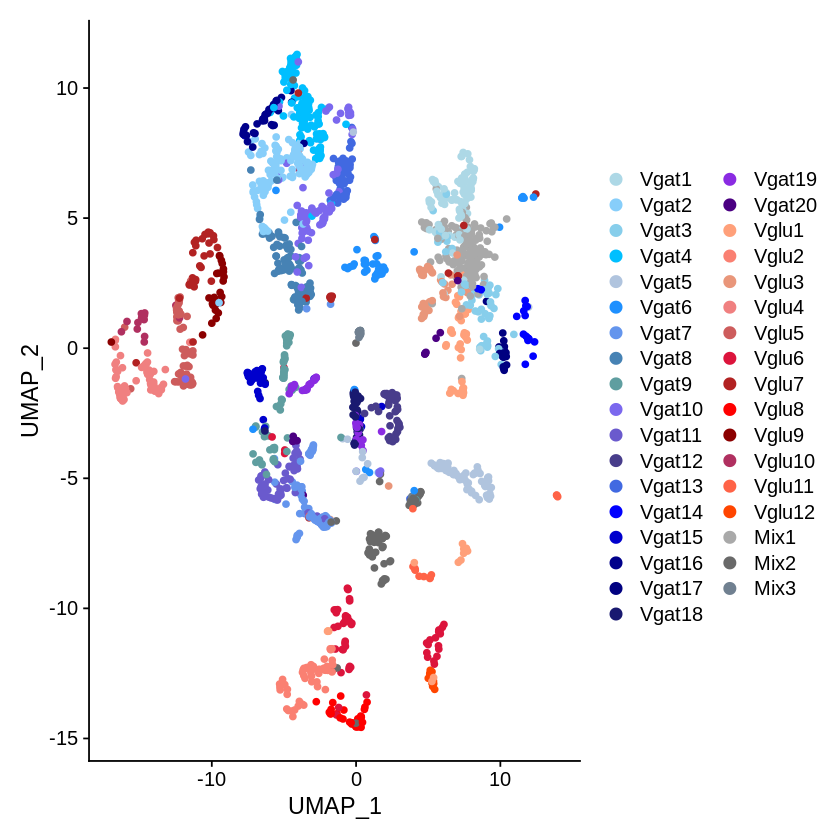

In [209]:
MPOA_P23F<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="P23F")))
DimPlot(object = MPOA_P23F, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_P23F.pdf",width=8,height=10)

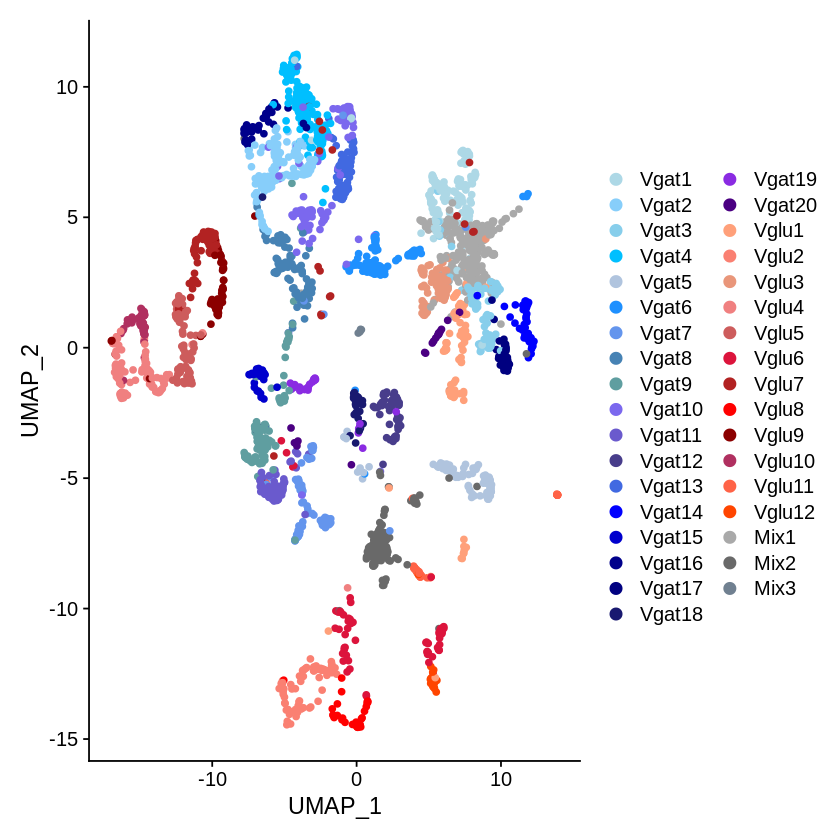

In [210]:
MPOA_P35F<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="P35F")))
DimPlot(object = MPOA_P35F, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_P35F.pdf",width=8,height=10)

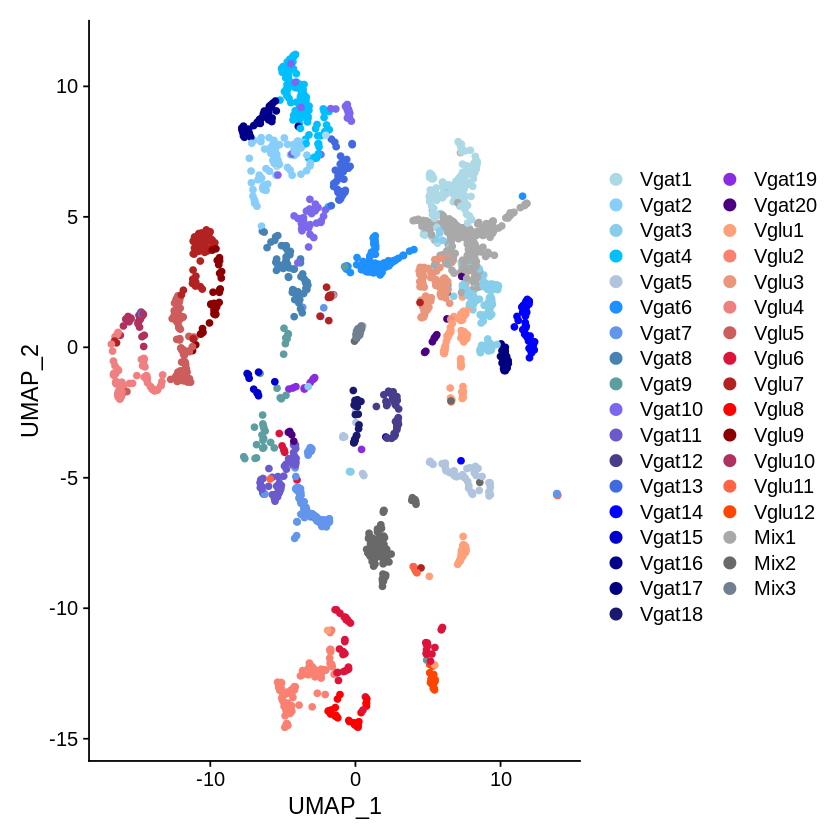

In [211]:
MPOA_AF<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AF")))
DimPlot(object = MPOA_AF, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_AF.pdf",width=8,height=10)

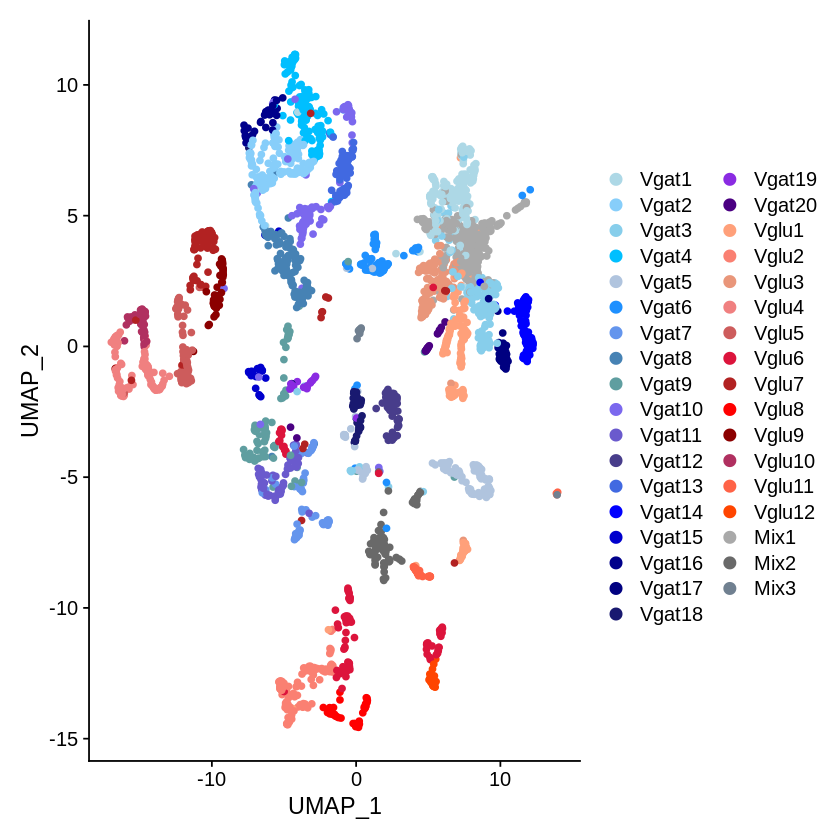

In [212]:
MPOA_OVX<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="OVX")))
DimPlot(object = MPOA_OVX, reduction = "umap",  label = FALSE, repel = TRUE,pt.size =1.5,cols=color) 
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Neurons_umap_number_2000_40_celltype_OVX.pdf",width=8,height=10)

In [7]:
DefaultAssay(MPOA.integrated) <- "RNA"

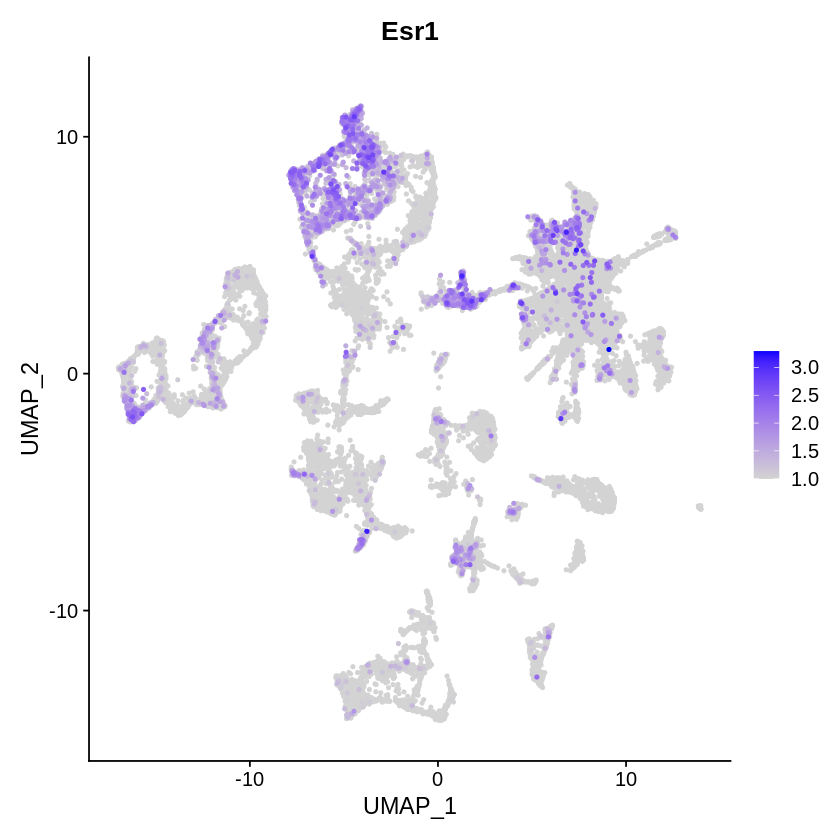

In [16]:
FeaturePlot(object =MPOA.integrated, features = c("Esr1"),pt.size=0.8,order=TRUE,min.cutoff=1,max.cutoff=5)

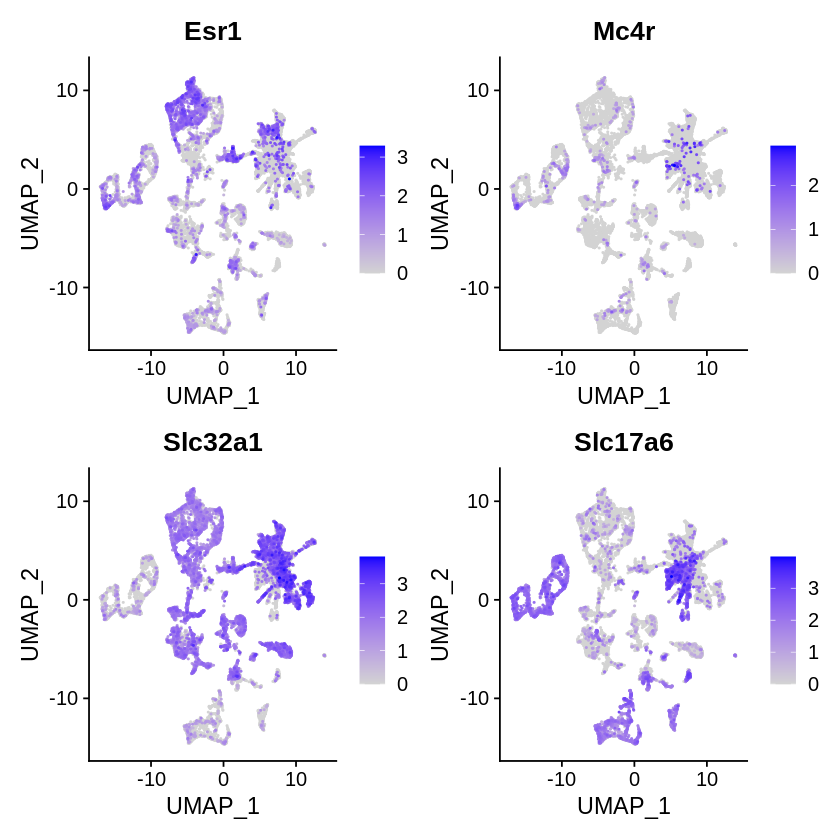

In [8]:
FeaturePlot(object =MPOA.integrated, features = c("Esr1","Mc4r","Slc32a1","Slc17a6"),pt.size=0.2,order=TRUE,max.cutoff=2)

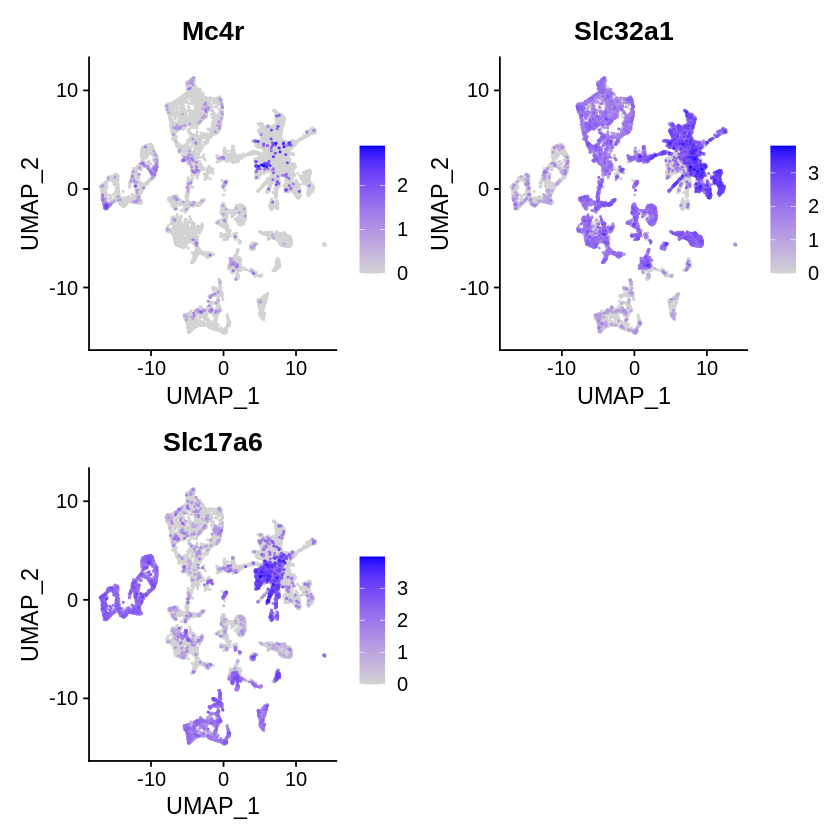

In [17]:
FeaturePlot(object =MPOA.integrated, features = c("Mc4r","Slc32a1","Slc17a6"),pt.size=0.2,order=TRUE)

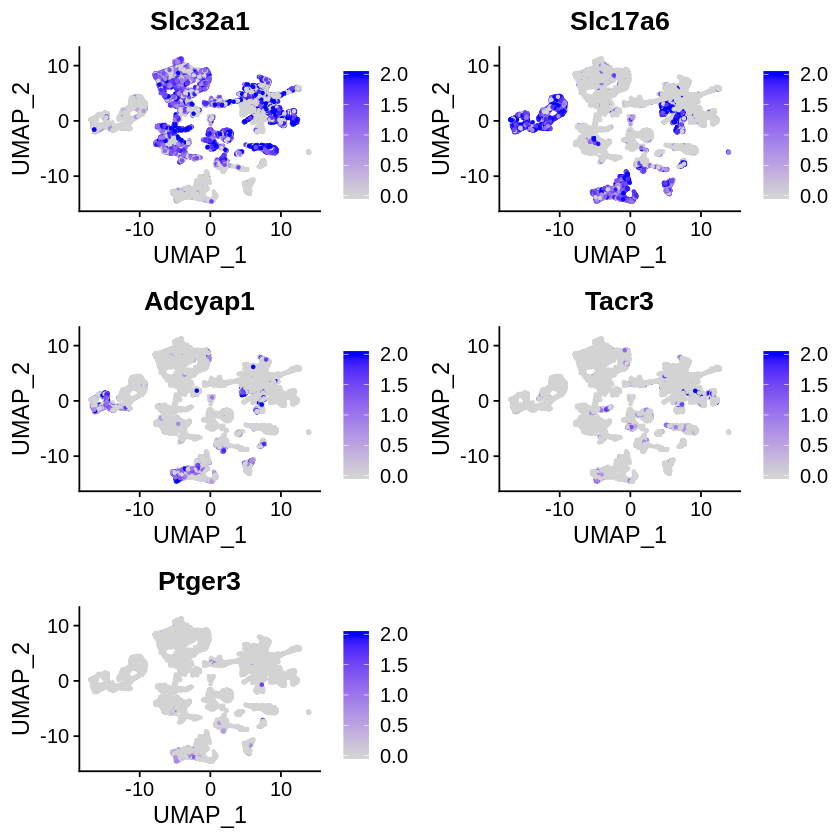

In [9]:
FeaturePlot(object =MPOA.integrated, features = c("Slc32a1","Slc17a6","Adcyap1","Tacr3","Ptger3"),pt.size=0.6,max.cutoff = 2)

In [6]:
DefaultAssay(MPOA.integrated) <- "RNA"

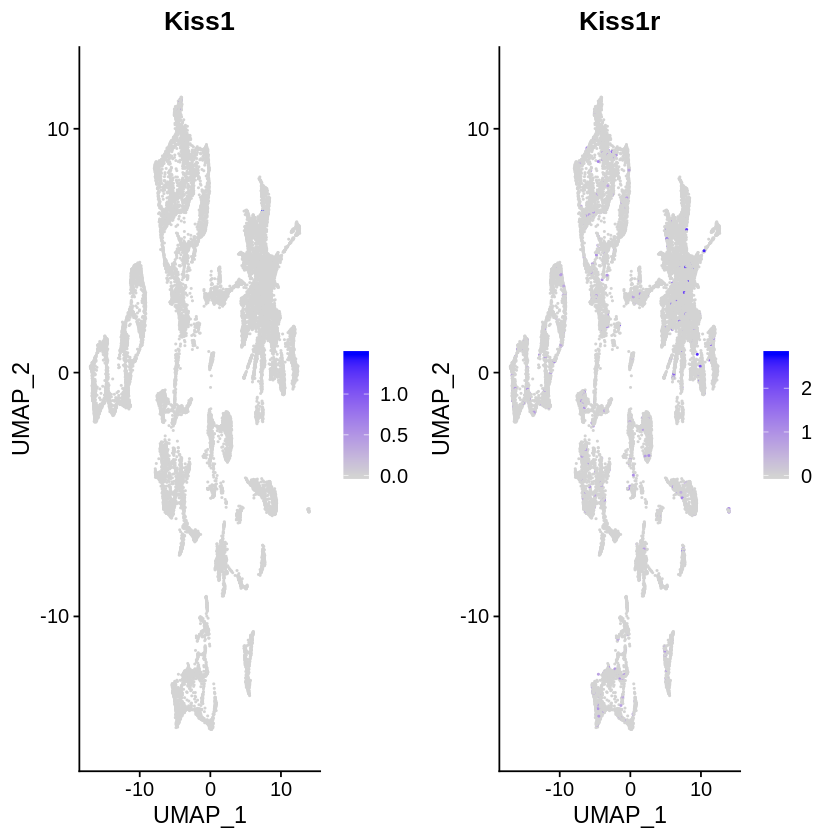

In [10]:
FeaturePlot(object =MPOA.integrated, features = c("Kiss1","Kiss1r"),pt.size=0.2)

In [ ]:
in case select particular group

In [7]:
MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AM" | stim=="AF")))

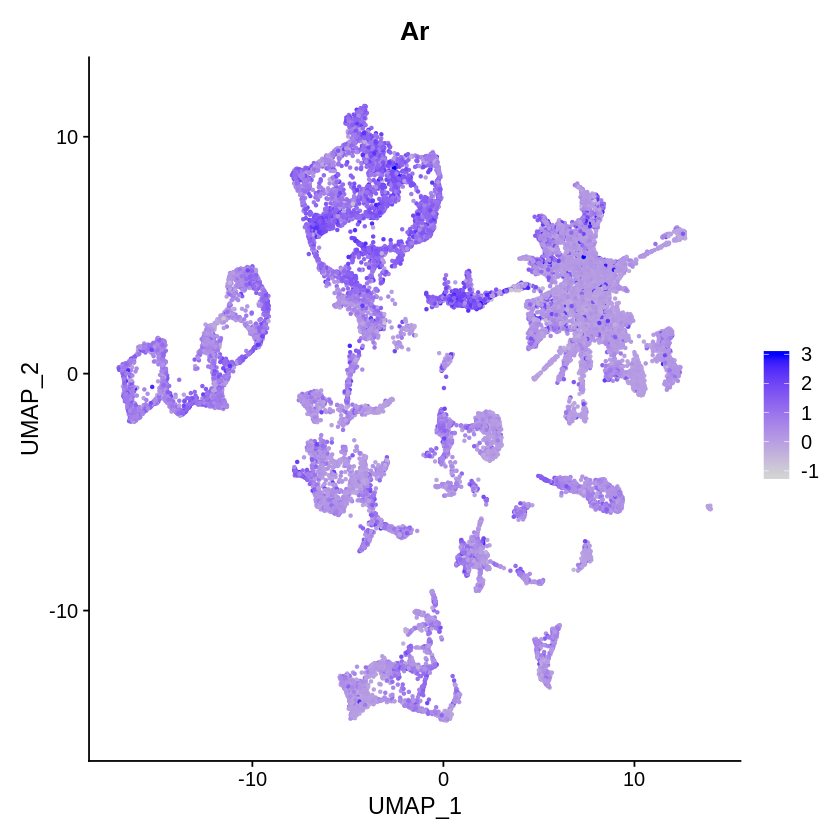

In [10]:
FeaturePlot(object =MPOA.integrated, features = c("Ar"),pt.size=0.6,max.cutoff = 3)
#ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/feature_Ar_3000_30_2.pdf",width=10,height=10)

In [9]:
help(FeaturePlot)

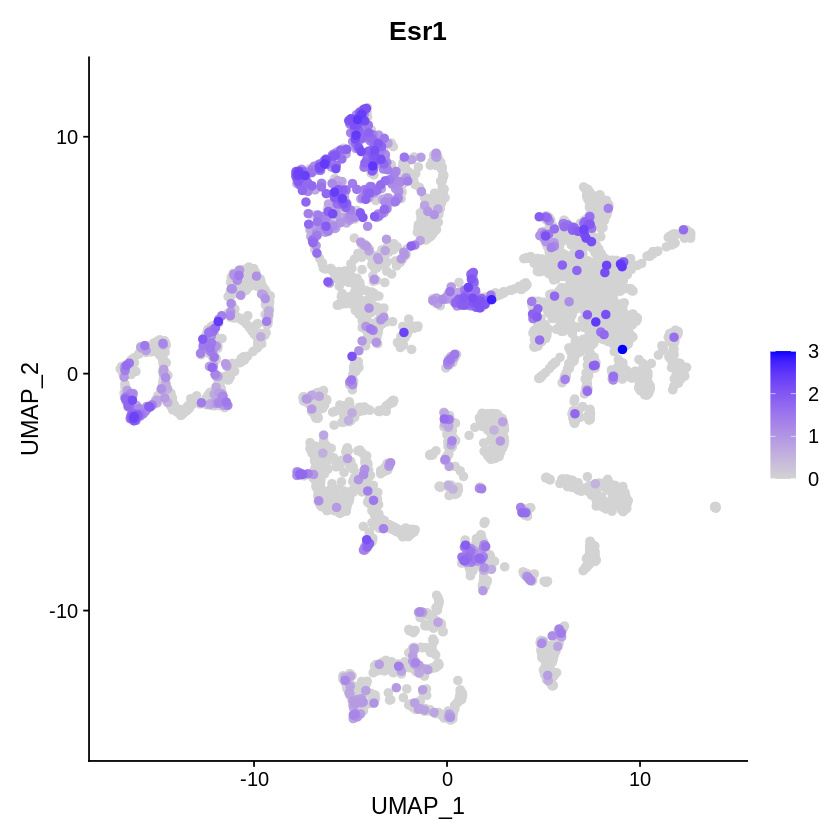

In [8]:
FeaturePlot(object =MPOA.integrated, features = c("Esr1"),pt.size=2,max.cutoff = 3,order = TRUE)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/feature_Esr1_3000_30_2_AM_AF.pdf",width=10,height=10)

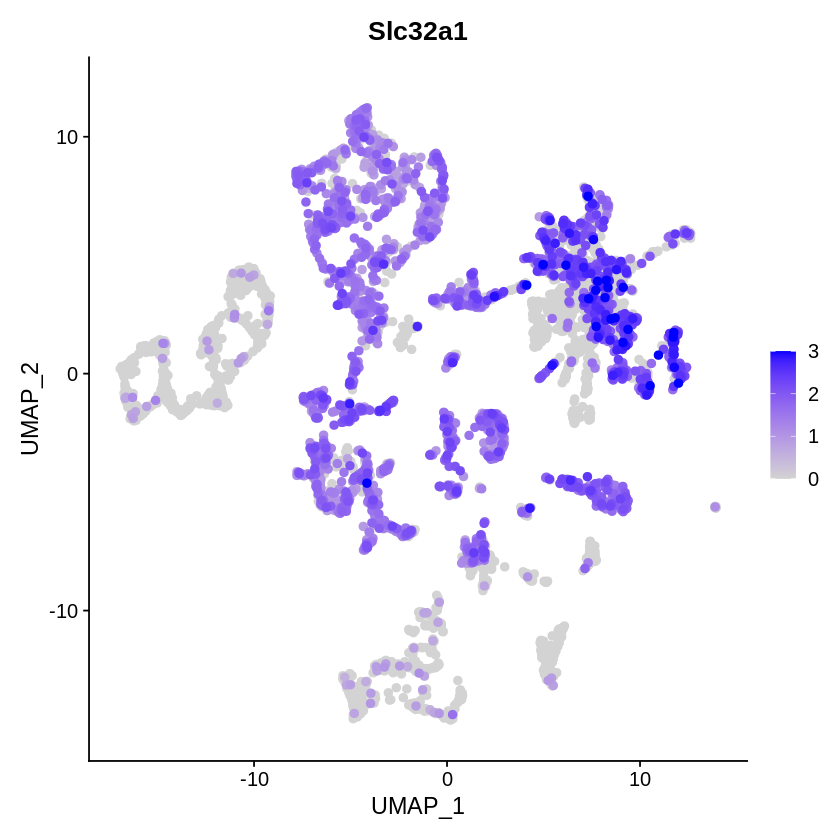

In [9]:
FeaturePlot(object =MPOA.integrated, features = c("Slc32a1"),pt.size=2,max.cutoff = 3,order = TRUE)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/feature_Slc32a1_3000_30_2_AM_AF.pdf",width=10,height=10)

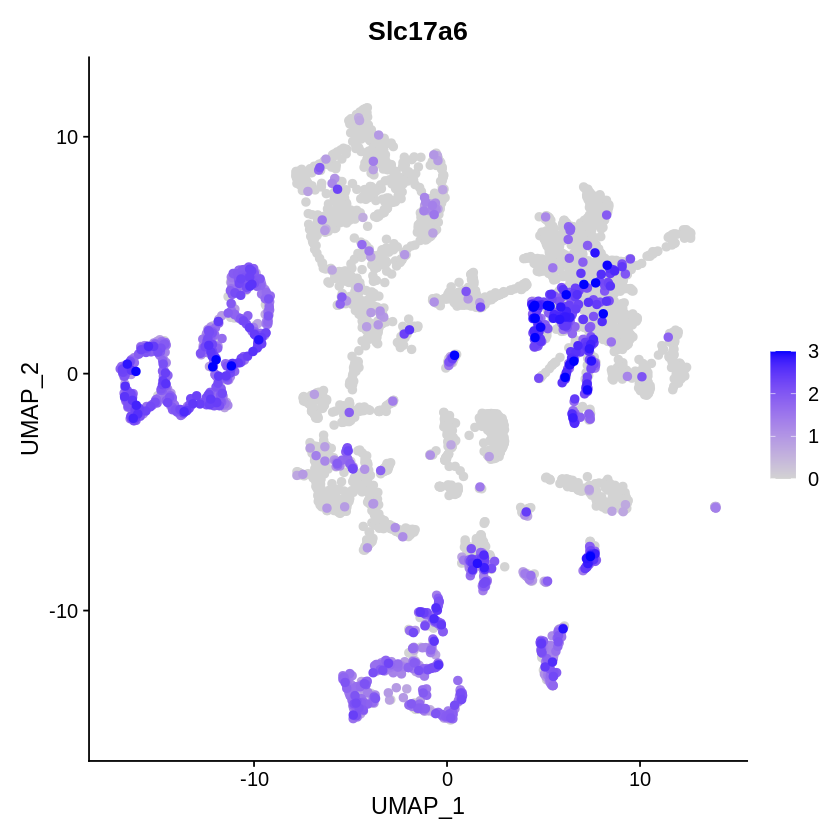

In [10]:
FeaturePlot(object =MPOA.integrated, features = c("Slc17a6"),pt.size=2,max.cutoff = 3,order = TRUE)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/feature_Slc17a6_3000_30_2_AM_AF.pdf",width=10,height=10)

# conserved markers for clusters

In [24]:
# one
cluster3<-FindConservedMarkers(MPOA.integrated, ident.1 = new.ident[3], grouping.var = "stim",print.bar = FALSE,min.cells.gene = 3, min.cells.group = 1)

Testing group P23F: (Vglu1) vs (Mix1, Vgat1, Vglu3, Vgat3, Vgat6, Vgat17, Mix2, Vgat13, Vgat4, Vgat10, Vgat16, Vgat2, Vgat8, Vglu4, Vglu10, Vgat11, Vgat7, Vglu5, Vglu7, Vglu6, Vglu8, Vglu12, Vglu2, Vglu11, Vgat9, Vgat15, Vglu9, Vgat20, Vgat12, Vgat18, Vgat5, Vgat19, Vgat14, Mix3, Ambiguous1)

Testing group AF: (Vglu1) vs (Vgat3, Mix1, Vgat6, Vglu3, Vgat17, Vgat20, Vgat7, Vgat1, Vglu11, Mix2, Vgat14, Vglu7, Ambiguous1, Vglu6, Vgat4, Vgat16, Vgat2, Vgat13, Vglu5, Vglu4, Vglu10, Vglu9, Vgat11, Vglu12, Vgat8, Vgat10, Vglu8, Vglu2, Vgat9, Vgat15, Vgat12, Vgat5, Vgat19, Vgat18, Mix3)

Testing group P35F: (Vglu1) vs (Mix1, Mix2, Vgat1, Vgat3, Vglu3, Vgat6, Vgat20, Vglu7, Vgat17, Vgat4, Vgat13, Vgat16, Vgat10, Vgat2, Vgat8, Vgat11, Vgat7, Vglu11, Vglu5, Vglu10, Vglu4, Vglu9, Vglu8, Vglu6, Vglu2, Vglu12, Vgat9, Vgat15, Vgat14, Mix3, Vgat5, Vgat12, Vgat18, Vgat19, Ambiguous1)

Testing group Cast: (Vglu1) vs (Mix2, Mix1, Vgat1, Vglu3, Vgat6, Vgat3, Vgat17, Vgat20, Vgat7, Mix3, Vglu7, Vglu8, Vgat8

In [32]:
mini<-subset(cluster3,P23F_avg_logFC>0 & P23F_p_val_adj<0.05)
mini[order(-mini["P23F_avg_logFC"]),]
mini[order(mini["P23F_p_val_adj"]),]

,P23F_p_val,P23F_avg_logFC,P23F_pct.1,P23F_pct.2,P23F_p_val_adj,AF_p_val,AF_avg_logFC,AF_pct.1,AF_pct.2,AF_p_val_adj,⋯,P35M_pct.1,P35M_pct.2,P35M_p_val_adj,P23M_p_val,P23M_avg_logFC,P23M_pct.1,P23M_pct.2,P23M_p_val_adj,max_pval,minimump_p_val
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Trh,7.474296e-42,2.9687970,0.426,0.043,1.520646e-37,3.220432e-15,2.0404359,0.219,0.054,6.551970e-11,⋯,0.260,0.075,1.845858e-13,4.742800e-09,2.0427135,0.247,0.123,9.649226e-05,4.742800e-09,7.654596e-53
Slc17a6,1.069278e-21,1.3535258,0.639,0.197,2.175445e-17,9.365206e-30,0.9551778,0.680,0.276,1.905351e-25,⋯,0.733,0.326,1.066491e-33,4.637839e-49,1.3012775,0.710,0.337,9.435684e-45,7.872598e-12,3.710271e-48
Reln,2.553229e-08,1.3067940,0.361,0.146,5.194545e-04,5.011594e-05,0.7031588,0.273,0.162,1.000000e+00,⋯,0.199,0.157,1.000000e+00,6.180813e-08,0.7556704,0.312,0.195,1.257486e-03,2.249998e-01,2.042583e-07
Cacna2d1,3.913701e-14,1.2591859,0.623,0.284,7.962424e-10,5.337876e-42,1.2918398,0.820,0.413,1.085991e-37,⋯,0.808,0.404,6.531634e-39,6.839189e-62,1.3002469,0.828,0.395,1.391433e-57,3.913701e-14,5.471351e-61
Nrn1,7.839894e-18,1.1125820,0.361,0.073,1.595026e-13,1.005721e-42,1.0063643,0.445,0.087,2.046139e-38,⋯,0.377,0.123,2.596842e-18,1.089655e-16,0.7142536,0.317,0.128,2.216902e-12,1.089655e-16,8.045766e-42
Resp18,1.133878e-10,0.9189217,0.738,0.579,2.306875e-06,7.062639e-15,0.7438368,0.758,0.665,1.436894e-10,⋯,0.616,0.635,3.431387e-02,5.893442e-10,0.4584674,0.672,0.646,1.199021e-05,9.372276e-03,5.650111e-14
C1ql1,2.071729e-06,0.8805699,0.197,0.057,4.214932e-02,3.222209e-06,0.6142074,0.141,0.049,6.555585e-02,⋯,0.233,0.064,4.116853e-12,1.425362e-04,0.7430322,0.210,0.132,1.000000e+00,1.425362e-04,2.569908e-22
Pgrmc1,6.723796e-15,0.8448609,0.918,0.879,1.367956e-10,6.959998e-17,0.5246518,0.914,0.878,1.416012e-12,⋯,0.945,0.908,1.503857e-21,2.173305e-27,0.5854479,0.898,0.896,4.421590e-23,1.751449e-07,1.738644e-26
Pcsk2,1.169260e-07,0.8285779,0.672,0.504,2.378859e-03,2.931507e-03,0.3563222,0.555,0.520,1.000000e+00,⋯,0.671,0.469,1.975344e-12,2.053622e-19,0.8240743,0.629,0.429,4.178093e-15,2.931507e-03,1.642897e-18


,P23F_p_val,P23F_avg_logFC,P23F_pct.1,P23F_pct.2,P23F_p_val_adj,AF_p_val,AF_avg_logFC,AF_pct.1,AF_pct.2,AF_p_val_adj,⋯,P35M_pct.1,P35M_pct.2,P35M_p_val_adj,P23M_p_val,P23M_avg_logFC,P23M_pct.1,P23M_pct.2,P23M_p_val_adj,max_pval,minimump_p_val
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Trh,7.474296e-42,2.9687970,0.426,0.043,1.520646e-37,3.220432e-15,2.0404359,0.219,0.054,6.551970e-11,⋯,0.260,0.075,1.845858e-13,4.742800e-09,2.0427135,0.247,0.123,9.649226e-05,4.742800e-09,7.654596e-53
mt-Co3,5.032365e-22,0.8285038,1.000,1.000,1.023835e-17,1.659417e-37,0.6364041,0.992,0.996,3.376083e-33,⋯,1.000,0.998,2.143758e-39,6.195305e-36,0.5893468,1.000,1.000,1.260435e-31,5.032365e-22,3.835876e-52
Slc17a6,1.069278e-21,1.3535258,0.639,0.197,2.175445e-17,9.365206e-30,0.9551778,0.680,0.276,1.905351e-25,⋯,0.733,0.326,1.066491e-33,4.637839e-49,1.3012775,0.710,0.337,9.435684e-45,7.872598e-12,3.710271e-48
mt-Atp6,1.570615e-20,0.7533318,1.000,1.000,3.195415e-16,1.679509e-32,0.5825026,1.000,0.998,3.416961e-28,⋯,1.000,0.998,2.313486e-38,3.733055e-19,0.5190500,1.000,0.999,7.594900e-15,3.733055e-19,1.668333e-44
mt-Co2,1.889537e-20,0.7987677,1.000,0.998,3.844264e-16,5.738254e-35,0.5987303,0.992,0.991,1.167448e-30,⋯,1.000,0.993,5.211396e-39,2.447270e-19,0.5227887,0.995,0.993,4.978972e-15,2.447270e-19,9.640661e-46
mt-Co1,4.608798e-20,0.7379258,1.000,0.999,9.376600e-16,5.143737e-38,0.5871143,1.000,0.994,1.046493e-33,⋯,1.000,0.996,1.909175e-39,4.180837e-24,0.5460696,1.000,1.000,8.505914e-20,4.608798e-20,1.145182e-48
mt-Cytb,3.447062e-19,0.6367937,1.000,0.998,7.013049e-15,4.000494e-29,0.4824908,1.000,0.988,8.139005e-25,⋯,0.993,0.994,2.281166e-35,5.899271e-17,0.5145424,0.995,0.997,1.200207e-12,5.899271e-17,4.482814e-40
mt-Nd1,8.629253e-19,0.7138339,1.000,0.998,1.755622e-14,2.219261e-32,0.5787137,1.000,0.991,4.515086e-28,⋯,1.000,0.996,2.222216e-32,6.468019e-20,0.5602661,1.000,0.998,1.315919e-15,8.629253e-19,2.757304e-43
Nrn1,7.839894e-18,1.1125820,0.361,0.073,1.595026e-13,1.005721e-42,1.0063643,0.445,0.087,2.046139e-38,⋯,0.377,0.123,2.596842e-18,1.089655e-16,0.7142536,0.317,0.128,2.216902e-12,1.089655e-16,8.045766e-42


In [50]:
#Cell_type<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vglu1","Vglu2","Vglu3","Vglu4","Mix1","Mix2","Mix3","Ambiguous")
for (i in 1:length(new.ident)){
one.markers <- FindConservedMarkers(MPOA.integrated, ident.1 = new.ident[i], grouping.var = "stim",print.bar = FALSE,min.cells.gene = 3, min.cells.group = 1)
sort_marker<-one.markers[order(-one.markers["AM_avg_logFC"]),]
write.xlsx2(sort_marker,file=(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/Neurons/conserved_markers/integrated/",new.ident[i],"_gene.xlsx",sep="")))}

Testing group P23F: (Mix1) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group AF: (Mix1) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P35F: (Mix1) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group Cast: (Mix1) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Vgat18, Vglu3

Testing group P23M: (Vgat2) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P23F: (Vgat3) vs (Vgat7, Mix2, Vgat5, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group AF: (Vgat3) vs (Vgat7, Mix2, Vgat5, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P35F: (Vgat3) vs (Vgat7, Mix2, Vgat5, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3

Testing group P35M: (Vgat6) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P23M: (Vgat6) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P23F: (Vgat7) vs (Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group AF: (Vgat7) vs (Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3

Testing group AM: (Vgat9) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P35M: (Vgat9) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P23M: (Vgat9) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P23F: (Vgat10) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3

Testing group OVX: (Vgat11) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat15, Low1)
Testing group AM: (Vgat11) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat15, Low1)
Testing group P35M: (Vgat11) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat15, Low1)
Testing group P23M: (Vgat11) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18

Testing group Cast: (Vgat13) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group OVX: (Vgat13) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group AM: (Vgat13) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P35M: (Vgat13) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vglu5, Mix1, Vgat18, Vglu3,

Testing group P35F: (Vgat14) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group Cast: (Vgat14) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group OVX: (Vgat14) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group AM: (Vgat14) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat16, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3,

Testing group AF: (Vgat16) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P35F: (Vgat16) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group Cast: (Vgat16) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group OVX: (Vgat16) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat19, Vgat2, Vglu6, Vgat10, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3,

Testing group P23F: (Vgat19) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group AF: (Vgat19) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group P35F: (Vgat19) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3, Vglu4, Vglu2, Vglu7, Vglu1, Vglu10, Vglu8, Vglu9, Vgat20, Vglu11, Vgat11, Vgat15, Low1)
Testing group Cast: (Vgat19) vs (Vgat7, Mix2, Vgat5, Vgat3, Vgat1, Vgat17, Vgat8, Vgat12, Vgat4, Vgat9, Vgat2, Vglu6, Vgat10, Vgat16, Vgat14, Vgat6, Vgat13, Vglu5, Mix1, Vgat18, Vglu3

In [109]:
i<-34
one.markers <- FindConservedMarkers(MPOA.integrated, ident.1 = new.ident[i], grouping.var = "stim",print.bar = FALSE,min.cells.gene = 1, min.cells.group = 1)
sort_marker<-one.markers[order(-one.markers["AF_avg_logFC"]),]
write.xlsx2(sort_marker,file=(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/conserved_markers/RNA/",new.ident[i],"_gene.xlsx",sep="")))

Testing group AF: (Ambiguous1) vs (Vgat3, Mix1, Vgat6, Vglu1, Vglu3, Vgat17, Vgat20, Vgat7, Vgat1, Vglu11, Mix2, Vgat14, Vglu7, Vglu6, Vgat4, Vgat16, Vgat2, Vgat13, Vglu5, Vglu4, Vglu10, Vglu9, Vgat11, Vglu12, Vgat8, Vgat10, Vglu8, Vglu2, Vgat9, Vgat15, Vgat12, Vgat5, Vgat19, Vgat18, Mix3)

Warning message:
“Identity: Ambiguous1 not present in group AM. Skipping AM”
Warning message:
“Only a single group was tested”


In [14]:
#counting the total number of marker genes

In [15]:
files<-list.files(path="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/conserved_markers/RNA/",pattern="*.xlsx",full.names=TRUE)
marker<-numeric()
for(i in 1:length(files)){
temp<-subset(read.xlsx(files[i],sheetIndex=1),AF_p_val<0.05 & AF_avg_logFC>0)[,1]
marker<-c(marker,temp)
}
length(unique(marker))

[1] 434

In [108]:
DefaultAssay(MPOA.integrated) <- "RNA"

# Cell_number

In [6]:
# absolute %
Cell_type<-c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")

# make a data frame for cell number (this data frame is a simple version giving single value for each cluster) 
Cell_number<- data.frame("type" =c(Cell_type,Cell_type,Cell_type,Cell_type), "Cond" = c(rep("P23M",length(Cell_type)),rep("P35M",length(Cell_type)),rep("AM",length(Cell_type)),rep("Cast",length(Cell_type)),rep("P23F",length(Cell_type)),rep("P35F",length(Cell_type)),rep("AF",length(Cell_type)),rep("OVX",length(Cell_type))))
# be careful with how you define factor and levels
as.factor(Cell_number$type)
levels(Cell_number$type)<-c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
as.factor(Cell_number$Cond)
levels(Cell_number$Cond)<-c("P23M","P35M","AM","Cast","P23F","P35F","AF","OVX")

Numberofcells<-vector(mode="numeric", length=0)
proportion<-vector(mode="numeric", length=0)
Esr1<-vector(mode="numeric", length=0)
Ar<-vector(mode="numeric", length=0)

for (i in 1:dim(Cell_number)[1]){if (exists(paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))){
    Numberofcells[i]<-length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))}
                                else{Numberofcells[i]<-0}}
Cell_number$len<-Numberofcells

for (i in 1:dim(Cell_number)[1]){if (Cell_number$Cond[i]=="AM"){proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("AM",Cell_number$Cond)])
                                                               Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                                               Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]} 
                                 else if(Cell_number$Cond[i]=="Cast") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("Cast",Cell_number$Cond)])
                                                                      Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                                                      Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]}
     else if(Cell_number$Cond[i]=="P35M") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("P35M",Cell_number$Cond)])
                                          Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                          Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]}
       else if(Cell_number$Cond[i]=="P23M") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("P23M",Cell_number$Cond)])
                                            Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                            Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]}  
else if(Cell_number$Cond[i]=="OVX") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("OVX",Cell_number$Cond)])
                                    Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                    Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]}
    else if(Cell_number$Cond[i]=="P23F") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("P23F",Cell_number$Cond)])
                                         Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                         Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]}
        else if(Cell_number$Cond[i]=="P35F") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("P35F",Cell_number$Cond)])
                                             Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                             Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]}
            else if(Cell_number$Cond[i]=="AF") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/sum(Cell_number$len[grep("AF",Cell_number$Cond)])
                                               Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]
                                               Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep="")))]>0)/Cell_number$len[i]}}
Cell_number$prop<-proportion

Cell_number$Esr1<-Esr1
Cell_number$Ar<-Ar


[1] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
  [7] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
 [13] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
 [19] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
 [25] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
 [31] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
 [37] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
 [43] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
 [49] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
 [55] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
 [61] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
 [67] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
 [73] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
 [79] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
 [85] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
 [91] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
 [97] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[103] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[109] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[115] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[121] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[127] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[133] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[139] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[145] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[151] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[157] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[163] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[169] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[175] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[181] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[187] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[193] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[199] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[205] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[211] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[217] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[223] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[229] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[235] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[241] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[247] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[253] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[259] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[265] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[271] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[277] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[283] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
36 Levels: Ambiguous1 Mix1 Mix2 Mix3 Vgat1 Vgat10 Vgat11 Vgat12 ... Vglu9

[1] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
 [16] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
 [31] P23M P23M P23M P23M P23M P23M P35M P35M P35M P35M P35M P35M P35M P35M P35M
 [46] P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M
 [61] P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M AM   AM   AM  
 [76] AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM  
 [91] AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM  
[106] AM   AM   AM   Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast
[121] Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast
[136] Cast Cast Cast Cast Cast Cast Cast Cast Cast P23F P23F P23F P23F P23F P23F
[151] P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F
[166] P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F
[181] P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F
[196] P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F
[211] P35F P35F P35F P35F P35F P35F AF   AF   AF   AF   AF   AF   AF   AF   AF  
[226] AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF  
[241] AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   OVX  OVX  OVX 
[256] OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX 
[271] OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX 
[286] OVX  OVX  OVX 
Levels: AF AM Cast OVX P23F P23M P35F P35M

png 
  2

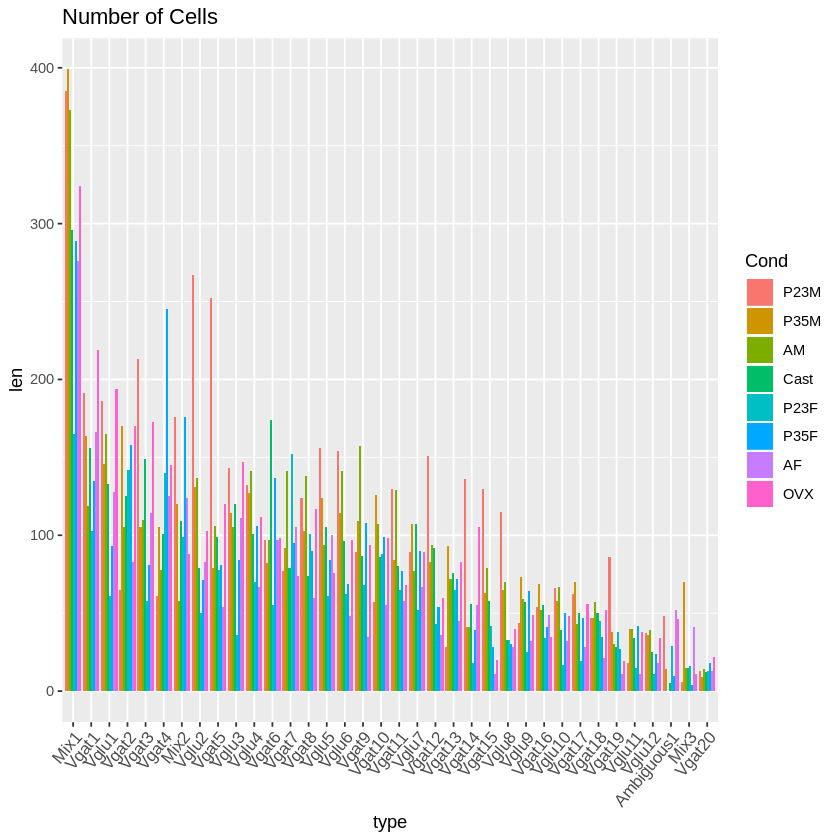

In [14]:
# number of cells in each cluster
ggplot(Cell_number,aes(x=type,y=len,fill=Cond))+geom_bar(stat = "identity",position=position_dodge())+theme(axis.text.x=element_text(size=10,angle = 50, hjust = 1))+ggtitle("Number of Cells")
dev.copy2pdf(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/number of cells.pdf",width=20,height=10)

png 
  2

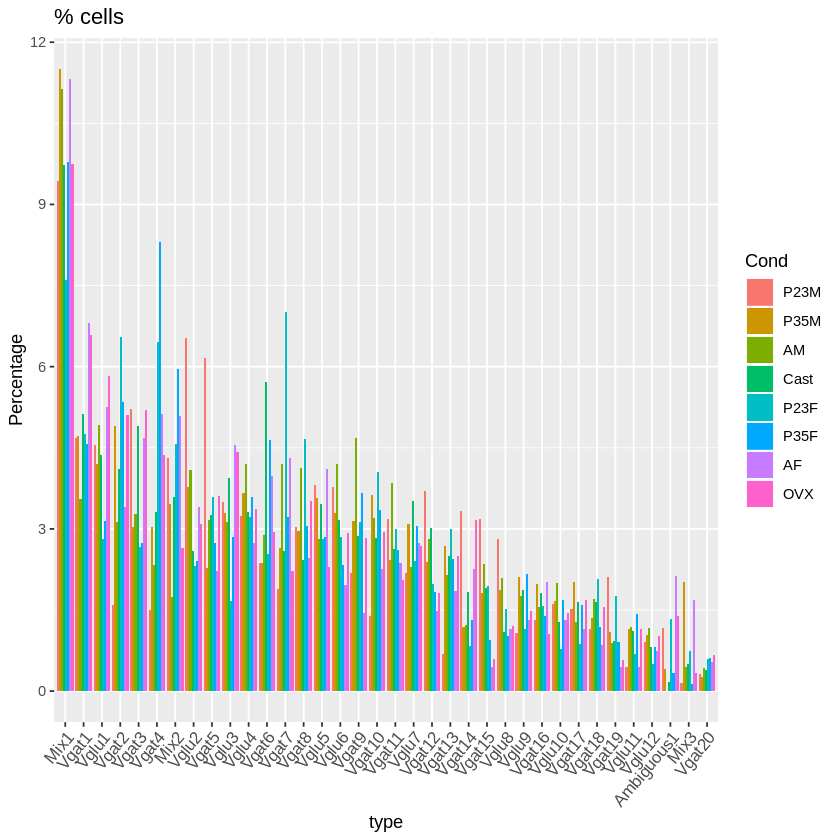

In [15]:
# proportion of cells
ggplot(Cell_number,aes(x=type,y=proportion,fill=Cond))+geom_bar(stat = "identity",position=position_dodge())+ylab("Percentage")+theme(axis.text.x=element_text(size=10,angle = 50, hjust = 1))+ggtitle("% cells")
dev.copy2pdf(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/percentageof cells.pdf",width=20,height=10)

Warning message:
“Removed 1 rows containing missing values (geom_bar).”

png 
  2

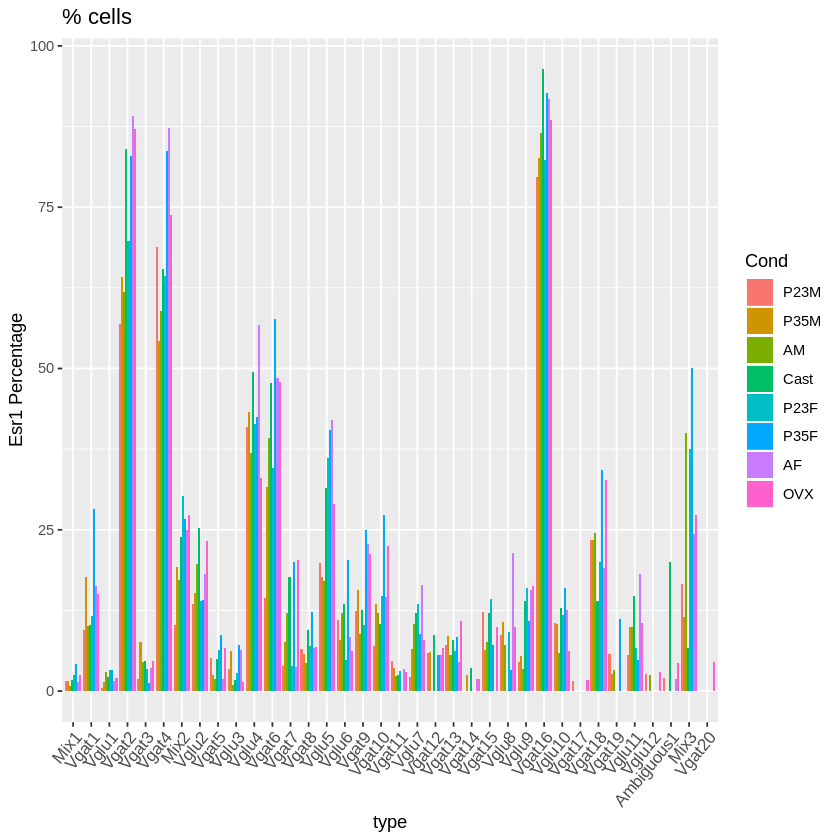

In [16]:
# proportion of cells
ggplot(Cell_number,aes(x=type,y=Esr1,fill=Cond))+geom_bar(stat = "identity",position=position_dodge())+ylab("Esr1 Percentage")+theme(axis.text.x=element_text(size=10,angle = 50, hjust = 1))+ggtitle("% cells")
dev.copy2pdf(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Esr1_percentage.pdf",width=24,height=6, paper = "letter")

Warning message:
“Removed 1 rows containing missing values (geom_bar).”

png 
  2

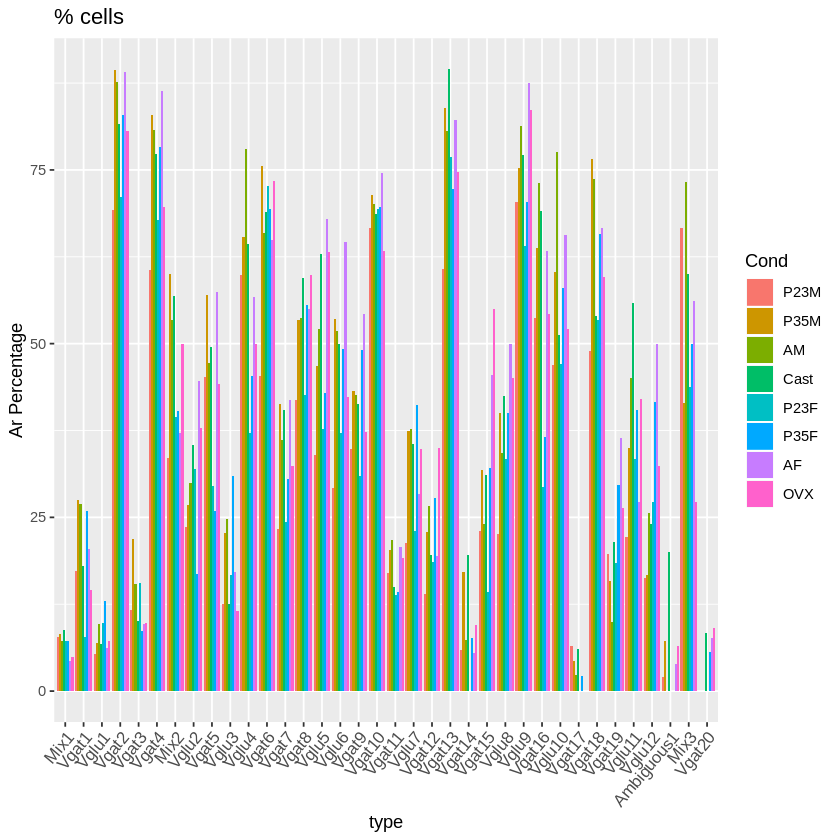

In [17]:
# proportion of cells
ggplot(Cell_number,aes(x=type,y=Ar,fill=Cond))+geom_bar(stat = "identity",position=position_dodge())+ylab("Ar Percentage")+theme(axis.text.x=element_text(size=10,angle = 50, hjust = 1))+ggtitle("% cells")
dev.copy2pdf(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Ar_percentage.pdf",,width=24,height=6, paper = "letter")

In [11]:
# relative % of cells between groups
Cell_type<-c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")

# make a data frame for cell number (this data frame is a simple version giving single value for each cluster) 
Cell_number<- data.frame("type" =c(Cell_type,Cell_type,Cell_type,Cell_type), "Cond" = c(rep("P23M",length(Cell_type)),rep("P35M",length(Cell_type)),rep("AM",length(Cell_type)),rep("Cast",length(Cell_type)),rep("P23F",length(Cell_type)),rep("P35F",length(Cell_type)),rep("AF",length(Cell_type)),rep("OVX",length(Cell_type))))
# be careful with how you define factor and levels
as.factor(Cell_number$type)
levels(Cell_number$type)<-c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
as.factor(Cell_number$Cond)
levels(Cell_number$Cond)<-c("P23M","P35M","AM","Cast","P23F","P35F","AF","OVX")

Numberofcells<-vector(mode="numeric", length=0)
proportion<-vector(mode="numeric", length=0)

for (i in 1:dim(Cell_number)[1]){if (exists(paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))){
    Numberofcells[i]<-length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))}
                                else{Numberofcells[i]<-0}}
Cell_number$len<-Numberofcells

for (i in 1:dim(Cell_number)[1]){if (Cell_number$Cond[i]=="AM"){proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}
                                                              
                                 else if(Cell_number$Cond[i]=="Cast") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}
     else if(Cell_number$Cond[i]=="P35M") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}
       else if(Cell_number$Cond[i]=="P23M") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))} 
else if(Cell_number$Cond[i]=="OVX") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}
    else if(Cell_number$Cond[i]=="P23F") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}
        else if(Cell_number$Cond[i]=="P35F") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}
            else if(Cell_number$Cond[i]=="AF") {proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))/length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}}

Cell_number$prop<-proportion


[1] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
  [7] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
 [13] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
 [19] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
 [25] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
 [31] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
 [37] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
 [43] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
 [49] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
 [55] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
 [61] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
 [67] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
 [73] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
 [79] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
 [85] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
 [91] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
 [97] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[103] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[109] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[115] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[121] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[127] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[133] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[139] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[145] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[151] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[157] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[163] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[169] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[175] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[181] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[187] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[193] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[199] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[205] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[211] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[217] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[223] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[229] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[235] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[241] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[247] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
[253] Mix1       Vgat1      Vglu1      Vgat2      Vgat3      Vgat4     
[259] Mix2       Vglu2      Vgat5      Vglu3      Vglu4      Vgat6     
[265] Vgat7      Vgat8      Vglu5      Vglu6      Vgat9      Vgat10    
[271] Vgat11     Vglu7      Vgat12     Vgat13     Vgat14     Vgat15    
[277] Vglu8      Vglu9      Vgat16     Vglu10     Vgat17     Vgat18    
[283] Vgat19     Vglu11     Vglu12     Ambiguous1 Mix3       Vgat20    
36 Levels: Ambiguous1 Mix1 Mix2 Mix3 Vgat1 Vgat10 Vgat11 Vgat12 ... Vglu9

[1] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
 [16] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
 [31] P23M P23M P23M P23M P23M P23M P35M P35M P35M P35M P35M P35M P35M P35M P35M
 [46] P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M
 [61] P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M AM   AM   AM  
 [76] AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM  
 [91] AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM  
[106] AM   AM   AM   Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast
[121] Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast
[136] Cast Cast Cast Cast Cast Cast Cast Cast Cast P23F P23F P23F P23F P23F P23F
[151] P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F
[166] P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F
[181] P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F
[196] P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F
[211] P35F P35F P35F P35F P35F P35F AF   AF   AF   AF   AF   AF   AF   AF   AF  
[226] AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF  
[241] AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   OVX  OVX  OVX 
[256] OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX 
[271] OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX 
[286] OVX  OVX  OVX 
Levels: AF AM Cast OVX P23F P23M P35F P35M

In [159]:
# 201124 relative % of cells between groups while adjusting by total number, extFig2, remove ambiguous
Cell_type<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3")

# make a data frame for cell number (this data frame is a simple version giving single value for each cluster) 
Cell_number<- data.frame("type" =c(Cell_type,Cell_type,Cell_type,Cell_type), "Cond" = c(rep("P23M",length(Cell_type)),rep("P35M",length(Cell_type)),rep("AM",length(Cell_type)),rep("Cast",length(Cell_type)),rep("P23F",length(Cell_type)),rep("P35F",length(Cell_type)),rep("AF",length(Cell_type)),rep("OVX",length(Cell_type))))
# be careful with how you define factor and levels
as.factor(Cell_number$type)
levels(Cell_number$type)<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3")
as.factor(Cell_number$Cond)
levels(Cell_number$Cond)<-c("P23M","P35M","AM","Cast","P23F","P35F","AF","OVX")

Numberofcells<-vector(mode="numeric", length=0)
proportion<-vector(mode="numeric", length=0)

for (i in 1:dim(Cell_number)[1]){if (exists(paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))){
    Numberofcells[i]<-length(eval(parse(text = paste(Cell_number$type[i],"_barcode","_",Cell_number$Cond[i],sep=""))))}
                                else{Numberofcells[i]<-0}}
Cell_number$len<-Numberofcells



[1] Vgat1  Vgat2  Vgat3  Vgat4  Vgat5  Vgat6  Vgat7  Vgat8  Vgat9  Vgat10
 [11] Vgat11 Vgat12 Vgat13 Vgat14 Vgat15 Vgat16 Vgat17 Vgat18 Vgat19 Vgat20
 [21] Vglu1  Vglu2  Vglu3  Vglu4  Vglu5  Vglu6  Vglu7  Vglu8  Vglu9  Vglu10
 [31] Vglu11 Vglu12 Mix1   Mix2   Mix3   Vgat1  Vgat2  Vgat3  Vgat4  Vgat5 
 [41] Vgat6  Vgat7  Vgat8  Vgat9  Vgat10 Vgat11 Vgat12 Vgat13 Vgat14 Vgat15
 [51] Vgat16 Vgat17 Vgat18 Vgat19 Vgat20 Vglu1  Vglu2  Vglu3  Vglu4  Vglu5 
 [61] Vglu6  Vglu7  Vglu8  Vglu9  Vglu10 Vglu11 Vglu12 Mix1   Mix2   Mix3  
 [71] Vgat1  Vgat2  Vgat3  Vgat4  Vgat5  Vgat6  Vgat7  Vgat8  Vgat9  Vgat10
 [81] Vgat11 Vgat12 Vgat13 Vgat14 Vgat15 Vgat16 Vgat17 Vgat18 Vgat19 Vgat20
 [91] Vglu1  Vglu2  Vglu3  Vglu4  Vglu5  Vglu6  Vglu7  Vglu8  Vglu9  Vglu10
[101] Vglu11 Vglu12 Mix1   Mix2   Mix3   Vgat1  Vgat2  Vgat3  Vgat4  Vgat5 
[111] Vgat6  Vgat7  Vgat8  Vgat9  Vgat10 Vgat11 Vgat12 Vgat13 Vgat14 Vgat15
[121] Vgat16 Vgat17 Vgat18 Vgat19 Vgat20 Vglu1  Vglu2  Vglu3  Vglu4  Vglu5 
[131] Vglu6  Vglu7  Vglu8  Vglu9  Vglu10 Vglu11 Vglu12 Mix1   Mix2   Mix3  
[141] Vgat1  Vgat2  Vgat3  Vgat4  Vgat5  Vgat6  Vgat7  Vgat8  Vgat9  Vgat10
[151] Vgat11 Vgat12 Vgat13 Vgat14 Vgat15 Vgat16 Vgat17 Vgat18 Vgat19 Vgat20
[161] Vglu1  Vglu2  Vglu3  Vglu4  Vglu5  Vglu6  Vglu7  Vglu8  Vglu9  Vglu10
[171] Vglu11 Vglu12 Mix1   Mix2   Mix3   Vgat1  Vgat2  Vgat3  Vgat4  Vgat5 
[181] Vgat6  Vgat7  Vgat8  Vgat9  Vgat10 Vgat11 Vgat12 Vgat13 Vgat14 Vgat15
[191] Vgat16 Vgat17 Vgat18 Vgat19 Vgat20 Vglu1  Vglu2  Vglu3  Vglu4  Vglu5 
[201] Vglu6  Vglu7  Vglu8  Vglu9  Vglu10 Vglu11 Vglu12 Mix1   Mix2   Mix3  
[211] Vgat1  Vgat2  Vgat3  Vgat4  Vgat5  Vgat6  Vgat7  Vgat8  Vgat9  Vgat10
[221] Vgat11 Vgat12 Vgat13 Vgat14 Vgat15 Vgat16 Vgat17 Vgat18 Vgat19 Vgat20
[231] Vglu1  Vglu2  Vglu3  Vglu4  Vglu5  Vglu6  Vglu7  Vglu8  Vglu9  Vglu10
[241] Vglu11 Vglu12 Mix1   Mix2   Mix3   Vgat1  Vgat2  Vgat3  Vgat4  Vgat5 
[251] Vgat6  Vgat7  Vgat8  Vgat9  Vgat10 Vgat11 Vgat12 Vgat13 Vgat14 Vgat15
[261] Vgat16 Vgat17 Vgat18 Vgat19 Vgat20 Vglu1  Vglu2  Vglu3  Vglu4  Vglu5 
[271] Vglu6  Vglu7  Vglu8  Vglu9  Vglu10 Vglu11 Vglu12 Mix1   Mix2   Mix3  
35 Levels: Mix1 Mix2 Mix3 Vgat1 Vgat10 Vgat11 Vgat12 Vgat13 Vgat14 ... Vglu9

[1] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
 [16] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
 [31] P23M P23M P23M P23M P23M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M
 [46] P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M
 [61] P35M P35M P35M P35M P35M P35M P35M P35M P35M P35M AM   AM   AM   AM   AM  
 [76] AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM  
 [91] AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM   AM  
[106] Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast
[121] Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast Cast
[136] Cast Cast Cast Cast Cast P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F
[151] P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F
[166] P23F P23F P23F P23F P23F P23F P23F P23F P23F P23F P35F P35F P35F P35F P35F
[181] P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F
[196] P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F P35F
[211] AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF  
[226] AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF   AF  
[241] AF   AF   AF   AF   AF   OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX 
[256] OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX 
[271] OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX  OVX 
Levels: AF AM Cast OVX P23F P23M P35F P35M

In [124]:
sum(subset(Cell_number,Cond=="P23M")$len)

[1] 4037

In [160]:
adjusted_len<-vector(mode="numeric", length=0)

for(i in 1:dim(Cell_number)[1]){
    adjusted_len[i]<-Cell_number$len[i]*sum(Cell_number$len)/sum(subset(Cell_number,Cond==Cell_number$Cond[i])$len)
}
Cell_number$adjusted_len<-adjusted_len

In [161]:
proportion<-vector(mode="numeric", length=0)
for(i in 1:dim(Cell_number)[1]){
    proportion[i]<-100*Cell_number$adjusted_len[i]/sum(subset(Cell_number,type==Cell_number$type[i])$adjusted_len)
    }
Cell_number$proportion<-proportion

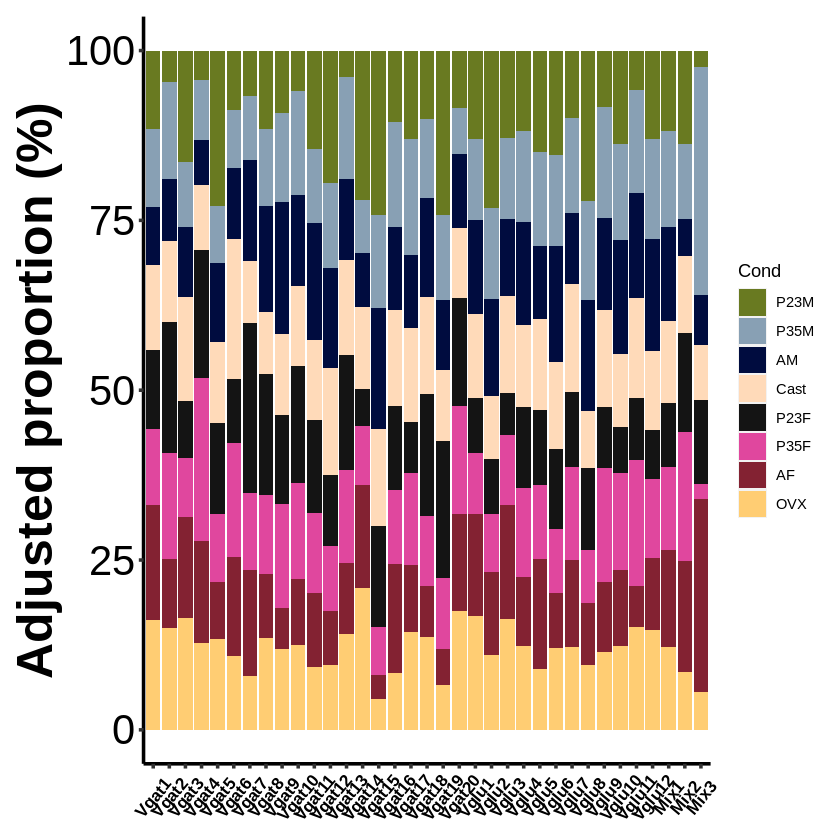

In [163]:
ggplot(Cell_number,aes(x=type,y=proportion,fill=Cond))+geom_bar(stat = "identity")+ylab("Adjusted proportion (%)")+
scale_fill_manual(values=c("#697A21", "#88A0B4", "#000C3F","#FFDAB9", "gray8","#E0479E","#832232","#FFCD73"))+
theme(axis.title.y=element_text(size=30,face="bold"),axis.title.x=element_blank(),axis.text.y=element_text(size=25,color="black"),axis.text.x=element_text(size=10,angle = 50, hjust = 0.5,vjust=0.5,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/proportion on top_adjusted.pdf",height=6, width=10 , paper = "letter")

# UMI

In [19]:
type<-numeric()
for(i in 1:dim(MPOA.integrated@meta.data)[1]){
    type[i]<-new.ident[[MPOA.integrated@meta.data$seurat_clusters[i]]]
}
type<-factor(type,levels=new.ident)
MPOA.integrated@meta.data$type<-type
#need to remove ambiguous1
MPOA.integrated@meta.data<-subset(MPOA.integrated@meta.data,type!="Ambiguous1")
MPOA.integrated@meta.data$type<-factor(MPOA.integrated@meta.data$type,levels=c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))

Warning message:
“`fun.y` is deprecated. Use `fun` instead.”


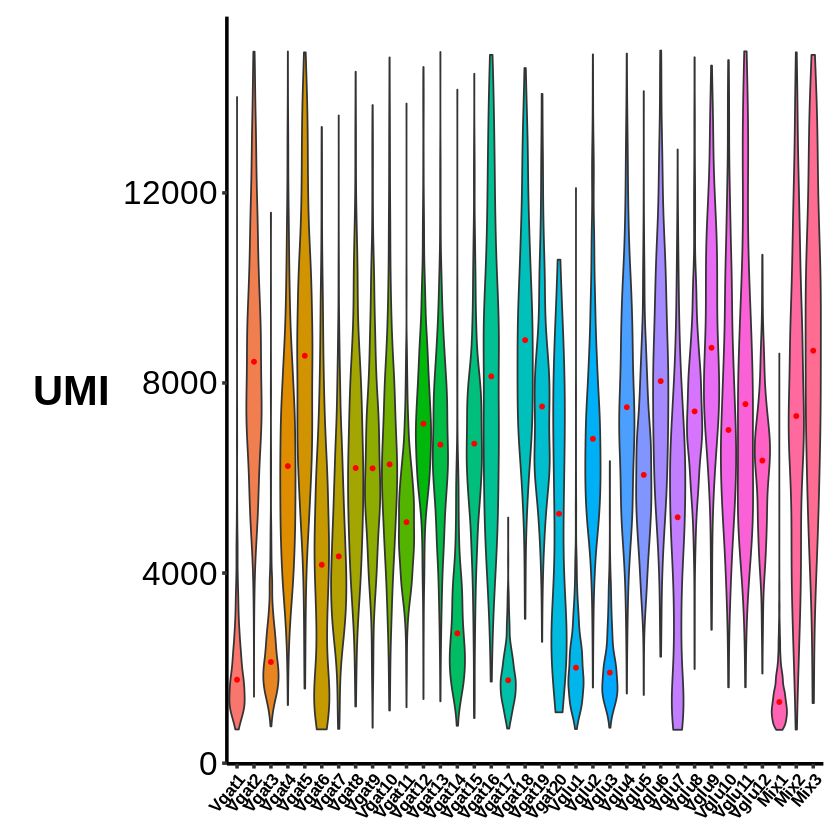

In [8]:
ggplot(MPOA.integrated@meta.data,aes_string(x="type",y="nCount_RNA",fill="type"))+geom_violin(scale = "width")+#scale_fill_manual(values=colors)+
stat_summary(fun.y=median, geom="point", size=1, color="red")+ylab("UMI")+ 
theme(axis.title.x=element_blank(),
,axis.text.y=element_text(size=20,color="black"),axis.title.y=element_text(size=25,angle=0,face="bold",margin = margin(t = 10, r = 8, b = 0, l = 10),vjust=0.5,color="black"),axis.text.x=element_text(size=10,angle=50,vjust=1,face="bold",hjust=1,color="black")
,axis.title=element_text(size=15,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position="none",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/UMI_Neurons.pdf",height=3, width=10 , paper = "letter")

Warning message:
“`fun.y` is deprecated. Use `fun` instead.”


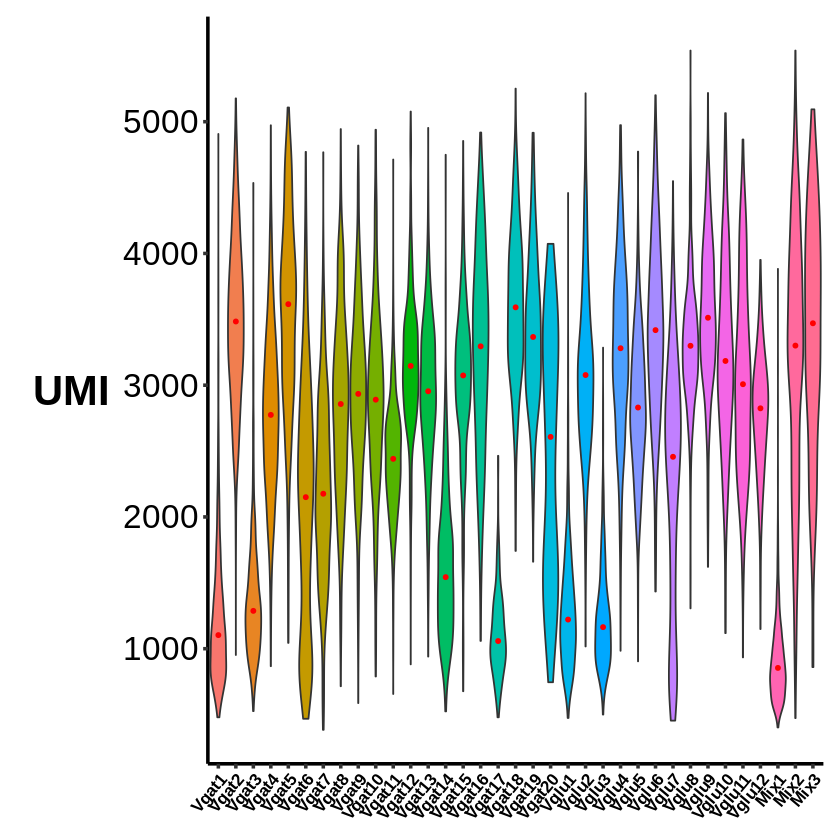

In [9]:
ggplot(MPOA.integrated@meta.data,aes_string(x="type",y="nFeature_RNA",fill="type"))+geom_violin(scale = "width")+#scale_fill_manual(values=colors)+
stat_summary(fun.y=median, geom="point", size=1, color="red")+ylab("UMI")+ 
theme(axis.title.x=element_blank(),
,axis.text.y=element_text(size=20,color="black"),axis.title.y=element_text(size=25,angle=0,face="bold",margin = margin(t = 10, r = 8, b = 0, l = 10),vjust=0.5,color="black"),axis.text.x=element_text(size=10,angle=50,vjust=1,face="bold",hjust=1,color="black")
,axis.title=element_text(size=15,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position="none",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/gene_Neurons.pdf",height=3, width=10 , paper = "letter")

Warning message:
“`fun.y` is deprecated. Use `fun` instead.”


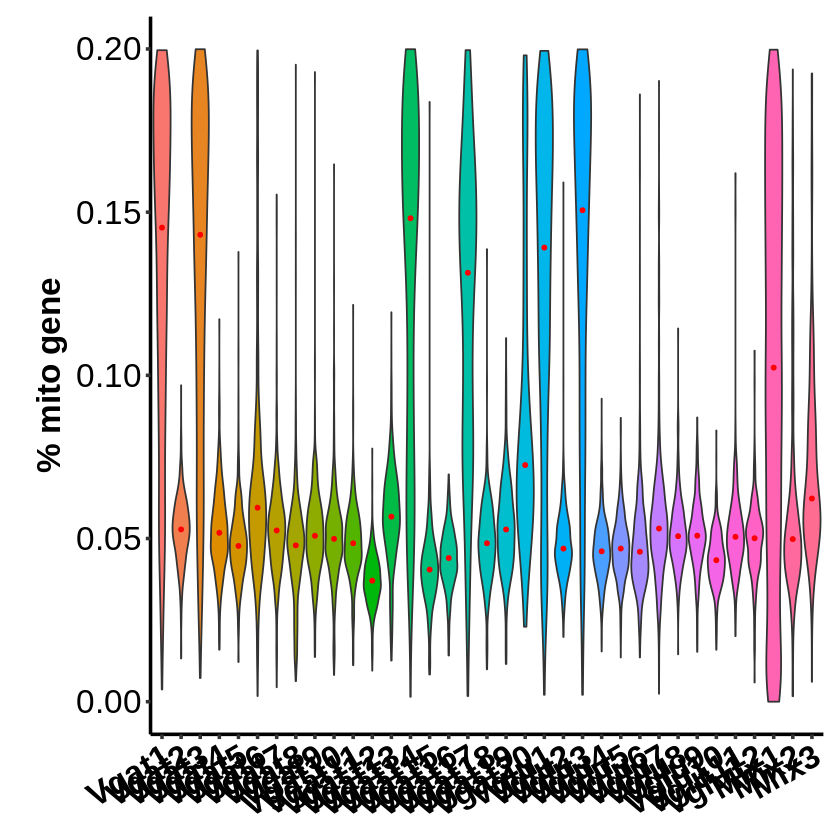

In [22]:
ggplot(MPOA.integrated@meta.data,aes_string(x="type",y="percent.mito",fill="type"))+geom_violin(scale = "width")+
stat_summary(fun.y=median, geom="point", size=1, color="red")+ylab("% mito gene")+ 
theme(axis.title.x=element_blank(),
,axis.text.y=element_text(size=20,color="black"),axis.title.y=element_text(size=20,angle=90,face="bold",margin = margin(t = 10, r = 8, b = 0, l = 10),vjust=0.5),axis.text.x=element_text(size=20,angle = 30, hjust = 1,vjust=1,color="black",face="bold")
,axis.title=element_text(size=30,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position="none",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/mito_Neurons.pdf",height=3, width=10 , paper = "letter")

# proportion combined condition

In [6]:
Cell_type<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20")
# make a data frame for cell number (this data frame is a simple version giving single value for each cluster) 
Cell_number<- data.frame("type" =Cell_type)
# be careful with how you define factor and levels
as.factor(Cell_number$type)
levels(Cell_number$type)<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20")

Numberofcells<-vector(mode="numeric", length=0)
proportion<-vector(mode="numeric", length=0)
Esr1<-vector(mode="numeric", length=0)
Ar<-vector(mode="numeric", length=0)

for (i in 1:dim(Cell_number)[1]){Numberofcells[i]<-length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))}
Cell_number$len<-Numberofcells

for (i in 1:dim(Cell_number)[1]){Esr1[i]<-100*sum(MPOA.integrated@assays$RNA["Esr1",eval(parse(text = paste(Cell_number$type[i],"_barcode",sep="")))]>0)/Cell_number$len[i]}
Cell_number$Esr1<-Esr1

for (i in 1:dim(Cell_number)[1]){Ar[i]<-100*sum(MPOA.integrated@assays$RNA["Ar",eval(parse(text = paste(Cell_number$type[i],"_barcode",sep="")))]>0)/Cell_number$len[i]}
Cell_number$Ar<-Ar

for (i in 1:dim(Cell_number)[1]){proportion[i]<-100*length(eval(parse(text = paste(Cell_number$type[i],"_barcode",sep=""))))/sum(Cell_number$len)}
Cell_number$prop<-proportion

[1] Vgat1  Vgat2  Vgat3  Vgat4  Vgat5  Vgat6  Vgat7  Vgat8  Vgat9  Vgat10
[11] Vgat11 Vgat12 Vgat13 Vgat14 Vgat15 Vgat16 Vgat17 Vgat18 Vgat19 Vgat20
20 Levels: Vgat1 Vgat10 Vgat11 Vgat12 Vgat13 Vgat14 Vgat15 Vgat16 ... Vgat9

In [7]:
color<-numeric()
for(i in 1:dim(Cell_number)[1]){
    if(Cell_number$Esr1[i]>50 & Cell_number$Ar[i]>50){color[i]<-"red"}
    else if(Cell_number$Esr1[i]<10 & Cell_number$Ar[i]>50){color[i]<-"blue"}
    else if(Cell_number$Esr1[i]<10 & Cell_number$Ar[i]<10){color[i]<-"gray"}  
        else{color[i]<-"black"}
}
    Cell_number$color<-color

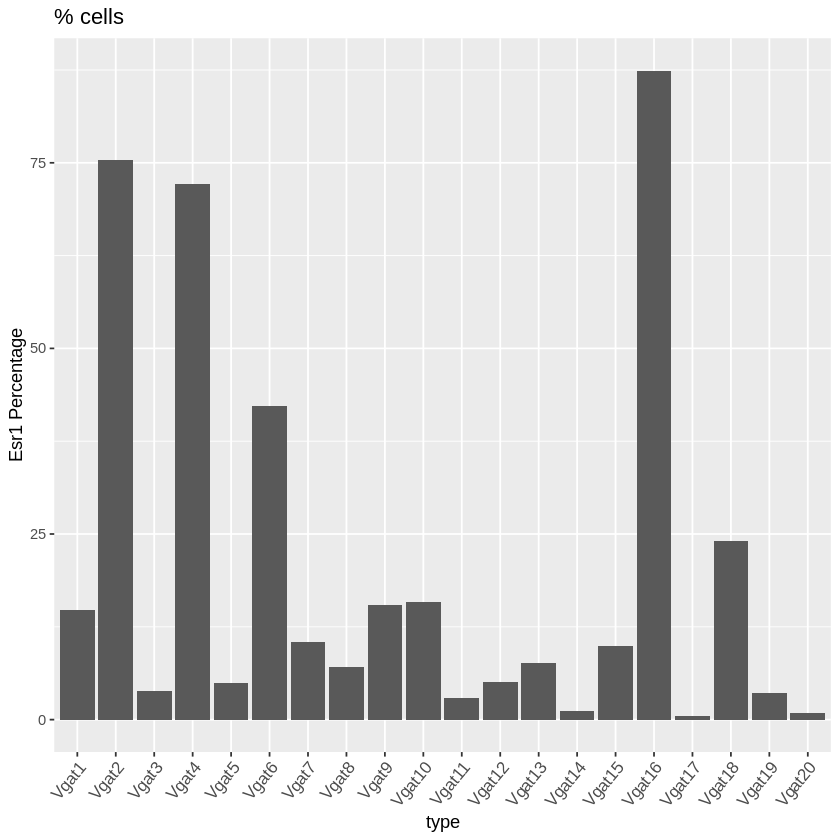

In [12]:
ggplot(Cell_number,aes(x=type,y=Esr1))+geom_bar(stat = "identity")+ylab("Esr1 Percentage")+theme(axis.text.x=element_text(size=10,angle = 50, hjust = 1))+ggtitle("% cells")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Esr1_percentage_comb_Vgat.pdf",width=24,height=6, paper = "letter")

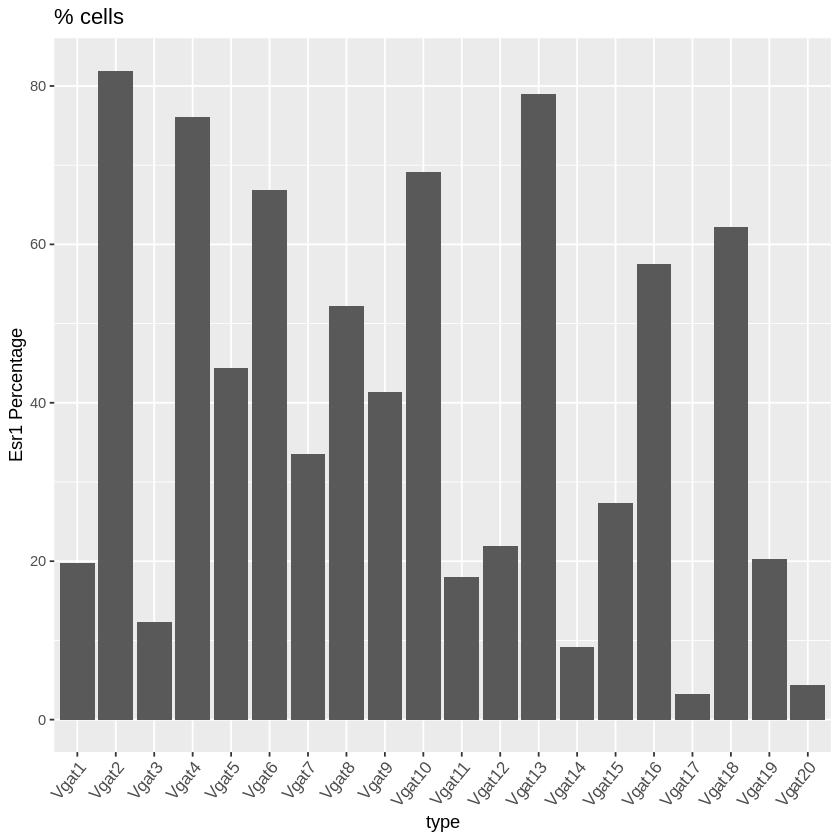

In [13]:
ggplot(Cell_number,aes(x=type,y=Ar))+geom_bar(stat = "identity")+ylab("Esr1 Percentage")+theme(axis.text.x=element_text(size=10,angle = 50, hjust = 1))+ggtitle("% cells")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Ar_percentage_comb_Vgat.pdf",width=24,height=6, paper = "letter")

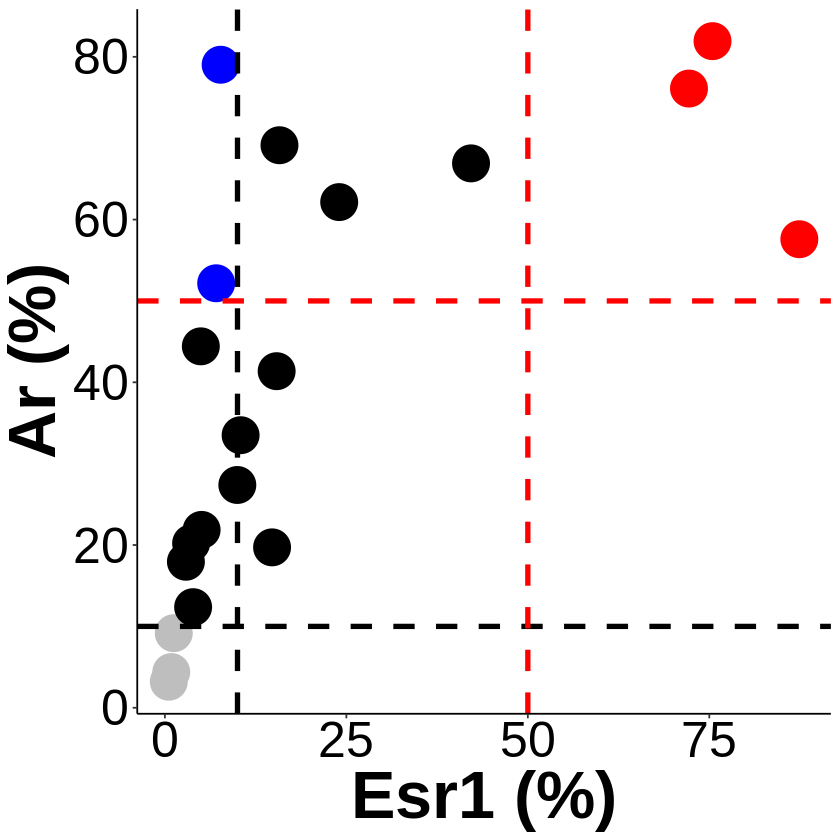

In [10]:
size=1.5
ggplot(Cell_number,aes(x=Esr1,y=Ar))+geom_point(size=10,color=color) +xlab("Esr1 (%)")+ylab("Ar (%)")+theme(axis.text.x=element_text(size=30, hjust = 0.5,color="black"),axis.text.y=element_text(size=30, hjust = 1,color="black"),axis.title.y=element_text(size=40,face="bold"),axis.title.x=element_text(size=40,face="bold",color="black"),plot.title = element_text(size=22),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black")) +geom_hline(yintercept=50, color='red',linetype = "dashed", size=size) +
    geom_hline(yintercept=10, color='black',linetype = "dashed", size=size) +
    geom_vline(xintercept=50, color='red',linetype = "dashed", size=size)+geom_vline(xintercept=10, color='black',linetype = "dashed", size=size)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Esr1_Ar_percentage_comb_Vgat_n.pdf",width=5,height=6, paper = "letter")
#Vgat 2,4,16 rich
#Vgat 8, 13 Ar
#Vgat 14,17,20

# GPCR

In [18]:
#http://www.informatics.jax.org/vocab/gene_ontology/GO:0004930
GPCR<-read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Yoshiko/LHb_integrate/clean/Neurons/gene2000_30/GPCR/results.xlsx", 1,stringsAsFactors = FALSE)
GPCR<-GPCR[grep("receptor",GPCR$detail1),]

In [19]:
Cell_type<-factor(rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20")),levels=rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20")))
gene_list<-intersect(unique(GPCR$gene),rownames(MPOA.integrated@assays$RNA@data))

In [20]:
gene_list<-sort(gene_list)

In [21]:
length(gene_list)

[1] 327

In [22]:
#gene_list<-rev(gene_list[1:82])
#gene_list<-rev(gene_list[83:164])
#gene_list<-rev(gene_list[165:246])
gene_list<-rev(gene_list[247:327])

In [23]:
Cell_type

[1] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
[11] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
20 Levels: Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 ... Vgat1

In [24]:
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

for (i in 1:length(gene_list)){
L<-length(Cell_type)

Cell_number_t<- data.frame("cluster" =Cell_type, "gene"=c(rep(gene_list[i],L)))
#used normalized uncorrected data
for (p in 1:length(Cell_type)){
Cell_number_t$pct[p]<-100*sum(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0)/length(eval(parse(text=paste(Cell_type[p],"_barcode",sep=""))))
Cell_number_t$avg[p]<-(mean(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])-mean(MPOA.integrated@assays$RNA@data[gene_list[i],]))/sd(MPOA.integrated@assays$RNA@data[gene_list[i],])
#for avg only consider the expressed cell
 #t<-LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0
# Cell_number_t$avg[p]<-mean(LHb.integrated@assays$RNA@data[gene_list[i],t])/sd(LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])    
    }
Cell_number<-rbind(Cell_number_t,Cell_number)}
as.factor(Cell_number$cluster)

[1] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
  [11] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
  [21] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
  [31] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
  [41] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
  [51] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
  [61] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
  [71] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
  [81] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
  [91] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [101] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [111] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [121] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [131] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [141] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [151] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [161] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [171] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [181] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [191] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [201] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [211] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [221] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [231] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [241] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [251] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [261] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [271] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [281] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [291] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [301] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [311] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [321] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [331] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [341] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [351] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [361] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [371] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [381] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [391] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [401] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [411] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [421] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [431] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [441] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [451] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [461] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [471] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [481] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [491] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [501] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [511] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 

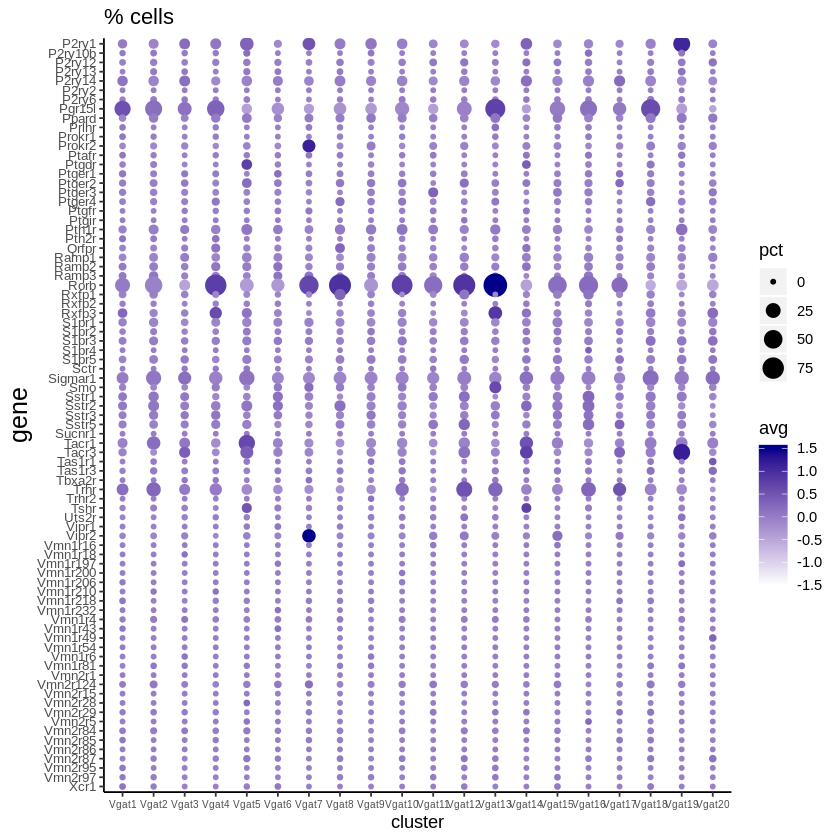

In [25]:
#reverse
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =rev(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1.5,1.5),oob=squish) + 
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title.y=element_text(size=15),axis.text.y=element_text(size=8),axis.text.x=element_text(size=6,angle = 0, hjust = 0.5),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"))+ggtitle("% cells")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/discplots_GPCR_genes_receptor_247-327rev.pdf",height=20, width=5 , paper = "letter")

# steroid hormone receptors

In [67]:
#http://www.informatics.jax.org/go/term/GO:0035258 steroid hormone receptor binding
NR<-read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201027_181629.xlsx", 1,stringsAsFactors = FALSE)

In [73]:
#201028 use this
steroid_receptor<-read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/DEG/GO_term_summary_steroid_hormone_receptor_activity.xlsx", 1,stringsAsFactors = FALSE)$Symbol
#nuclear_receptor<-read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/DEG/GO_term_summary_nuclear_receptor_activity.xlsx", 1,stringsAsFactors = FALSE)$Symbol
#NR<-read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201027_181629.xlsx", 1,stringsAsFactors = FALSE)$Symbol
HR_binding<-read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_114940_hormone_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol
genes<-unique(c(steroid_receptor,nuclear_receptor,HR_binding))
#genes<-unique(c(steroid_receptor,nuclear_receptor))
genes<-intersect(genes,rownames(MPOA.integrated@assays$RNA))

In [74]:
length(genes)

[1] 207

In [37]:
sum<-rowSums(as.matrix(MPOA.integrated@assays$RNA@data))
notzero<-numeric()
for(i in 1:length(sum)){
if(sum[[i]]>0){
    notzero<-c(notzero,i)
}else{
    notzero<-notzero
}
    }

In [75]:
# or only include something >X%
threshold<-10
temp<-as.matrix(MPOA.integrated@assays$RNA@data)
notzero<-numeric()
for(i in 1:dim(temp)[1]){
if(100*sum(temp[i,]>0)/dim(temp)[1] >threshold){
    notzero<-c(notzero,i)
}else{
    notzero<-notzero
}
    }

In [76]:
Cell_type<-factor(rev(c("Vgat2","Vgat4","Vgat6","Vgat16","Vgat13","Vgat8","Vgat1","Vgat10","Vgat18","Vgat7","Vgat3","Vgat9","Vgat17","Vgat15","Vgat12","Vgat19","Vgat5","Vgat14","Vgat11","Vgat20")),levels=rev(c("Vgat2","Vgat4","Vgat6","Vgat16","Vgat13","Vgat8","Vgat1","Vgat10","Vgat18","Vgat7","Vgat3","Vgat9","Vgat17","Vgat15","Vgat12","Vgat19","Vgat5","Vgat14","Vgat11","Vgat20")))
gene_list<-intersect(genes,rownames(MPOA.integrated@assays$RNA@data)[notzero])

In [77]:
gene_list<-sort(gene_list)

In [78]:
length(gene_list)

[1] 129

In [52]:
gene_list

[1] "Abhd2"    "Actn4"    "Adcyap1"  "Ar"       "Arid1a"   "Arnt"    
  [7] "Arrb1"    "Asah1"    "Asxl1"    "Bcas3"    "Brd8"     "C1d"     
 [13] "Calr"     "Cnot1"    "Cry2"     "Ctbp2"    "Ctnnb1"   "Dcaf1"   
 [19] "Dcaf13"   "Ddx5"     "Dnmt1"    "Ep300"    "Esr1"     "Esrra"   
 [25] "Ets2"     "Fkbp4"    "Fus"      "Fyn"      "Gas2l1"   "Gnao1"   
 [31] "Gnas"     "Grip1"    "Grm1"     "Gtf2b"    "Gtf2h1"   "Hif1a"   
 [37] "Hsd17b10" "Ipo13"    "Isl1"     "Jak1"     "Jak2"     "Jund"    
 [43] "Kdm1a"    "Kdm4c"    "Kdm5d"    "Lats1"    "Lcor"     "Lrif1"   
 [49] "Med1"     "Med13"    "Med24"    "Med25"    "Med30"    "Med4"    
 [55] "Mms19"    "Ncoa1"    "Ncoa2"    "Ncoa3"    "Ncoa6"    "Ncoa7"   
 [61] "Ncor1"    "Ncor2"    "Nr1d1"    "Nr1d2"    "Nr1h2"    "Nr2c2"   
 [67] "Nr2f1"    "Nr2f2"    "Nr2f6"    "Nr3c1"    "Nrbf2"    "Nrip1"   
 [73] "Nsd1"     "Paqr7"    "Paqr8"    "Park7"    "Parp1"    "Pgr"     
 [79] "Pias2"    "Pik3r1"   "Pkn1"     "Ppargc1a" "Ppargc1b" "Prkcb"   
 [85] "Prmt2"    "Prpf6"    "Psmc5"    "Ptpn11"   "Rnf14"    "Rnf4"    
 [91] "Rnf6"     "Rora"     "Rorb"     "Rxra"     "Rxrb"     "Rxrg"    
 [97] "Slc30a9"  "Smarca4"  "Smarcd3"  "Smarce1"  "Snw1"     "Socs2"   
[103] "Sra1"     "Src"      "Stat3"    "Stat5b"   "Strn"     "Sumo2"   
[109] "Tacc1"    "Tacc2"    "Tada3"    "Taf1"     "Taf10"    "Taf11"   
[115] "Taf7"     "Thra"     "Thrap3"   "Thrb"     "Tmf1"     "Tob2"    
[121] "Trim24"   "Trip12"   "Trip4"    "Uba3"     "Uimc1"    "Wbp2"    
[127] "Wipi1"    "Ywhah"    "Zbtb7a"

In [79]:
#categorizing gene_list
GR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_113846_glucocorticoid receptor binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
MR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_113928_mineralocorticoid_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
PR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_114024_progesterone_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
RXR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_114054_retinoid_X_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
GHR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_121321_growth_hormone_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
RAR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_121359_retinoic_acid_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
THR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_121456_thyroid_hormone_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
VDR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_121759_vitamin_D_receptor_bnding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
PHR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201117_121838_peptide_hormone_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
AR_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201116_233659_androgen_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
ER_binding<-unique(read.xlsx2(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/GO_term_summary_20201116_235009_estrogen_receptor_binding.xlsx", 1,stringsAsFactors = FALSE)$Symbol)
binding<-unique(c(GR_binding,MR_binding,PR_binding,RXR_binding,GHR_binding,RAR_binding,THR_binding,VDR_binding,PHR_binding,AR_binding,ER_binding))
gene_list[(!(gene_list %in% binding))]

[1] "Abhd2"   "Arid1a"  "Arnt"    "Asah1"   "Bcas3"   "C1d"     "Cry2"   
 [8] "Esrra"   "Hif1a"   "Jund"    "Ncoa6"   "Ncoa7"   "Nr1d1"   "Nr1d2"  
[15] "Nr2c2"   "Nr2f1"   "Nr2f2"   "Nr2f6"   "Nr3c1"   "Nrbf2"   "Paqr7"  
[22] "Paqr8"   "Pgr"     "Rora"    "Rorb"    "Rxrg"    "Slc30a9" "Smarcd3"
[29] "Smarce1" "Sra1"    "Tacc2"   "Tada3"   "Taf1"    "Thra"    "Thrb"   
[36] "Trim24"  "Uba3"

In [80]:
GR_binding<-c(GR_binding,"Nr3c1")
MR_binding<-c(MR_binding)
PR_binding<-c(PR_binding,"Pgr")
RXR_binding<-c(RXR_binding,"Nr2c2")
circadian<-c("Cry2","Nr1d1","Nr1d2")
GHR_binding<-c(GHR_binding)
RAR_binding<-c(RAR_binding,"Rora","Rorb","Rxrg")
THR_binding<-c(THR_binding,"Thra","Thrb")
VDR_binding<-c(VDR_binding,"Trim24")
PHR_binding<-c(PHR_binding)
AR_binding<-c(AR_binding)
ER_binding<-c(ER_binding,"Esrra")
other<-c("Abhd2","Arid1a","Arnt","Asah1","Bcas3","C1d","Hif1a","Jund","Ncoa6","Ncoa7","Nr2f1","Nr2f2","Nr2f6","Nrbf2","Paqr7","Paqr8","Slc30a9","Smarcd3","Smarce1","Sra1","Tacc2","Tada3","Taf1","Uba3")

In [81]:
gene_list<-unique(c(AR_binding,ER_binding,PR_binding,GR_binding,MR_binding,RXR_binding,GHR_binding,RAR_binding,THR_binding,VDR_binding,PHR_binding,circadian,other))

In [84]:
length(gene_list)

[1] 129

In [83]:
#one moretime
gene_list<-intersect(gene_list,rownames(MPOA.integrated@assays$RNA@data)[notzero])

In [86]:
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

for (i in 1:length(gene_list)){
L<-length(Cell_type)

Cell_number_t<- data.frame("cluster" =Cell_type, "gene"=c(rep(gene_list[i],L)))
#used normalized uncorrected data
for (p in 1:length(Cell_type)){
Cell_number_t$pct[p]<-100*sum(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0)/length(eval(parse(text=paste(Cell_type[p],"_barcode",sep=""))))
Cell_number_t$avg[p]<-(mean(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])-mean(MPOA.integrated@assays$RNA@data[gene_list[i],]))/sd(MPOA.integrated@assays$RNA@data[gene_list[i],])
   
    }
Cell_number<-rbind(Cell_number_t,Cell_number)}
as.factor(Cell_number$cluster)

[1] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
  [11] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
  [21] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
  [31] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
  [41] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
  [51] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
  [61] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
  [71] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
  [81] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
  [91] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [101] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [111] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [121] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [131] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [141] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [151] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [161] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [171] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [181] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [191] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [201] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [211] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [221] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [231] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [241] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [251] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [261] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [271] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [281] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [291] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [301] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [311] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [321] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [331] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [341] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [351] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [361] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [371] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [381] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [391] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [401] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [411] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [421] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [431] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [441] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [451] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [461] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [471] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [481] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [491] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 
 [501] Vgat20 Vgat11 Vgat14 Vgat5  Vgat19 Vgat12 Vgat15 Vgat17 Vgat9  Vgat3 
 [511] Vgat7  Vgat18 Vgat10 Vgat1  Vgat8  Vgat13 Vgat16 Vgat6  Vgat4  Vgat2 

In [87]:
saveRDS(Cell_number,"/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/Cell_number_steroid_receptor_activity_NR10%_binding.rds")

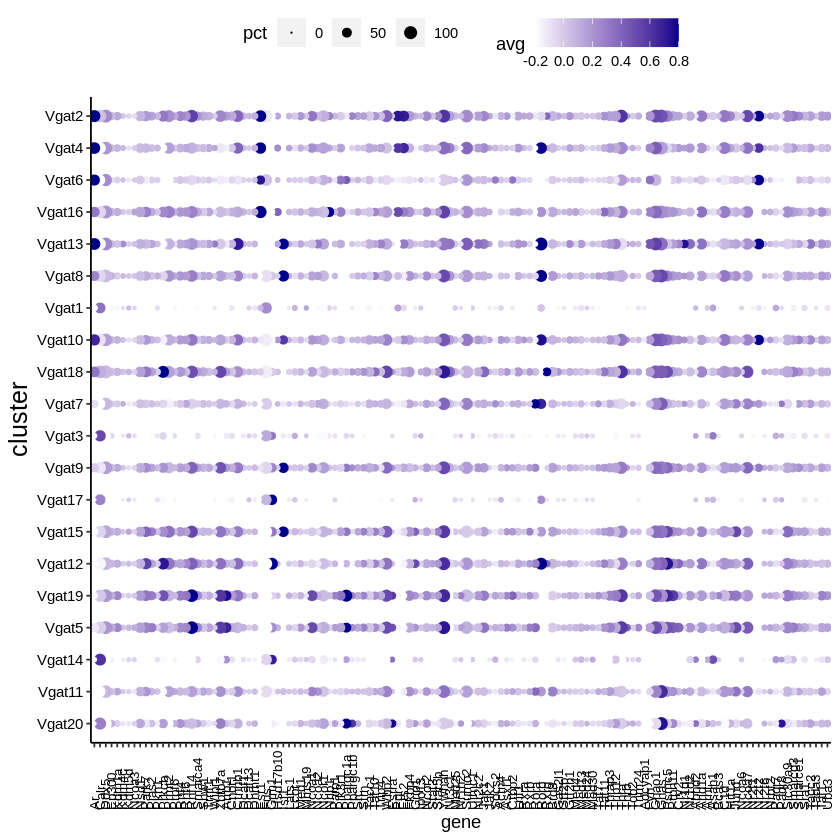

In [89]:
#reverse
ggplot(Cell_number, aes(gene, cluster)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$gene)))+scale_y_discrete(limits =(levels(Cell_number$cluster)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0.2,0.8),breaks=seq(-0.2,0.8,0.2),oob=squish) + scale_size_continuous(range = c(0,3),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title.y=element_text(size=15),axis.text.y=element_text(size=9,color="black"),axis.text.x=element_text(size=8,angle = 90, hjust = 0.,vjust=0.5,color="black"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position ="top")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/steroid hormone/NR_receptor_binding_activity_10_0.8_category.pdf",height=4, width=8 , paper = "letter")

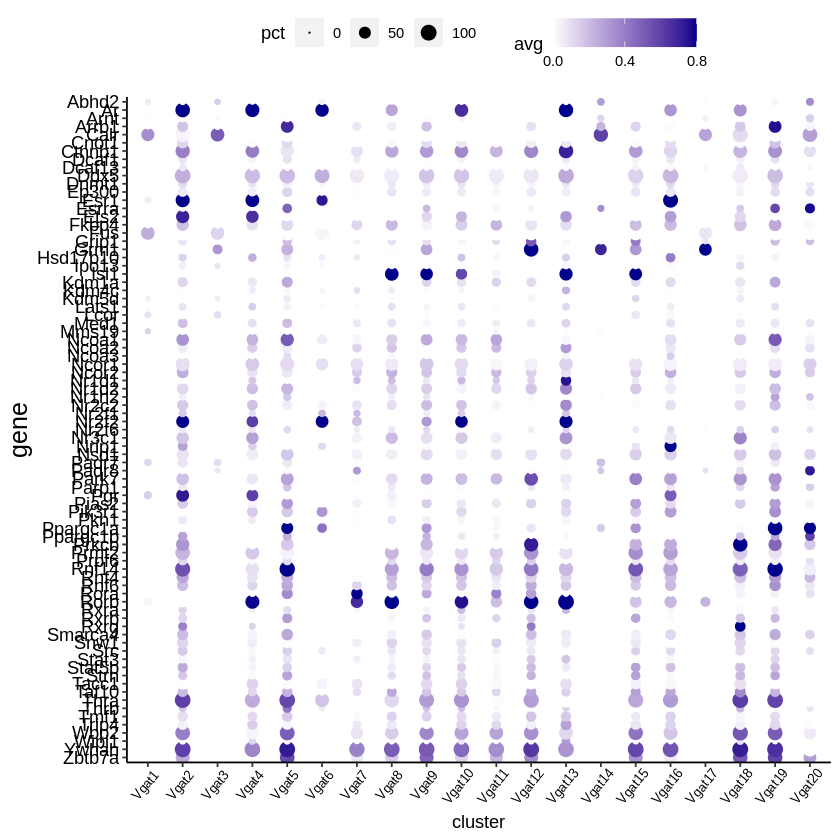

In [36]:
#reverse
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0,0.8),breaks=seq(0,0.8,0.4),oob=squish) + scale_size_continuous(range = c(0,3.8),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title.y=element_text(size=15),axis.text.y=element_text(size=11,color="black"),axis.text.x=element_text(size=8,angle = 50, hjust = 0.7,vjust=0.8,color="black"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position ="top")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/NR_receptorbinding_activity_rev10_0.8.pdf",height=20, width=4 , paper = "letter")

In [37]:
saveRDS(Cell_number,"/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Cell_number_steroid_receptor_activity_NR10%_binding.rds")

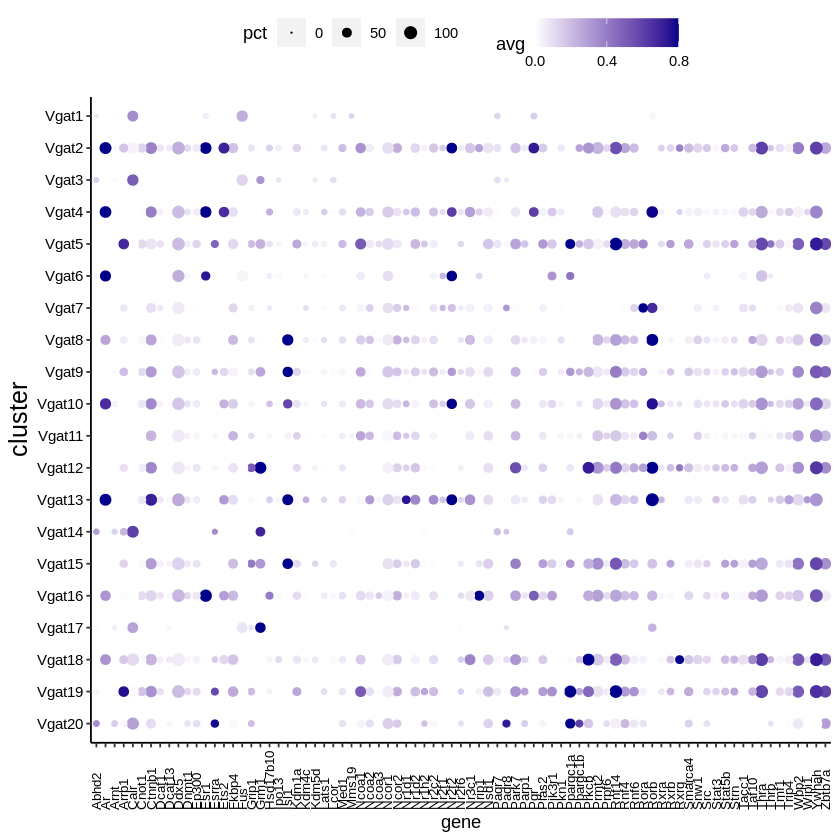

In [50]:
#reverse
ggplot(Cell_number, aes(gene, cluster)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$gene)))+scale_y_discrete(limits =(levels(Cell_number$cluster)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0,0.8),breaks=seq(0,0.8,0.4),oob=squish) + scale_size_continuous(range = c(0,3),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title.y=element_text(size=15),axis.text.y=element_text(size=9,color="black"),axis.text.x=element_text(size=8,angle = 90, hjust = 0.,vjust=0.5,color="black"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position ="top")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/NR_receptor_binding_activity_10_0.8.pdf",height=4, width=8 , paper = "letter")

# violin for particular genes across ages/sexes

In [7]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu12","Mix1","Mix2","Mix3","Ambiguous1"))

In [7]:

#initialize empty data frame
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)
cond<-rev(c("P23M","P35M","AM","Cast","P23F","P35F","AF","OVX"))
for (l in 1:length(cond)){
for (i in 1:length(Cell_type)){
L<-length(eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep=""))))

Cell_number_t<- data.frame("type" =c(rep(Cell_type[i],L)), "Cond" = c(rep(cond[l],L)))
#used normalized uncorrected data
Cell_number_t$Slc32a1<-MPOA.integrated@assays$RNA@data["Slc32a1",eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep="")))]
Cell_number_t$Slc17a6<-MPOA.integrated@assays$RNA@data["Slc17a6",eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep="")))] 
Cell_number_t$Esr1<-MPOA.integrated@assays$RNA@data["Esr1",eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep="")))]
Cell_number_t$Ar<-MPOA.integrated@assays$RNA@data["Ar",eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep="")))] 
Cell_number_t$Pgr<-MPOA.integrated@assays$RNA@data["Pgr",eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep="")))]
Cell_number_t$Moxd1<-MPOA.integrated@assays$RNA@data["Moxd1",eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep="")))] 
Cell_number_t$Dlx1<-MPOA.integrated@assays$RNA@data["Dlx1",eval(parse(text = paste(Cell_type[i],"_barcode_",cond[l],sep="")))]
Cell_number<-rbind(Cell_number_t,Cell_number)}}

as.factor(Cell_number$type)
as.factor(Cell_number$Cond)

[1] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
    [7] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [13] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [19] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [25] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [31] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [37] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [43] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [49] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [55] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [61] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [67] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [73] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [79] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [85] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [91] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
   [97] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [103] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [109] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [115] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [121] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [127] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [133] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [139] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [145] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [151] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [157] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [163] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [169] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [175] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [181] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat1     
  [187] Vgat1      Vgat1      Vgat1      Vgat1      Vgat1      Vgat2     
  [193] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [199] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [205] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [211] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [217] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [223] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [229] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [235] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [241] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [247] Vgat2      Vgat2      Vgat2      Vgat2      Vgat2      Vgat2     
  [253] Vgat2      Vgat2      Vgat2      Vgat2      Vgat3      Vgat3     
  [259] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [265] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [271] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [277] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [283] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [289] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [295] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [301] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [307] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [313] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [319] Vgat3      Vgat3      Vgat3      Vgat3      Vgat3      Vgat3     
  [325] 

[1] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
   [15] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
   [29] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
   [43] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
   [57] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
   [71] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
   [85] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
   [99] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [113] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [127] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [141] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [155] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [169] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [183] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [197] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [211] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [225] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [239] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [253] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [267] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [281] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [295] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [309] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [323] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [337] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [351] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [365] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [379] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [393] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [407] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [421] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [435] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [449] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [463] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [477] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [491] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [505] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [519] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [533] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [547] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [561] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [575] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [589] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [603] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [617] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [631] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [645] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [659] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [673] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [687] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [701] P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M P23M
  [715] P23M P23M P23M P23

In [6]:
Cell_number_Vglu<-Cell_number %>% subset(type=="Vglu1"| type=="Vglu2"|type=="Vglu3"|type=="Vglu4"| type=="Vglu5"|type=="Vglu6"| type=="Vglu7"|type=="Vglu8"|type=="Vglu9"|type=="Vglu10"|type=="Vglu11"|type=="Vglu12")

Cell_number_Vgat<-Cell_number %>% subset(type=="Vgat1"| type=="Vgat2"|type=="Vgat3"|type=="Vgat4"|type=="Vgat5"|type=="Vgat6"|type=="Vgat7"|type=="Vgat8"|type=="Vgat9"|type=="Vgat10"|type=="Vgat11"| type=="Vgat12"|type=="Vgat13"|type=="Vgat14"|type=="Vgat15"|type=="Vgat16"|type=="Vgat17"|type=="Vgat18"|type=="Vgat19"|type=="Vgat20")
Cell_number_Mix<-Cell_number %>% subset(type=="Mix1"| type=="Mix2"| type=="Mix3"|type=="Ambiguous1")

ERROR: Error in subset(., type == "Vglu1" | type == "Vglu2" | type == "Vglu3" | : object 'Cell_number' not found


In [9]:
library(grid)
gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
cond<-c("P23M","P35M","AM","Cast","P23F","P35F","AF","OVX")
library(ggplot2)

In [12]:
for (k in 1:length(gene_list))
    {
sub_vglu<-data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE) 
for (q in 1:length(cond)){
sub_vgat<-Cell_number_Vgat %>% subset(Cond==cond[q])
if (q==length(cond)){assign(paste("P",k,q,sep=""),ggplot(sub_vgat,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='#56B4E9',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        ,axis.text.y=element_text(size=5),axis.text.x=element_text(size=7,face="bold"), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}
else if (q==1){assign(paste("P",k,q,sep=""),ggplot(sub_vgat,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='#56B4E9',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ggtitle(gene_list[k])+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text=element_text(size=5), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}
    else{
    assign(paste("P",k,q,sep=""),ggplot(sub_vgat,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='#56B4E9',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text=element_text(size=5), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}

}}

Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y` is deprecated. Use `fun` instead.”
Warning message:
“`fun.y

In [13]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
for (i in 1:length(gene_list)){
merge<-list()
    for (l in length(cond):1){
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,l, sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,l, sep = "")))),merge,size = "last")}
}
#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_Vgatcluster_",gene_list[i],".pdf",sep=""),height=4, width=20 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()}

In [26]:
# for each gene, concatenate groups from top to bottom
#need to fix, need to use aes_string to use variable in ggplot
for (k in 1:length(gene_list))
    {
sub_vglu<-data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE) 
for (q in 1:length(cond)){
sub_vglu<-Cell_number_Vglu %>% subset(Cond==cond[q])
if (q==length(cond)){assign(paste("P",k,q,sep=""),ggplot(sub_vglu,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        ,axis.text.y=element_text(size=5),axis.text.x=element_text(size=7,face="bold"), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}
else if (q==1){assign(paste("P",k,q,sep=""),ggplot(sub_vglu,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ggtitle(gene_list[k])+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text=element_text(size=5), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}
    else{
    assign(paste("P",k,q,sep=""),ggplot(sub_vglu,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text=element_text(size=5), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}

}}

In [27]:
#gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
for (i in 1:length(gene_list)){
merge<-list()
    for (l in length(cond):1){
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,l, sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,l, sep = "")))),merge,size = "last")}
}
#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_Vglucluster_",gene_list[i],".pdf",sep=""),height=4, width=20 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()}

In [28]:
# for each gene, concatenate groups from top to bottom
#need to fix, need to use aes_string to use variable in ggplot
for (k in 1:length(gene_list))
    {
sub_Mix<-data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE) 
for (q in 1:length(cond)){
sub_Mix<-Cell_number_Mix %>% subset(Cond==cond[q])
if (q==length(cond)){assign(paste("P",k,q,sep=""),ggplot(sub_Mix,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        ,axis.text.y=element_text(size=5),axis.text.x=element_text(size=7,face="bold"), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}
else if (q==1){assign(paste("P",k,q,sep=""),ggplot(sub_Mix,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ggtitle(gene_list[k])+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text=element_text(size=5), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}
    else{
    assign(paste("P",k,q,sep=""),ggplot(sub_Mix,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.5, color="red")+ylab(cond[q])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text=element_text(size=5), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}

}}

In [29]:
#gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
for (i in 1:length(gene_list)){
merge<-list()
    for (l in length(cond):1){
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,l, sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,l, sep = "")))),merge,size = "last")}
}
#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_Mixcluster_",gene_list[i],".pdf",sep=""),height=4, width=20 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()}

# detailed data frame: individual data point per cluster
# Violin for selected genes across cell-types

In [62]:
#Fig2C 220330
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))
#Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-c("Slc32a1","Slc17a6","Esr1","Pgr","Ar","Gal","Nts","Adcyap1","Pdyn","Rxfp1")

In [26]:
#supplementary fig 220330, rev1 comment4
Cell_type<-rev(c("Vgat2","Vgat4","Vgat16"))
#Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-c("Slc32a1","Slc17a6","Esr1","Cadps2","Adra2a","Cacna2d1","Prok2","Spon1","Mef2c")

In [85]:
select1<-c(Vgat1_barcode_AM,Vgat2_barcode_AM,Vgat3_barcode_AM,Vgat4_barcode_AM,Vgat5_barcode_AM,Vgat6_barcode_AM,Vgat7_barcode_AM,Vgat8_barcode_AM,Vgat9_barcode_AM,Vgat10_barcode_AM,Vgat11_barcode_AM,Vgat12_barcode_AM,Vgat13_barcode_AM,Vgat14_barcode_AM,Vgat15_barcode_AM,Vgat16_barcode_AM,Vgat17_barcode_AM)
select2<-c(Vgat1_barcode_AF,Vgat2_barcode_AF,Vgat3_barcode_AF,Vgat4_barcode_AF,Vgat5_barcode_AF,Vgat6_barcode_AF,Vgat7_barcode_AF,Vgat8_barcode_AF,Vgat9_barcode_AF,Vgat10_barcode_AF,Vgat11_barcode_AF,Vgat12_barcode_AF,Vgat13_barcode_AF,Vgat14_barcode_AF,Vgat15_barcode_AF,Vgat16_barcode_AF,Vgat17_barcode_AF)
select<-c(select1,select2)
MPOA.integrated<-subset(x =MPOA.integrated,cells=select)

In [15]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20"))
gene_list<-c("Slc32a1","Slc17a6","Nr3c1","Ar","Esr1")

In [6]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20"))
gene_list<-c("Slc32a1","Slc17a6","Esr1","Ar","Moxd1","Nfix")

In [6]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20"))
gene_list<-c("Slc32a1","Slc17a6","Esr1","Pgr","Oxtr","Prlr","Ar","Gal","Nts","Calcr")

In [13]:
Cell_type<-rev(c("Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12"))
gene_list<-c("Slc32a1","Slc17a6","Esr1","Pgr","Oxtr","Prlr","Ar","Gal","Nts","Calcr")

In [9]:
Cell_type<-rev(c("Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12"))
gene_list<-c("Slc32a1","Slc17a6","Esr1","Pgr","Ar")

In [ ]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9"))
gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Gal","Nts","Gria3","Irs4","Sdcbp","Rorb","Six3","Lhx8","Foxp2","Mef2c","Amigo2","Ntng1","Cplx1","Stxbp6","Pkib","Six6","Calb1","Moxd1","Nfix","Six3","Zic1","Penk","Pdzrn4","Tmem35","Sema3c","Rmst","Cck")

In [60]:
Cell_type<-rev(c("Mix1","Mix2","Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9"))
gene_list<-c("Slc32a1","Slc17a6","Ar","Esr1","Gal","Th","Ntng1","Slc1a3","Amigo2","Nts","Six3","Dlx1","Gabra1","Cplx1","Satb1","Arhgap36","Six3","Lhx8","Dgkk","Calb1","Nfix","Moxd1","Rorb","Penk","Avp","Rasd1","Fndc5","Pdzrn4","Grm1","Cck","Gng8","Hlf","Trh","Cadps2","Nrn1","Adcyap1","Sst","Ghr","Cbln2")

In [46]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12"))
gene_list<-c("Slc32a1","Slc17a6","Ar","Esr1","Gal","Th","Ntng1","Nts","Dlx1","Gabra1","Rorb","Satb1","Calb1","Nfix","Moxd1","Six3","Amigo2","Zic1","C1ql3","Arhgap36","Penk","Slc18a2","Sema3c","Dgkk","Pdzrn4","Grm1","Fndc5","Nr4a2","Cacna2d1","Gng8","Eomes","Lhx9","Nrn1","Cadps2","Pde4b","Adcyap1","Sst","Ghr","Hlf","Trh")

In [27]:
#initialize empty data frame
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

for (i in 1:length(Cell_type)){
L<-length(eval(parse(text = paste(Cell_type[i],"_barcode",sep=""))))

Cell_number_t<- data.frame("type" =c(rep(Cell_type[i],L)))
#used normalized uncorrected data
for (p in 1:length(gene_list)){
Cell_number_t[gene_list[p]]<-as.vector(MPOA.integrated@assays$RNA@data[gene_list[p],eval(parse(text = paste(Cell_type[i],"_barcode",sep="")))])
}
Cell_number<-rbind(Cell_number_t,Cell_number)}

as.factor(Cell_number$type)

[1] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [11] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [21] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [31] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [41] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [51] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [61] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [71] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [81] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
  [91] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [101] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [111] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [121] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [131] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [141] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [151] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [161] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [171] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [181] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [191] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [201] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [211] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [221] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [231] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [241] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [251] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [261] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [271] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [281] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [291] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [301] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [311] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [321] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [331] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [341] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [351] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [361] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [371] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [381] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [391] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [401] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [411] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [421] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [431] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [441] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [451] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [461] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [471] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [481] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [491] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [501] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 
 [511] Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2  Vgat2 

In [28]:
library(grid)

In [29]:
library(ggplot2)

In [30]:
colors<-rep("dodgerblue4",length(Cell_type))

In [13]:
colors<-c("tomato2","tomato2","tomato2","tomato2","tomato2","tomato2","tomato2","tomato2","tomato2","tomato2","tomato2","tomato2")

In [46]:
colors<-c(rep("#56B4E9",20),rep("tomato2",12))

In [43]:
for (k in 1:length(gene_list))
    {
if (k==length(gene_list)){assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.6, color="red")+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        ,axis.text.y=element_text(size=5),axis.text.x=element_text(size=7,face="bold"),axis.title.y=element_text(size=5,angle=0,face="bold"), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}
else{
    assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k]))+geom_violin(fill='tomato2',scale = "width")+stat_summary(fun.y=median, geom="point", size=0.6, color="red")+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text=element_text(size=5),axis.title.y=element_text(size=5,angle=0,face="bold"), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),plot.margin = unit(c(0, 0, 0, 0), "cm")))}

}

In [48]:
#used for custom color
for (k in 1:length(gene_list))
    {
if (k==length(gene_list)){assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k],fill="type"))+geom_violin(scale = "width")+scale_fill_manual(values=colors)+stat_summary(fun.y=median, geom="point", size=0.6, color='red')+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        ,axis.text.y=element_text(size=4),axis.text.x=element_text(size=5,face="bold",color="black"),axis.title.y=element_text(size=6,angle=0,face="bold",vjust=0.5,margin = margin(t = 5, r = 10, b = 0, l = 10)), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position="none",plot.margin = unit(c(0, 0, 0, 0), "cm")))}
else{
    assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k],fill="type"))+geom_violin(scale = "width")+scale_fill_manual(values=colors)+stat_summary(fun.y=median, geom="point", size=0.6, color="red")+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text.y=element_text(size=4),axis.title.y=element_text(size=6,angle=0,face="bold",vjust=0.5,margin = margin(t = 5, r = 10, b = 0, l = 10)), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position="none",plot.margin = unit(c(0, 0, 0, 0), "cm")))}

}

In [31]:
#no median used for paper
for (k in 1:length(gene_list))
    {
if (k==length(gene_list)){assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k],fill="type"))+geom_violin(scale = "width", lwd=0.2)+scale_fill_manual(values=colors)+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        ,axis.text.y=element_blank(), axis.ticks.y=element_blank(),axis.text.x=element_text(size=6,face="bold",color="black",angle = 50, hjust =0.5,vjust=0.6,margin = margin(t = 2, r =0, b = 0, l =0)),axis.title.y=element_text(size=6,angle=0,face="bold",vjust=0.5,margin = margin(t = 5, r = 10, b = 0, l = 12)), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position="none",plot.margin = unit(c(0, 0, 0, 0), "cm")))}
else{
    assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k],fill="type"))+geom_violin(scale = "width", lwd=0.2)+scale_fill_manual(values=colors)+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text.y=element_blank(), axis.ticks.y=element_blank(),axis.title.y=element_text(size=6,angle=0,face="bold",vjust=0.5,margin = margin(t = 5, r = 10, b = 0, l = 12)), axis.title=element_text(size=6,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position="none",plot.margin = unit(c(0, 0, 0, 0), "cm")))}

}

In [30]:
for (k in 1:length(gene_list))
    {
if (k==length(gene_list)){assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k],fill="type"))+geom_violin(scale = "width")+scale_fill_manual(values=colors)+stat_summary(fun.y=median, geom="point", size=0.6, color="red")+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        ,axis.text.y=element_text(size=6),axis.text.x=element_text(size=7,face="bold"),axis.title.y=element_text(size=11,angle=0,face="bold",vjust=0.5,margin = margin(t = 5, r = 10, b = 0, l = 10)), axis.title=element_text(size=8,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position="none",plot.margin = unit(c(0, 0, 0, 0), "cm")))}
else{
    assign(paste("P",k,sep=""),ggplot(Cell_number,aes_string(x="type",y=gene_list[k],fill="type"))+geom_violin(scale = "width")+scale_fill_manual(values=colors)+stat_summary(fun.y=median, geom="point", size=0.6, color="red")+ylab(gene_list[k])+ theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(), axis.ticks.x=element_blank(),axis.text.y=element_text(size=6),axis.title.y=element_text(size=11,angle=0,face="bold",vjust=0.5,margin = margin(t = 5, r = 10, b = 0, l = 10)), axis.title=element_text(size=8,face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position="none",plot.margin = unit(c(0, 0, 0, 0), "cm")))}

}

In [49]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all gene
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_all_clusters_markers_allmarkers",".pdf",sep=""),height=6,width=18, paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [19]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/violin_Vglut",".pdf",sep=""),height=1.2, width=30 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [39]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_all_clusters_markers_Vgat_Pgr_Esr1",".pdf",sep=""),height=1.2, width=30 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [57]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_all_clusters_markers_Vgat_Pgr_Esr1_and_markers",".pdf",sep=""),height=2.0, width=30 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [64]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_all_clusters_markers_Vglut_Pgr_Esr1_and_markers",".pdf",sep=""),height=2.0, width=30 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [22]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_all_clusters_markers_Vgat_moxd1_Esr1_and_markers",".pdf",sep=""),height=1.5, width=30 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [20]:
#for Slc32a1,gene_list<-c("Slc32a1","Slc17a6","Dlx1","Ar","Esr1","Pgr","Moxd1")
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_all_clusters_markers_Vglut2_Esr1_and_markers",".pdf",sep=""),height=1.5, width=20 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [78]:
#210711 supplementary1
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/stackplotviolin_all_clusters_canonicalmarkers_S1",".pdf",sep=""),height=1.2, width=7 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

In [35]:
#220330 S-Fig for rev1 comment4
merge<-list()
for (i in length(gene_list):1){   
       if (length(merge)==0){
        merge<-ggplotGrob(eval(parse(text=paste("P",i,sep = ""))))}else{merge<-rbind(ggplotGrob(eval(parse(text=paste("P",i,sep = "")))),merge,size = "last")}}

#all genes
pdf(paste("/media/garret/New Volume/paper submission/MPOA_Science/Revision_Figures/raw/stackplotviolin_Vgat_Esr1_marker_rev1_com4",".pdf",sep=""),height=5, width=4 , paper = "letter")
grid.newpage()
grid.draw(merge)
dev.off()

png 
  2

# Cell type heat map

In [12]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Ar","Esr1","Gal","Th","Ntng1","Nts","Dlx1","Gabra1","Rorb","Satb1","Moxd1","Six3","Amigo2","Zic1","C1ql3","Arhgap36","Penk","Slc18a2","Sema3c","Dgkk","Pdzrn4","Grm1","Fndc5","Nr4a2","Cacna2d1","Gng8","Eomes","Nrn1","Cadps2","Pde4b","Adcyap1","Sst","Trh","Slc1a3","Mal"))

In [38]:
# the matrix has info of pct, avg, gene, cluster
#M and L eich
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

for (i in 1:length(gene_list)){
L<-length(Cell_type)

Cell_number_t<- data.frame("cluster" =Cell_type, "gene"=(rep(gene_list[i],L))) # do not use c if the gene is factorizsed
#used normalized uncorrected data
for (p in 1:length(Cell_type)){
Cell_number_t$pct[p]<-100*sum(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0)/length(eval(parse(text=paste(Cell_type[p],"_barcode",sep=""))))
Cell_number_t$avg[p]<-(mean(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])-mean(MPOA.integrated@assays$RNA@data[gene_list[i],]))/sd(MPOA.integrated@assays$RNA@data[gene_list[i],])
#for avg only consider the expressed cell
 #t<-LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0
# Cell_number_t$avg[p]<-mean(LHb.integrated@assays$RNA@data[gene_list[i],t])/sd(LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])    
    }
Cell_number<-rbind(Cell_number_t,Cell_number)}
as.factor(Cell_number$cluster)
#actor(Cell_number$gene,levels=gene_list)

[1] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
  [11] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
  [21] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
  [31] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
  [41] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
  [51] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
  [61] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
  [71] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
  [81] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
  [91] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
 [101] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
 [111] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
 [121] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [131] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [141] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [151] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [161] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
 [171] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
 [181] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
 [191] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [201] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [211] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [221] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [231] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
 [241] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
 [251] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
 [261] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [271] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [281] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [291] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [301] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
 [311] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
 [321] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
 [331] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [341] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [351] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [361] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [371] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
 [381] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
 [391] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
 [401] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [411] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [421] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [431] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [441] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
 [451] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
 [461] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
 [471] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [481] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [491] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [501] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [511] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 

In [42]:
saveRDS(Cell_number,file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_heatmap.rds")

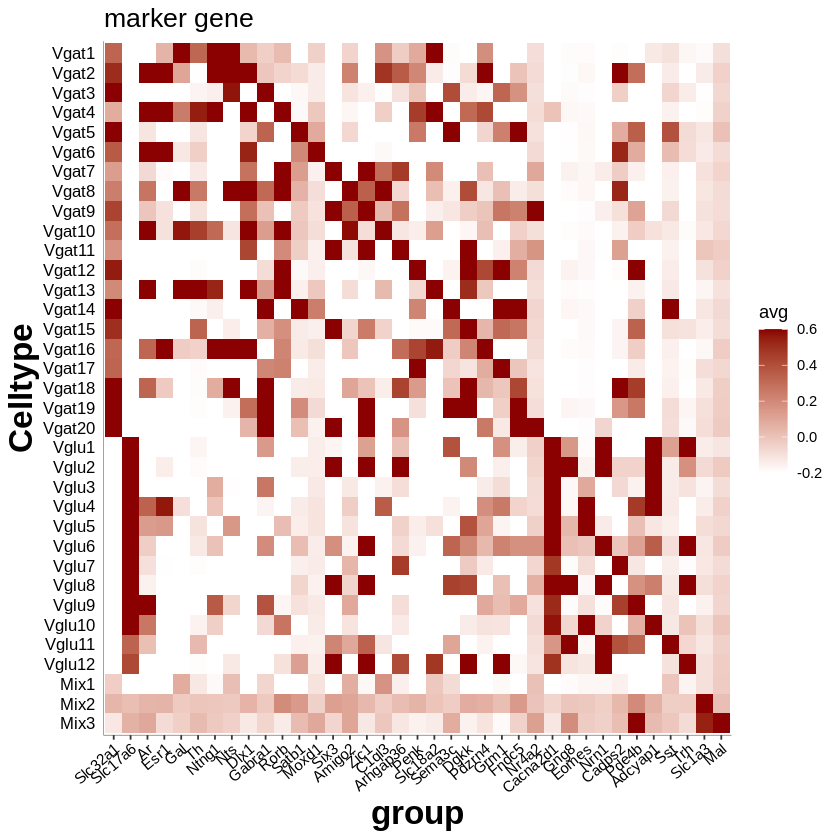

In [20]:
p<-ggplot(Cell_number, aes(factor(gene), factor(cluster)))+ 
  geom_tile(aes(fill =avg))+ scale_fill_continuous(limits=c(-0.2, 0.6), breaks=seq(-0.2,0.6,by=0.2),low = "white",high = "darkred", oob=squish)
#scale_x_discrete(breaks=c(0,5994,7712,9820,11428,11674,11836,11878))
pp<-p+ylab("Celltype")+xlab("group")+theme(axis.text.y=element_text(size=10,
                                                                    colour = "black"),axis.text.x=element_text(size=9,angle = 40, hjust =1,colour = "black"),axis.title=element_text(size=20,face="bold"),plot.title = element_text(size=16),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black", size = 0.1),axis.ticks.y = element_blank())+ggtitle("marker gene")
print(pp)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_heatmap_light.pdf",width=8,height=10)

In [ ]:
#making maximum heatmap from cell type

In [51]:
Cell_number_m<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

In [47]:
Cell_number_s<-subset(Cell_number,gene!="Slc32a1"& gene!="Slc17a6"& gene!="Ar" & gene!="Esr1" & gene!="Gal" & gene!="Th")

In [52]:
for(i in 1:length(Cell_type)){
temp<-subset(Cell_number_s,cluster==Cell_type[i])[order(-subset(Cell_number_s,cluster==Cell_type[i])$avg),]
temp_max<-max(temp$avg)
temp$avg<-0
temp$avg[1]<-temp_max
Cell_number_m<-rbind(Cell_number_m,temp)}

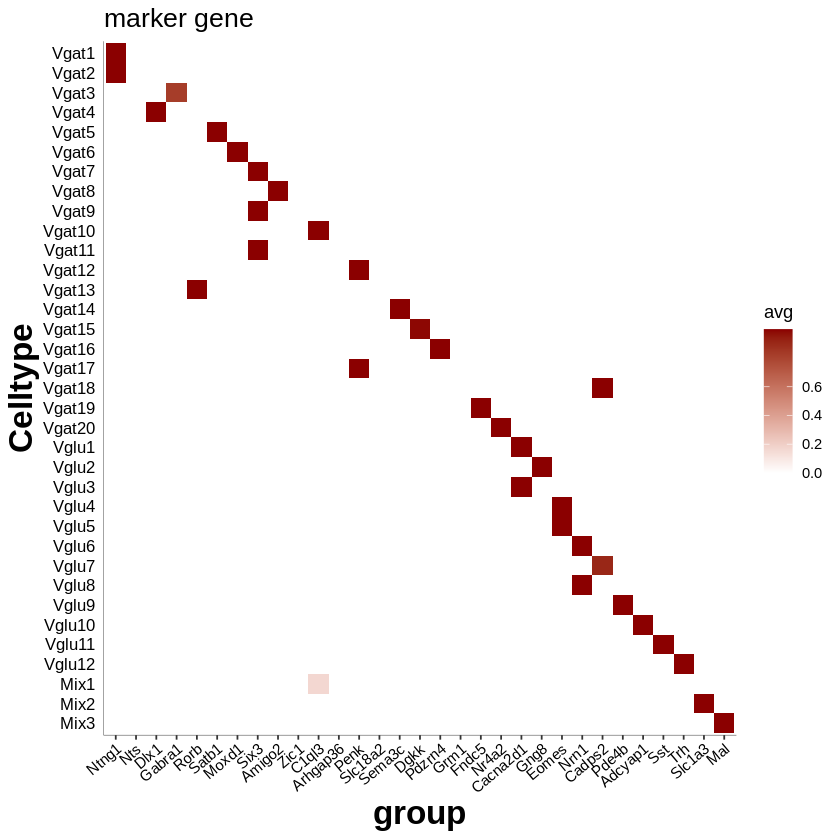

In [53]:
p<-ggplot(Cell_number_m, aes(factor(gene), factor(cluster)))+ 
  geom_tile(aes(fill =avg))+ scale_fill_continuous(limits=c(0, 1), breaks=seq(-0.2,0.6,by=0.2),low = "white",high = "darkred", oob=squish)
#scale_x_discrete(breaks=c(0,5994,7712,9820,11428,11674,11836,11878))
pp<-p+ylab("Celltype")+xlab("group")+theme(axis.text.y=element_text(size=10,
                                                                    colour = "black"),axis.text.x=element_text(size=9,angle = 40, hjust =1,colour = "black"),axis.title=element_text(size=20,face="bold"),plot.title = element_text(size=16),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black", size = 0.1),axis.ticks.y = element_blank())+ggtitle("marker gene")
print(pp)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_heatmap_max.pdf",width=8,height=6)

# Cell type disc

In [84]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Ntng1","Nts","Gabra1","Rorb","Satb1","Moxd1","Six3","Amigo2","Zic1","C1ql3","Arhgap36","Penk","Slc18a2","Sema3c","Dgkk","Pdzrn4","Grm1","Fndc5","Nr4a2","Cacna2d1","Gng8","Eomes","Nrn1","Cadps2","Pde4b","Adcyap1","Sst","Trh","Slc1a3","Mal"))

In [8]:
#210308 Fig1
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6"))

In [118]:
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3","Ambiguous1"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Tac1","Pcp4l1","Stmn2","Thy1"))

In [173]:
#supplementary fig2
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-c("Ntng1","Zfhx4","Gabra1","Hpcal1","Satb1","Nfix","Six3","Isl1","Zic1","C1ql3","Arhgap6","Zeb2","Th","Sema3c","Lhx8","Nts","Penk","Foxp2","Pou3f1","Nr4a2","Trh","Gng8","Cacna2d1","Eomes","Lhx9","Nrn1","Gda","Nxph4","Pde4b","Adcyap1","Otp","Neurod1","Acp1","Slc1a3","Mal")

In [28]:
#supplementary fig1 210711
Cell_type<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-c("Slc32a1","Slc17a6","Esr1","Pgr","Ar","Cyp19a1","Gal","Nts","Adcyap1","Pdyn","Rxfp1")

In [8]:
Cell_type<-rev(c("Vgat18","Vgat8","Vgat13","Vgat10","Vgat4","Vgat6","Vgat2","Vgat16","Vgat1","Vgat15","Vgat12","Vgat17","Vgat19","Vgat5","Vgat14","Vgat3","Vgat20","Vgat7","Vgat11","Vgat9"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Esr1","Ar"))

In [6]:
Cell_type<-rev(c("Vgat6","Vgat2","Vgat16","Vgat4","Vgat10","Vgat13","Vgat8","Vgat17","Vgat1","Vgat3","Vgat14","Vgat5","Vgat7","Vgat11","Vgat9","Vgat19","Vgat15","Vgat18","Vgat12","Vgat20"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Esr1","Ar"))

In [2]:
#Fig1 201112
Cell_type<-rev(c("Vgat2","Vgat4","Vgat6","Vgat16","Vgat13","Vgat8","Vgat1","Vgat10","Vgat18","Vgat7","Vgat3","Vgat9","Vgat17","Vgat15","Vgat12","Vgat19","Vgat5","Vgat14","Vgat11","Vgat20"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Esr1","Pgr","Ar"))

In [6]:
#Fig1 201227 male
Cell_type<-rev(c("Vgat2","Vgat4","Vgat6","Vgat16","Vgat13","Vgat8","Vgat1","Vgat10","Vgat18","Vgat7","Vgat3","Vgat9","Vgat17","Vgat15","Vgat12","Vgat19","Vgat5","Vgat14","Vgat11","Vgat20"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Esr1","Lamp5"))
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)
MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AM")))
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [9]:
#Fig1 201227 female
Cell_type<-rev(c("Vgat2","Vgat4","Vgat6","Vgat16","Vgat13","Vgat8","Vgat1","Vgat10","Vgat18","Vgat7","Vgat3","Vgat9","Vgat17","Vgat15","Vgat12","Vgat19","Vgat5","Vgat14","Vgat11","Vgat20"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Esr1","Apoc3"))
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)
MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AF")))
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [7]:
#supplementary fig2, updated 210711
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)
#MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AM" | stim=="AF")))
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [11]:
Cell_type<-rev(c("Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Esr1","Ar"))

In [6]:
#Ext Fig3 201125 male
Cell_type<-rev(c("Vgat18","Vgat8","Vgat13","Vgat10","Vgat1","Vgat4","Vgat6","Vgat2","Vgat16","Vgat15","Vgat12","Vgat17","Vgat19","Vgat5","Vgat14","Vgat3","Vgat20","Vgat7","Vgat11","Vgat9"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Esr1","Ar"))
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)
MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AM")))
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [18]:
#Ext Fig3 201125 female
Cell_type<-rev(c("Vgat18","Vgat8","Vgat13","Vgat10","Vgat1","Vgat4","Vgat6","Vgat2","Vgat16","Vgat15","Vgat12","Vgat17","Vgat19","Vgat5","Vgat14","Vgat3","Vgat20","Vgat7","Vgat11","Vgat9"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Esr1","Ar"))
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)
MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AF")))
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [15]:
#Ext Fig7 201128 male
Cell_type<-rev(c("Vgat6","Vgat2","Vgat16","Vgat4","Vgat10","Vgat13","Vgat8","Vgat17","Vgat1","Vgat3","Vgat14","Vgat5","Vgat7","Vgat11","Vgat9","Vgat19","Vgat15","Vgat18","Vgat12"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Ar","Esr1"))
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)
MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AM")))
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [18]:
#Ext Fig7 201125 female
Cell_type<-rev(c("Vgat13","Vgat16","Vgat4","Vgat10","Vgat8","Vgat2","Vgat15","Vgat18","Vgat12","Vgat7","Vgat11","Vgat9","Vgat14","Vgat5","Vgat19"))
Cell_type<-factor(Cell_type,levels=Cell_type)
gene_list<-rev(c("Slc32a1","Slc17a6","Esr1","Ar"))
MPOA.integrated<-readRDS(file = "/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MPOA.integrated.rds")
new.ident <- c("Mix1","Vgat1","Vglu1","Vgat2","Vgat3","Vgat4","Mix2","Vglu2","Vgat5","Vglu3","Vglu4","Vgat6","Vgat7","Vgat8","Vglu5","Vglu6","Vgat9","Vgat10","Vgat11","Vglu7","Vgat12","Vgat13","Vgat14","Vgat15","Vglu8","Vglu9","Vgat16","Vglu10","Vgat17","Vgat18","Vgat19","Vglu11","Vglu12","Ambiguous1","Mix3","Vgat20")
names(x = new.ident) <- levels(x =MPOA.integrated)
MPOA.integrated<- RenameIdents(object =MPOA.integrated, new.ident)
MPOA.integrated<-subset(MPOA.integrated,cells=rownames(subset(MPOA.integrated@meta.data,stim=="AF")))
#identifying cluster barcodes in each condition
# exp. Oligo_1_barcode_ctrl gives all barcodes in it
for (i in 1:length(new.ident)){
assign(paste(new.ident[i],"_barcode",sep=""),colnames(MPOA.integrated@assays$RNA@data[,which(Idents(object=MPOA.integrated) %in% new.ident[i])]))# this gives all barcodes in cluster
}

In [29]:
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

for (i in 1:length(gene_list)){
L<-length(Cell_type)

Cell_number_t<- data.frame("cluster" =Cell_type, "gene"=c(rep(gene_list[i],L)))
#used normalized uncorrected data
for (p in 1:length(Cell_type)){
Cell_number_t$pct[p]<-100*sum(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0)/length(eval(parse(text=paste(Cell_type[p],"_barcode",sep=""))))
Cell_number_t$avg[p]<-(mean(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])-mean(MPOA.integrated@assays$RNA@data[gene_list[i],]))/sd(MPOA.integrated@assays$RNA@data[gene_list[i],])
#for avg only consider the expressed cell
 #t<-LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0
# Cell_number_t$avg[p]<-mean(LHb.integrated@assays$RNA@data[gene_list[i],t])/sd(LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])    
    }
Cell_number<-rbind(Cell_number_t,Cell_number)}
as.factor(Cell_number$cluster)

[1] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [11] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [21] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
 [31] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
 [41] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
 [51] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
 [61] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
 [71] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
 [81] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
 [91] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
[101] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
[111] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
[121] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
[131] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
[141] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
[151] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
[161] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
[171] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
[181] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
[191] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
[201] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
[211] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
[221] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
[231] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
[241] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
[251] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
[261] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
[271] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
[281] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
[291] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
[301] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
[311] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1  Mix3   Mix2   Mix1   Vglu12 Vglu11
[321] Vglu10 Vglu9  Vglu8  Vglu7  Vglu6  Vglu5  Vglu4  Vglu3  Vglu2  Vglu1 
[331] Vgat20 Vgat19 Vgat18 Vgat17 Vgat16 Vgat15 Vgat14 Vgat13 Vgat12 Vgat11
[341] Vgat10 Vgat9  Vgat8  Vgat7  Vgat6  Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
[351] Mix3   Mix2   Mix1   Vglu12 Vglu11 Vglu10 Vglu9  Vglu8  Vglu7  Vglu6 
[361] Vglu5  Vglu4  Vglu3  Vglu2  Vglu1  Vgat20 Vgat19 Vgat18 Vgat17 Vgat16
[371] Vgat15 Vgat14 Vgat13 Vgat12 Vgat11 Vgat10 Vgat9  Vgat8  Vgat7  Vgat6 
[381] Vgat5  Vgat4  Vgat3  Vgat2  Vgat1 
35 Levels: Mix3 Mix2 Mix1 Vglu12 Vglu11 Vglu10 Vglu9 Vglu8 Vglu7 ... Vgat1

In [177]:
saveRDS(Cell_number,"/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes_usingallgroups.rds")

In [8]:
Cell_number<-readRDS("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes.rds")

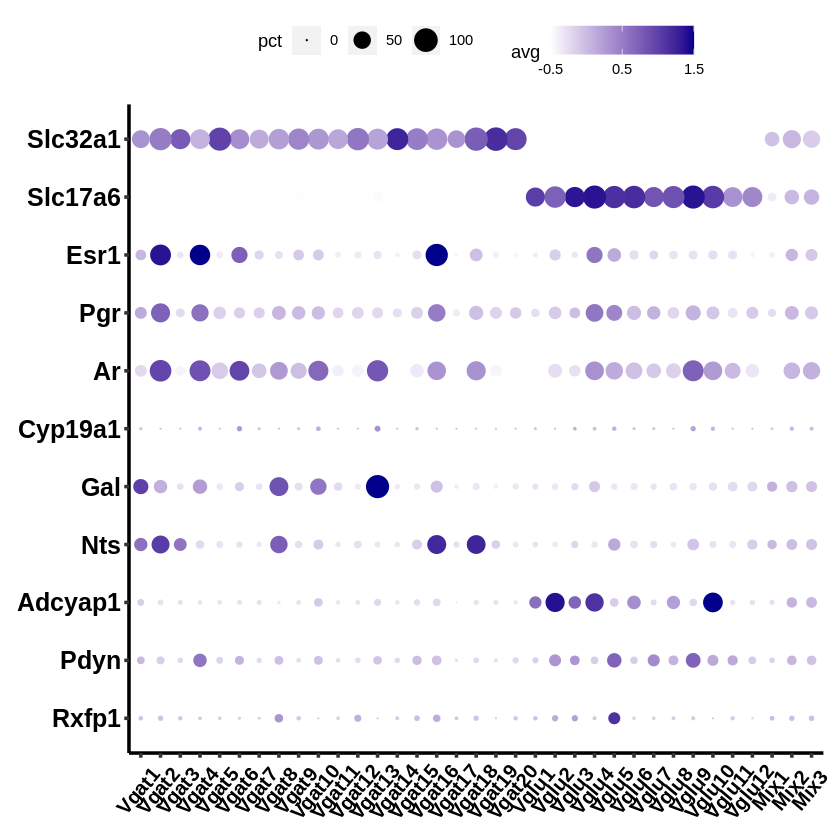

In [30]:
#210711 supple 1
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0.5,1.5),breaks=seq(-0.5,1.5,1),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,angle = 50, hjust = 0.6,vjust=0.6,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_canonical_markger_genes_210711_S1.pdf",height=5, width=10 , paper = "letter")

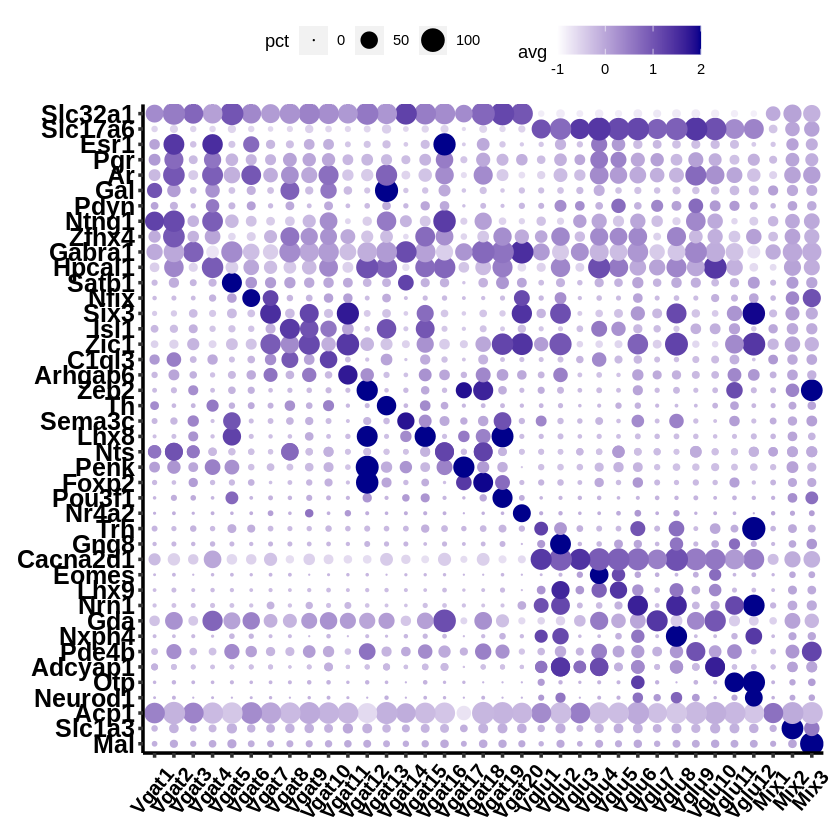

In [16]:
#201124 Extfig2
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1,2),breaks=seq(-1,2,1),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,angle = 50, hjust = 0.6,vjust=0.6,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes_210711.pdf",height=10, width=10 , paper = "letter")

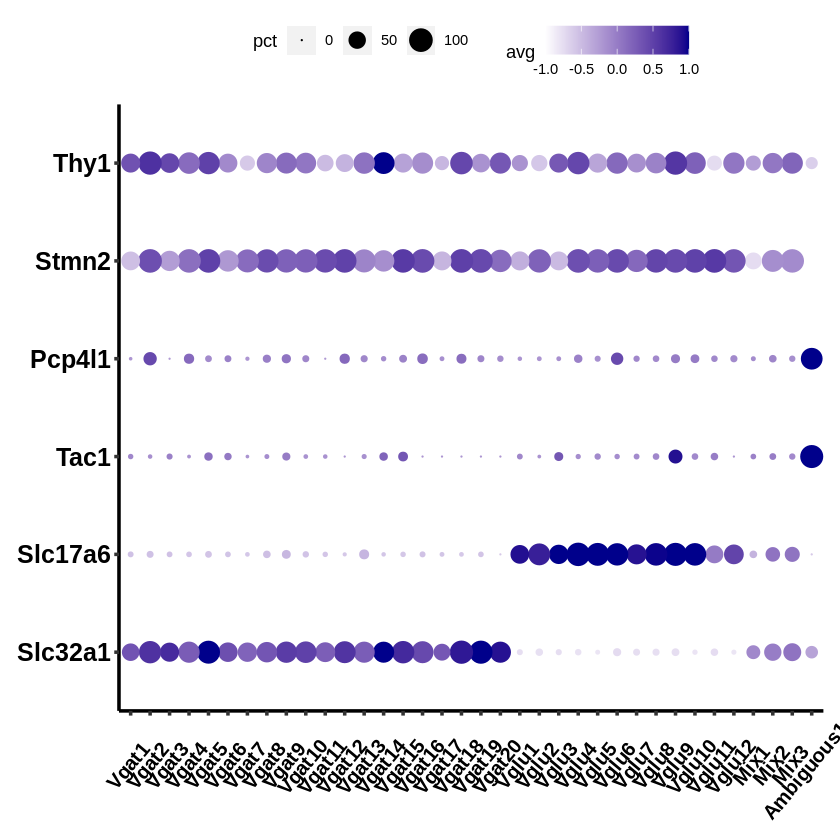

In [122]:
#justification to remove ambiguous 1
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1,1.0),breaks=seq(-1,1.0,0.5),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,angle = 50, hjust = 0.6,vjust=0.6,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/Vglu_Vgat_distribution_disc.pdf",height=4, width=7.5 , paper = "letter")

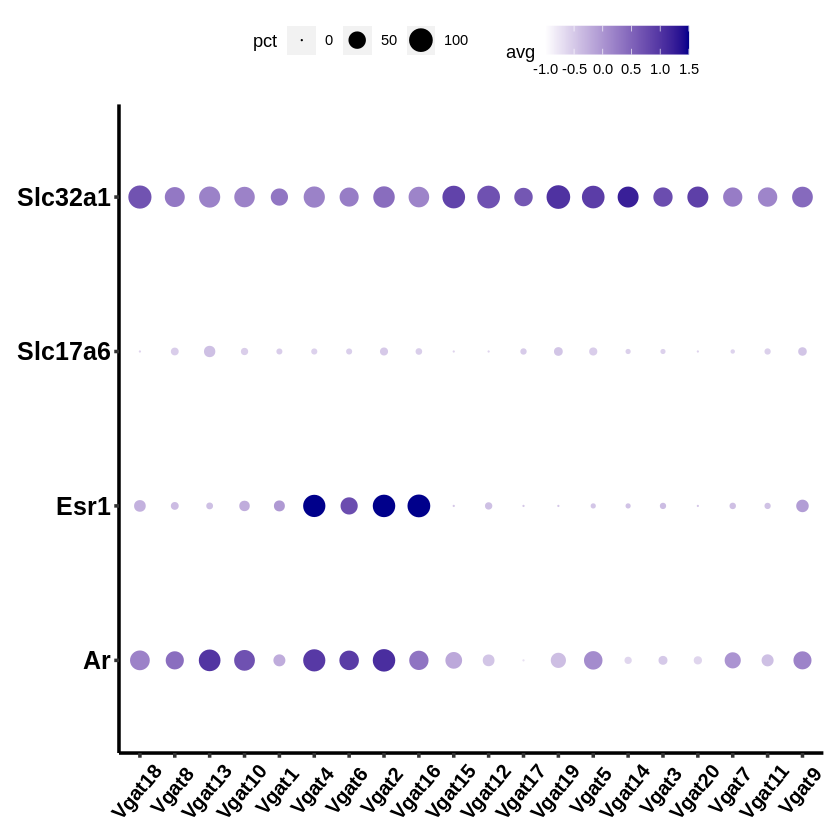

In [20]:
#ext fig3
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =rev(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1,1.5),breaks=seq(-1,1.5,0.5),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,angle = 50, hjust = 0.6,vjust=0.6,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_VgatVgluesr1_Ar_AF_genes_avg.pdf",height=2.6, width=6 , paper = "letter")

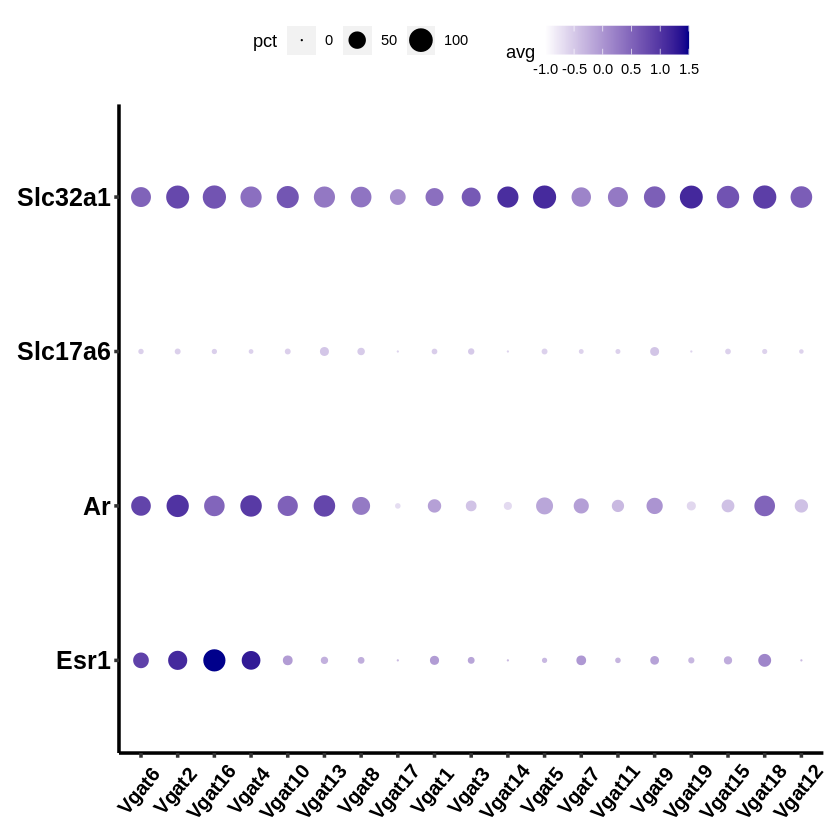

In [17]:
#ext fig7 male
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =rev(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1,1.5),breaks=seq(-1,1.5,0.5),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,angle = 50, hjust = 0.6,vjust=0.6,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_VgatVgluesr1_Ar_AM_genes_avgFor_exxtfig7.pdf",height=2.6, width=6 , paper = "letter")

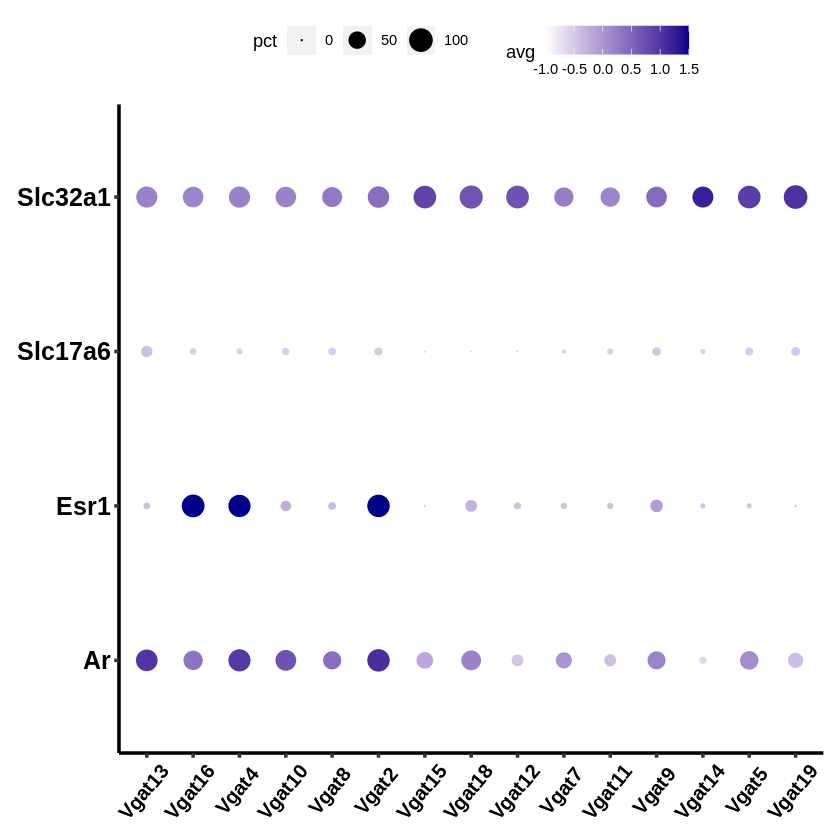

In [23]:
#ext fig7 female
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =rev(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1,1.5),breaks=seq(-1,1.5,0.5),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,angle = 50, hjust = 0.6,vjust=0.6,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_VgatVgluesr1_Ar_AF_genes_avgFor_exxtfig7.pdf",height=2.6, width=5.3 , paper = "letter")

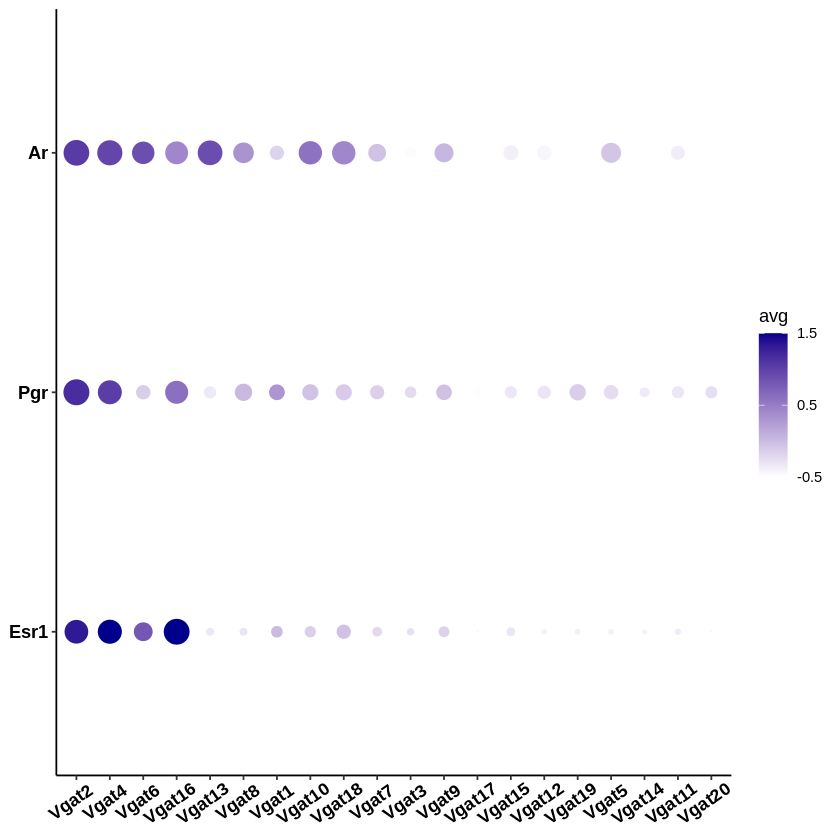

In [38]:
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0.5,1.5),breaks=seq(-0.5,1.5,1),oob=squish) + scale_size_continuous(range = c(0,7),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=11,color="black",face="bold"),axis.text.x=element_text(size=11,angle = 35, hjust = 0.7,vjust=0.8,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position ="right")+#guides(size = guide_legend(order=1),color = FALSE)+
guides(size = FALSE)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_esr1_pgr_ar_AMF_genes_avg.pdf",height=1.4, width=12 , paper = "letter")

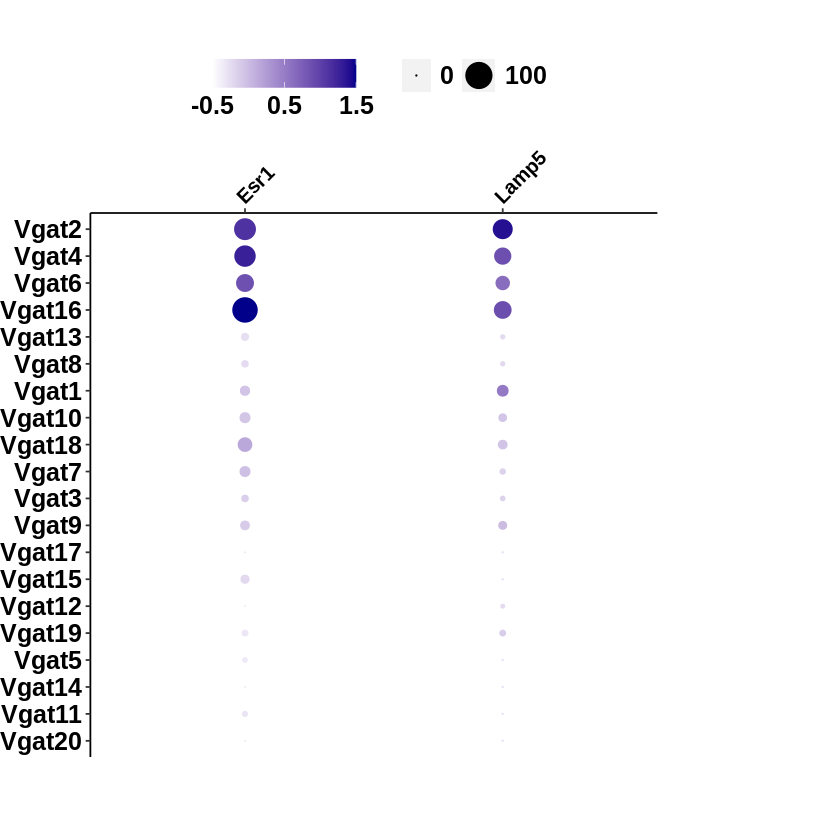

In [8]:
#201227
ggplot(Cell_number, aes( gene,cluster)) + geom_point(aes(size = pct, colour=avg)) + 
scale_y_discrete(limits = (levels(Cell_number$cluster)))+scale_x_discrete(limits =(levels(Cell_number$gene)),position = "top")+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0.5,1.5),breaks=seq(-0.5,1.5,1),oob=squish) + scale_size_continuous(range = c(0,7),limits=c(0,100),breaks=seq(0,100,100))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,vjust=-2,angle =45, hjust = 0,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(),legend.position="top",legend.title=element_blank(), legend.text=element_text(size = 15,face="bold"),
        plot.margin = margin(30, 110, 50, 0),, axis.line = element_line(colour = "black",size=0.5),axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 0.5))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MERFISH/1.0/male/marker_disc_lamp5,esr1_AM_genes_avg90.pdf",height=7, width=3 , paper = "letter")

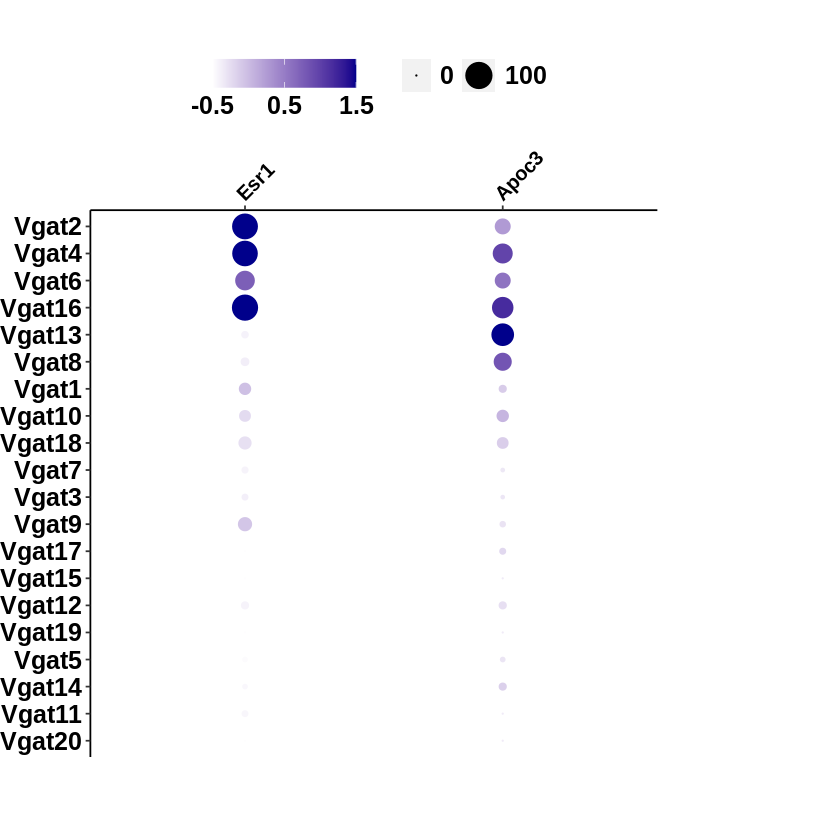

In [11]:
#201227
ggplot(Cell_number, aes( gene,cluster)) + geom_point(aes(size = pct, colour=avg)) + 
scale_y_discrete(limits = (levels(Cell_number$cluster)))+scale_x_discrete(limits =(levels(Cell_number$gene)),position = "top")+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0.5,1.5),breaks=seq(-0.5,1.5,1),oob=squish) + scale_size_continuous(range = c(0,7),limits=c(0,100),breaks=seq(0,100,100))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,vjust=-2,angle =45, hjust = 0,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(),legend.position="top",legend.title=element_blank(), legend.text=element_text(size = 15,face="bold"),
        plot.margin = margin(30, 110, 50, 0),, axis.line = element_line(colour = "black",size=0.5),axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 0.5))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/MERFISH/1.0/female/marker_disc_esr1_Apoc3_AF_genes_avg90_custom_threshold.pdf",height=7, width=3 , paper = "letter")

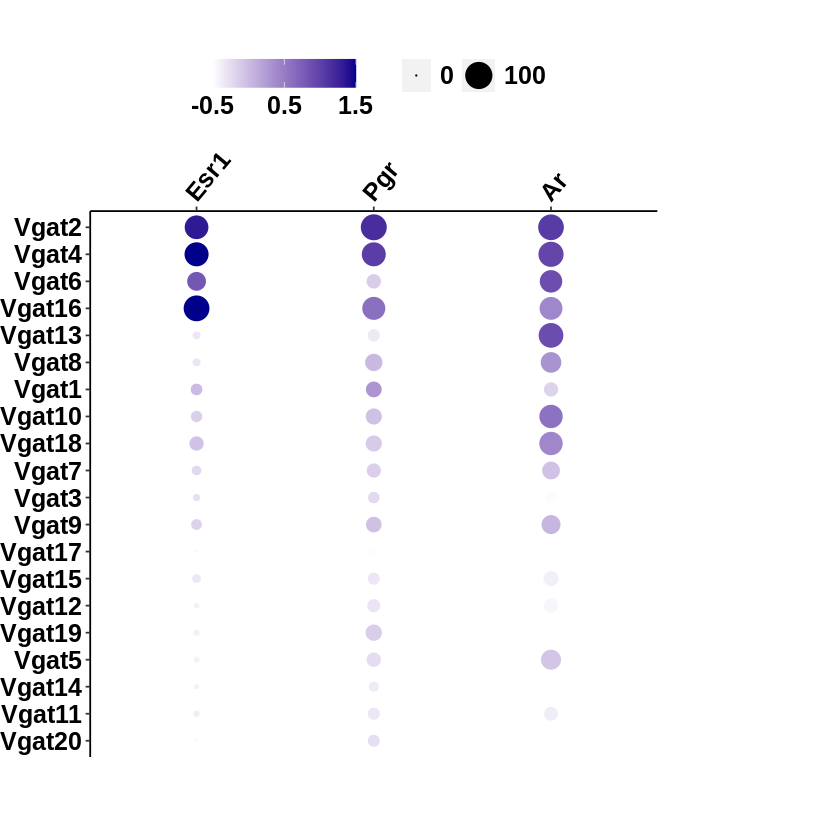

In [13]:
ggplot(Cell_number, aes( gene,cluster)) + geom_point(aes(size = pct, colour=avg)) + 
scale_y_discrete(limits = (levels(Cell_number$cluster)))+scale_x_discrete(limits =(levels(Cell_number$gene)),position = "top")+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0.5,1.5),breaks=seq(-0.5,1.5,1),oob=squish) + scale_size_continuous(range = c(0,7),limits=c(0,100),breaks=seq(0,100,100))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=15,vjust=-2,angle = 50, hjust = 0,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position="top",legend.title=element_blank(), legend.text=element_text(size = 15,face="bold"),
        plot.margin = margin(30, 110, 50, 0))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_esr1_pgr_ar_AMF_genes_avg90.pdf",height=10, width=3 , paper = "letter")

Saving 6.67 x 2.2 in image



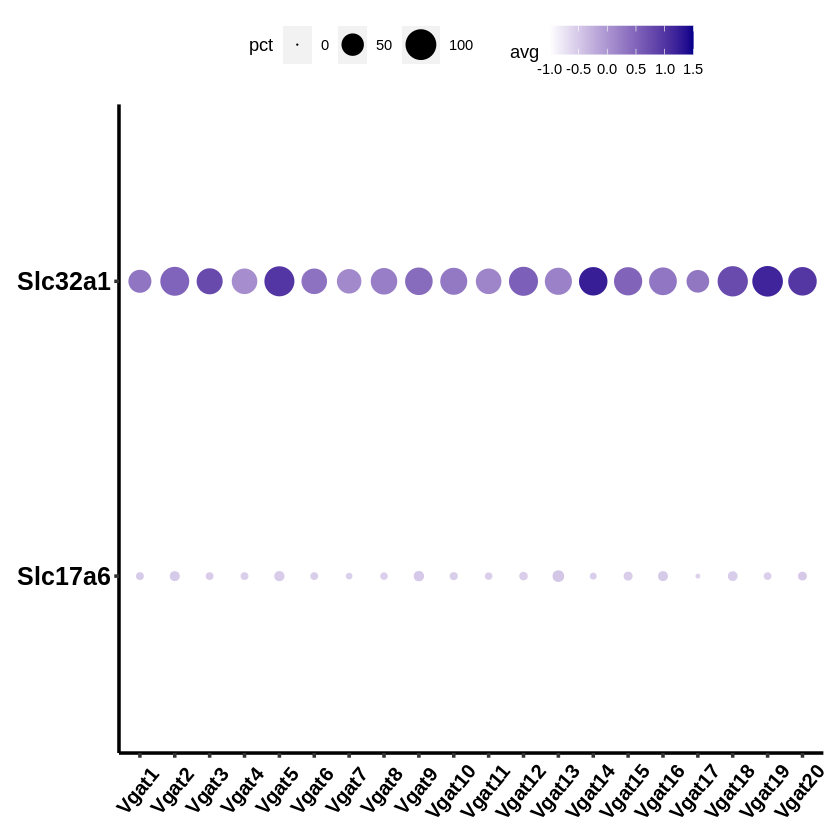

In [20]:
#210308 Fig1 Vgat Vglu in Vgat cells
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = rev(levels(Cell_number$cluster)))+scale_y_discrete(limits =rev(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1,1.5),breaks=seq(-1,1.5,0.5),oob=squish) + scale_size_continuous(range = c(0,8),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=15,color="black",face="bold"),axis.text.x=element_text(size=12,angle = 50, hjust = 0.6,vjust=0.6,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black",size=1),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_Vgat_Vglu_genes_Fig1.pdf",height=2.2, width= , paper = "letter")

# celltype disc split

In [7]:
Cell_type<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3")
group<-c("P23M","P35M","AM","Cast","P23F","P35F","AF","OVX")
gene_list<-rev(c("Slc32a1","Slc17a6","Ntng1","Nts","Gabra1","Rorb","Satb1","Moxd1","Six3","Amigo2","Zic1","C1ql3","Arhgap36","Penk","Slc18a2","Sema3c","Dgkk","Pdzrn4","Grm1","Fndc5","Nr4a2","Cacna2d1","Gng8","Eomes","Nrn1","Cadps2","Pde4b","Adcyap1","Sst","Trh","Slc1a3","Mal"))

In [8]:
type<-numeric()
for (i in 1:length(Cell_type)){
    for(j in 1:length(group)){
        type<-c(type,paste(Cell_type[i],"_",group[j],sep=""))
    }
}

In [11]:
typy<-numeric()
for (i in 1:length(Cell_type)){
    for(j in 1:length(group)){
        typy<-c(typy,paste(Cell_type[i],"_barcode_",group[j],sep=""))
    }
}

In [12]:
head(typy)

[1] "Vgat1_barcode_P23M" "Vgat1_barcode_P35M" "Vgat1_barcode_AM"  
[4] "Vgat1_barcode_Cast" "Vgat1_barcode_P23F" "Vgat1_barcode_P35F"

In [14]:
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

for (i in 1:length(gene_list)){
L<-length(type)

Cell_number_t<- data.frame("cluster" =type, "gene"=c(rep(gene_list[i],L)))
#used normalized uncorrected data
for (p in 1:length(type)){
Cell_number_t$pct[p]<-100*sum(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=typy[p]))]>0)/length(eval(parse(text=typy[p])))
Cell_number_t$avg[p]<-(mean(MPOA.integrated@assays$RNA@data[gene_list[i],eval(parse(text=typy[p]))])-mean(MPOA.integrated@assays$RNA@data[gene_list[i],]))/sd(MPOA.integrated@assays$RNA@data[gene_list[i],])
#for avg only consider the expressed cell
 #t<-LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))]>0
# Cell_number_t$avg[p]<-mean(LHb.integrated@assays$RNA@data[gene_list[i],t])/sd(LHb.integrated@assays$RNA@data[gene_list[i],eval(parse(text=paste(Cell_type[p],"_barcode",sep="")))])    
    }
Cell_number<-rbind(Cell_number_t,Cell_number)}
as.factor(Cell_number$cluster)

[1] Vgat1_P23M  Vgat1_P35M  Vgat1_AM    Vgat1_Cast  Vgat1_P23F  Vgat1_P35F 
   [7] Vgat1_AF    Vgat1_OVX   Vgat2_P23M  Vgat2_P35M  Vgat2_AM    Vgat2_Cast 
  [13] Vgat2_P23F  Vgat2_P35F  Vgat2_AF    Vgat2_OVX   Vgat3_P23M  Vgat3_P35M 
  [19] Vgat3_AM    Vgat3_Cast  Vgat3_P23F  Vgat3_P35F  Vgat3_AF    Vgat3_OVX  
  [25] Vgat4_P23M  Vgat4_P35M  Vgat4_AM    Vgat4_Cast  Vgat4_P23F  Vgat4_P35F 
  [31] Vgat4_AF    Vgat4_OVX   Vgat5_P23M  Vgat5_P35M  Vgat5_AM    Vgat5_Cast 
  [37] Vgat5_P23F  Vgat5_P35F  Vgat5_AF    Vgat5_OVX   Vgat6_P23M  Vgat6_P35M 
  [43] Vgat6_AM    Vgat6_Cast  Vgat6_P23F  Vgat6_P35F  Vgat6_AF    Vgat6_OVX  
  [49] Vgat7_P23M  Vgat7_P35M  Vgat7_AM    Vgat7_Cast  Vgat7_P23F  Vgat7_P35F 
  [55] Vgat7_AF    Vgat7_OVX   Vgat8_P23M  Vgat8_P35M  Vgat8_AM    Vgat8_Cast 
  [61] Vgat8_P23F  Vgat8_P35F  Vgat8_AF    Vgat8_OVX   Vgat9_P23M  Vgat9_P35M 
  [67] Vgat9_AM    Vgat9_Cast  Vgat9_P23F  Vgat9_P35F  Vgat9_AF    Vgat9_OVX  
  [73] Vgat10_P23M Vgat10_P35M Vgat10_AM   Vgat10_Cast Vgat10_P23F Vgat10_P35F
  [79] Vgat10_AF   Vgat10_OVX  Vgat11_P23M Vgat11_P35M Vgat11_AM   Vgat11_Cast
  [85] Vgat11_P23F Vgat11_P35F Vgat11_AF   Vgat11_OVX  Vgat12_P23M Vgat12_P35M
  [91] Vgat12_AM   Vgat12_Cast Vgat12_P23F Vgat12_P35F Vgat12_AF   Vgat12_OVX 
  [97] Vgat13_P23M Vgat13_P35M Vgat13_AM   Vgat13_Cast Vgat13_P23F Vgat13_P35F
 [103] Vgat13_AF   Vgat13_OVX  Vgat14_P23M Vgat14_P35M Vgat14_AM   Vgat14_Cast
 [109] Vgat14_P23F Vgat14_P35F Vgat14_AF   Vgat14_OVX  Vgat15_P23M Vgat15_P35M
 [115] Vgat15_AM   Vgat15_Cast Vgat15_P23F Vgat15_P35F Vgat15_AF   Vgat15_OVX 
 [121] Vgat16_P23M Vgat16_P35M Vgat16_AM   Vgat16_Cast Vgat16_P23F Vgat16_P35F
 [127] Vgat16_AF   Vgat16_OVX  Vgat17_P23M Vgat17_P35M Vgat17_AM   Vgat17_Cast
 [133] Vgat17_P23F Vgat17_P35F Vgat17_AF   Vgat17_OVX  Vgat18_P23M Vgat18_P35M
 [139] Vgat18_AM   Vgat18_Cast Vgat18_P23F Vgat18_P35F Vgat18_AF   Vgat18_OVX 
 [145] Vgat19_P23M Vgat19_P35M Vgat19_AM   Vgat19_Cast Vgat19_P23F Vgat19_P35F
 [151] Vgat19_AF   Vgat19_OVX  Vgat20_P23M Vgat20_P35M Vgat20_AM   Vgat20_Cast
 [157] Vgat20_P23F Vgat20_P35F Vgat20_AF   Vgat20_OVX  Vglu1_P23M  Vglu1_P35M 
 [163] Vglu1_AM    Vglu1_Cast  Vglu1_P23F  Vglu1_P35F  Vglu1_AF    Vglu1_OVX  
 [169] Vglu2_P23M  Vglu2_P35M  Vglu2_AM    Vglu2_Cast  Vglu2_P23F  Vglu2_P35F 
 [175] Vglu2_AF    Vglu2_OVX   Vglu3_P23M  Vglu3_P35M  Vglu3_AM    Vglu3_Cast 
 [181] Vglu3_P23F  Vglu3_P35F  Vglu3_AF    Vglu3_OVX   Vglu4_P23M  Vglu4_P35M 
 [187] Vglu4_AM    Vglu4_Cast  Vglu4_P23F  Vglu4_P35F  Vglu4_AF    Vglu4_OVX  
 [193] Vglu5_P23M  Vglu5_P35M  Vglu5_AM    Vglu5_Cast  Vglu5_P23F  Vglu5_P35F 
 [199] Vglu5_AF    Vglu5_OVX   Vglu6_P23M  Vglu6_P35M  Vglu6_AM    Vglu6_Cast 
 [205] Vglu6_P23F  Vglu6_P35F  Vglu6_AF    Vglu6_OVX   Vglu7_P23M  Vglu7_P35M 
 [211] Vglu7_AM    Vglu7_Cast  Vglu7_P23F  Vglu7_P35F  Vglu7_AF    Vglu7_OVX  
 [217] Vglu8_P23M  Vglu8_P35M  Vglu8_AM    Vglu8_Cast  Vglu8_P23F  Vglu8_P35F 
 [223] Vglu8_AF    Vglu8_OVX   Vglu9_P23M  Vglu9_P35M  Vglu9_AM    Vglu9_Cast 
 [229] Vglu9_P23F  Vglu9_P35F  Vglu9_AF    Vglu9_OVX   Vglu10_P23M Vglu10_P35M
 [235] Vglu10_AM   Vglu10_Cast Vglu10_P23F Vglu10_P35F Vglu10_AF   Vglu10_OVX 
 [241] Vglu11_P23M Vglu11_P35M Vglu11_AM   Vglu11_Cast Vglu11_P23F Vglu11_P35F
 [247] Vglu11_AF   Vglu11_OVX  Vglu12_P23M Vglu12_P35M Vglu12_AM   Vglu12_Cast
 [253] Vglu12_P23F Vglu12_P35F Vglu12_AF   Vglu12_OVX  Mix1_P23M   Mix1_P35M  
 [259] Mix1_AM     Mix1_Cast   Mix1_P23F   Mix1_P35F   Mix1_AF     Mix1_OVX   
 [265] Mix2_P23M   Mix2_P35M   Mix2_AM     Mix2_Cast   Mix2_P23F   Mix2_P35F  
 [271] Mix2_AF     Mix2_OVX    Mix3_P23M   Mix3_P35M   Mix3_AM     Mix3_Cast  
 [277] Mix3_P23F   Mix3_P35F   Mix3_AF     Mix3_OVX    Vgat1_P23M  Vgat1_P35M 
 [283] Vgat1_AM    Vgat1_Cast  Vgat1_P23F  Vgat1_P35F  Vgat1_AF    Vgat1_OVX  
 [289] Vgat2_P23M  Vgat2_P35M  Vgat2_AM    Vgat2_Cast  Vgat2_P23F  Vgat2_P35F 
 [295] Vgat2_AF    Vgat2_OVX   Vgat3_P23M  Vgat3_P35M  Vgat3_AM    Vgat3_Cast 
 [301] Vgat3_P23F  Vgat3_P35F  Vgat3_AF    Vgat3_OVX 

In [24]:
typy<-factor(typy,levels=typy)

In [25]:
cluster<-rep(typy,length(gene_list))

In [26]:
Cell_number$cluster<-cluster

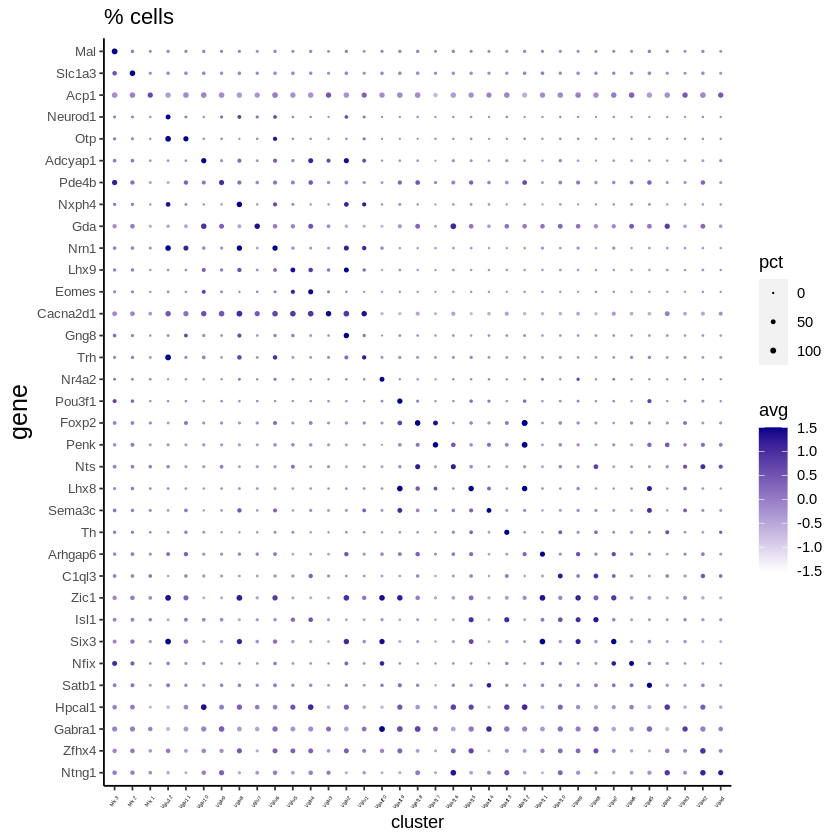

In [72]:
ggplot(Cell_number, aes(cluster, gene)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = levels(Cell_number$cluster))+scale_y_discrete(limits =rev(levels(Cell_number$gene)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1.5,1.5),oob=squish) + scale_size_continuous(range = c(0,1),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title.y=element_text(size=15),axis.text.y=element_text(size=8),axis.text.x=element_text(size=3,angle = 50, hjust = 0.7,vjust=0.7,color="black"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"))+ggtitle("% cells")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_group.pdf",height=10, width=15 , paper = "letter")

# celltype disc split only for marker

In [10]:
Cell_type<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3")
group<-c("other","P23M","P35M","AM","Cast","P23F","P35F","AF","OVX")
gene_list<-c("Ntng1","Zfhx4","Gabra1","Hpcal1","Satb1","Nfix","Six3","Isl1","Zic1","C1ql3","Arhgap6","Zeb2","Th","Sema3c","Lhx8","Nts","Penk","Foxp2","Pou3f1","Nr4a2","Trh","Gng8","Cacna2d1","Eomes","Lhx9","Nrn1","Gda","Nxph4","Pde4b","Adcyap1","Otp","Neurod1","Acp1","Slc1a3","Mal")

In [22]:
Cell_number<- data.frame(Date=as.Date(character()),File=character(),User=character(),stringsAsFactors=FALSE)

for (i in 1:length(group)){
L<-length(Cell_type)
Cell_number_t<- data.frame("cluster" =Cell_type,"marker"=gene_list, "group"=c(rep(group[i],L)))

for (p in 1:length(Cell_type)){
if(group[i]=="other"){
   temp<-rownames(MPOA.integrated@meta.data)
   barcode<-temp[!(temp %in% eval(parse(text = paste(Cell_type[i],"_barcode",sep=""))))]
Cell_number_t$pct[p]<-100*sum(MPOA.integrated@assays$RNA@data[gene_list[p],barcode]>0)/length(barcode)
Cell_number_t$avg[p]<-(mean(MPOA.integrated@assays$RNA@data[gene_list[p],barcode])-mean(MPOA.integrated@assays$RNA@data[gene_list[p],]))/sd(MPOA.integrated@assays$RNA@data[gene_list[p],])
 }else{
Cell_number_t$pct[p]<-100*sum(MPOA.integrated@assays$RNA@data[gene_list[p],eval(parse(text=paste(Cell_type[p],"_barcode_",group[i],sep="")))]>0)/length(eval(parse(text=paste(Cell_type[p],"_barcode_",group[i],sep=""))))
Cell_number_t$avg[p]<-(mean(MPOA.integrated@assays$RNA@data[gene_list[p],eval(parse(text=paste(Cell_type[p],"_barcode_",group[i],sep="")))])-mean(MPOA.integrated@assays$RNA@data[gene_list[p],]))/sd(MPOA.integrated@assays$RNA@data[gene_list[p],])
    }
}
Cell_number<-rbind(Cell_number_t,Cell_number)
}
#as.factor(Cell_number$cluster)

ERROR: Error in data.frame(cluster = Cell_type, marker = gene_list, group = c(rep(group[i], : arguments imply differing number of rows: 35, 42


In [12]:
Cell_number$cluster<-factor(Cell_number$cluster,levels=c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))

In [13]:
Cell_number$marker<-factor(Cell_number$marker,levels=c("Ntng1","Zfhx4","Gabra1","Hpcal1","Satb1","Nfix","Six3","Isl1","Zic1","C1ql3","Arhgap6","Zeb2","Th","Sema3c","Lhx8","Nts","Penk","Foxp2","Pou3f1","Nr4a2","Trh","Gng8","Cacna2d1","Eomes","Lhx9","Nrn1","Gda","Nxph4","Pde4b","Adcyap1","Otp","Neurod1","Acp1","Slc1a3","Mal"))

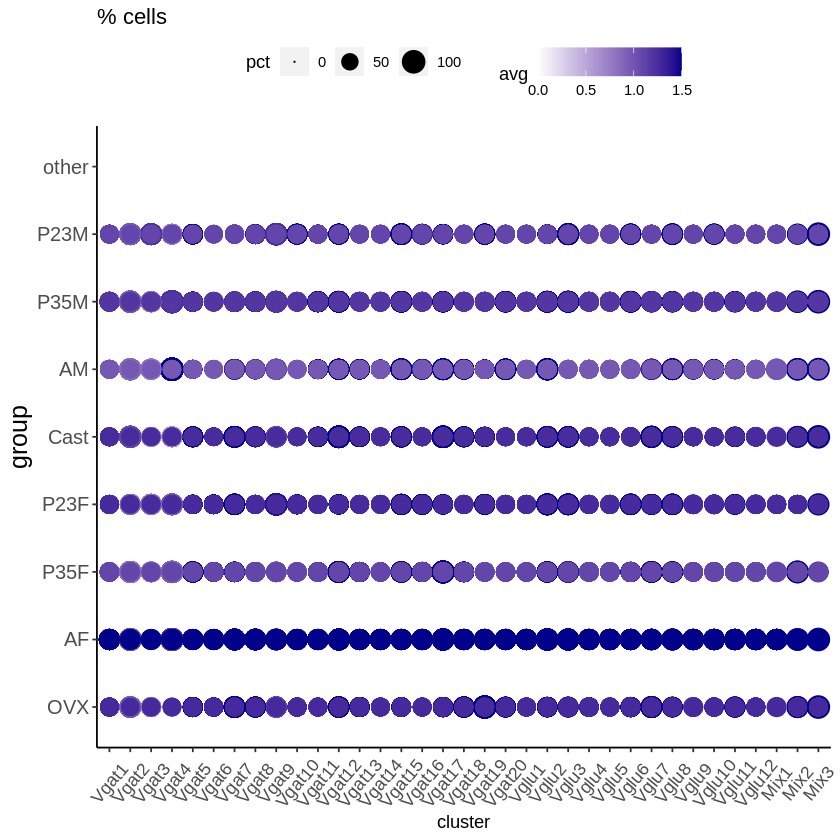

In [22]:
ggplot(Cell_number, aes(cluster, group)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = (levels(Cell_number$cluster)))+scale_y_discrete(limits =(levels(Cell_number$group)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(0,1.5),breaks=seq(0,1.5,0.5),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title.y=element_text(size=15),axis.text.y=element_text(size=12),axis.text.x=element_text(size=11,angle = 50, hjust = 0.5,vjust=0.5),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position ="top")+ggtitle("% cells")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes_allgroups.pdf",height=3.5, width=10 , paper = "letter")

In [14]:
saveRDS(Cell_number,"/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes_split.rds")

In [7]:
Cell_number<-readRDS("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes_split.rds")

In [17]:
Cell_number

cluster,marker,group,pct,avg
<fct>,<fct>,<fct>,<dbl>,<dbl>
Vgat1,Ntng1,OVX,59.36073,1.2684215
Vgat2,Zfhx4,OVX,80.00000,0.9711031
Vgat3,Gabra1,OVX,67.63006,0.7224031
Vgat4,Hpcal1,OVX,51.72414,0.1966151
Vgat5,Satb1,OVX,68.33333,2.0206450
Vgat6,Nfix,OVX,60.20408,2.2718694
Vgat7,Six3,OVX,81.08108,1.7256885
Vgat8,Isl1,OVX,74.35897,1.5063147
Vgat9,Zic1,OVX,77.65957,1.1143553


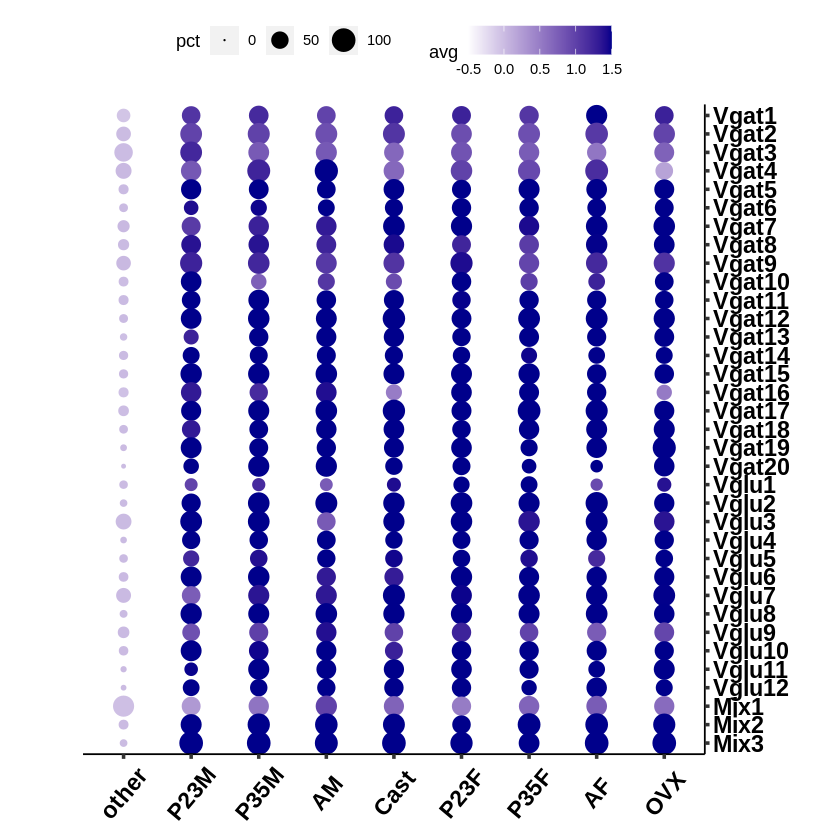

In [20]:
ggplot(Cell_number, aes(group, cluster)) + geom_point(aes(size = pct, colour=avg)) + 
scale_y_discrete(limits = rev(levels(Cell_number$cluster)),position = "right")+scale_x_discrete(limits =rev(levels(Cell_number$group)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-0.5,1.5),breaks=seq(-0.5,1.5,0.5),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title=element_blank(),axis.text.y=element_text(size=14,color="black",face="bold"),axis.text.x=element_text(size=14,angle = 50, hjust = 0.5,vjust=0.5,color="black",face="bold"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position ="top",axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 30, 10, 50))
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes_allgroups_xgroup.pdf",height=10, width=3.7 , paper = "letter")

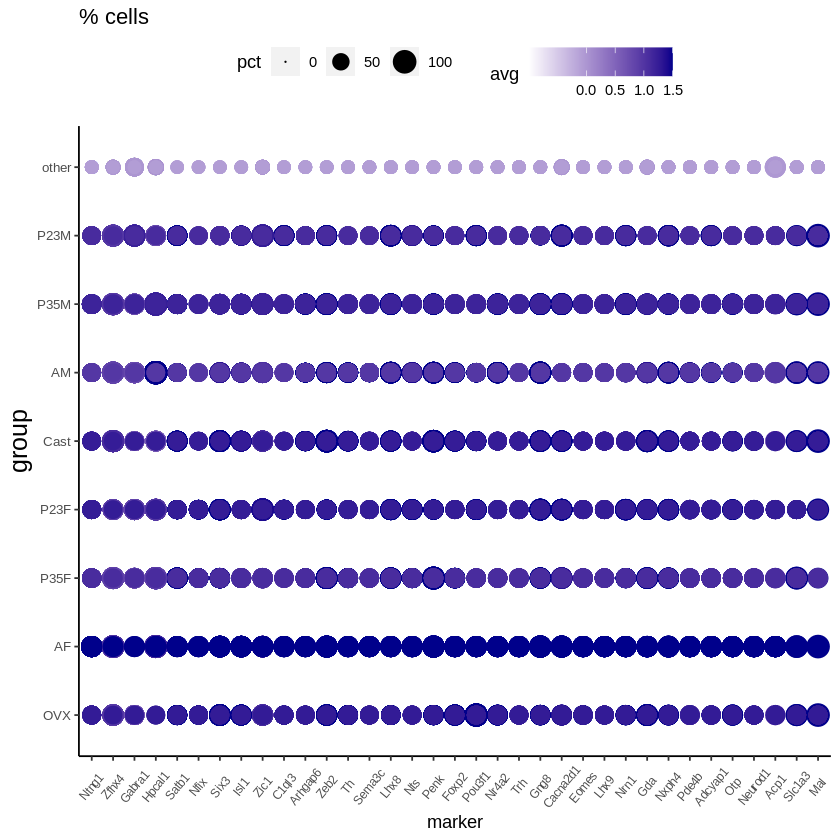

In [118]:
ggplot(Cell_number, aes(marker, group)) + geom_point(aes(size = pct, colour=avg)) + 
scale_x_discrete(limits = (levels(Cell_number$marker)))+scale_y_discrete(limits =(levels(Cell_number$group)))+
scale_color_gradient(low = "white", high = "darkblue",limits = c(-1,1.5),breaks=seq(0,1.5,0.5),oob=squish) + scale_size_continuous(range = c(0,6),limits=c(0,100),breaks=seq(0,100,50))+
geom_point(aes(size = pct), pch=21,, lwd=0,stroke=0)+
theme(axis.title.y=element_text(size=15),axis.text.y=element_text(size=8),axis.text.x=element_text(size=7,angle = 50, hjust = 0.5,vjust=0.5),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black"),legend.position ="top")+ggtitle("% cells")
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/marker_disc_markger_genes_allgroups_gene.pdf",height=3.5, width=10 , paper = "letter")

# correlation between conditions

In [164]:
group<-c("AM","P35M","P23M","Cast","AF","P35F","P23F","OVX")
Celltype<-rev(c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3"))

In [165]:
Final<-data.frame(celltype=Celltype)
for(i in 1:(length(group)-1)){
G1<-group[i]
    temp<-((i+1):length(group))
for(k in temp){
G2<-group[k]
C1<-Celltype
C2<-Celltype
corr<- data.frame(matrix(NA, ncol=length(C1),nrow=length(C2)))
rownames(corr)<-factor(C2,levels=C2)
colnames(corr)<-factor(C1,levels=C1)
C1_exp<-MPOA.integrated@assays$integrated@data[,rownames(subset(MPOA.integrated@meta.data,stim==G1))]
C2_exp<-MPOA.integrated@assays$integrated@data[,rownames(subset(MPOA.integrated@meta.data,stim==G2))]
C1_exp<-C1_exp[rowSums(as.matrix(C1_exp))>0,]
C2_exp<-C2_exp[rowSums(as.matrix(C2_exp))>0,]
common_genes<-intersect(rownames(C1_exp),rownames(C2_exp))
C1_exp<-C1_exp[common_genes,]
C2_exp<-C2_exp[common_genes,]
C1_exp<-t(scale(t(as.matrix(C1_exp))))
C2_exp<-t(scale(t(as.matrix(C2_exp))))
for (i in 1:length(C1)){
    for (j in 1:length(C2)){
    corr[j,i]<-cor(rowMeans(as.matrix(C1_exp[,eval(parse(text = paste(C1[i],"_barcode_",G1,sep="")))])),rowMeans(as.matrix(C2_exp[,eval(parse(text = paste(C2[j],"_barcode_",G2,sep="")))])))
}}

test.m <- melt(as.matrix(corr))

same<-numeric()
different<-numeric()
for (l in 1:dim(test.m)[1]){
if(test.m$Var1[l]==test.m$Var2[l]){same<-c(same,l)
                            different<-different}else{
    same<-same
    different<-c(different,l)}}
Corr<-test.m[same,]
value_different<-numeric()
for (m in 1:length(Celltype)){
    value_different[m]<-mean(subset(test.m[different,],Var2==Celltype[m])$value)
}
Final[,paste("Cis_",G1,G2,sep="")]<-Corr$value
Final[,paste("Trans_",G1,G2,sep="")]<-value_different
    }}
Final<-Final[,2:dim(Final)[2]]
rownames(Final)<-factor(Celltype,levels=Celltype)
test.m <- melt(as.matrix(Final))

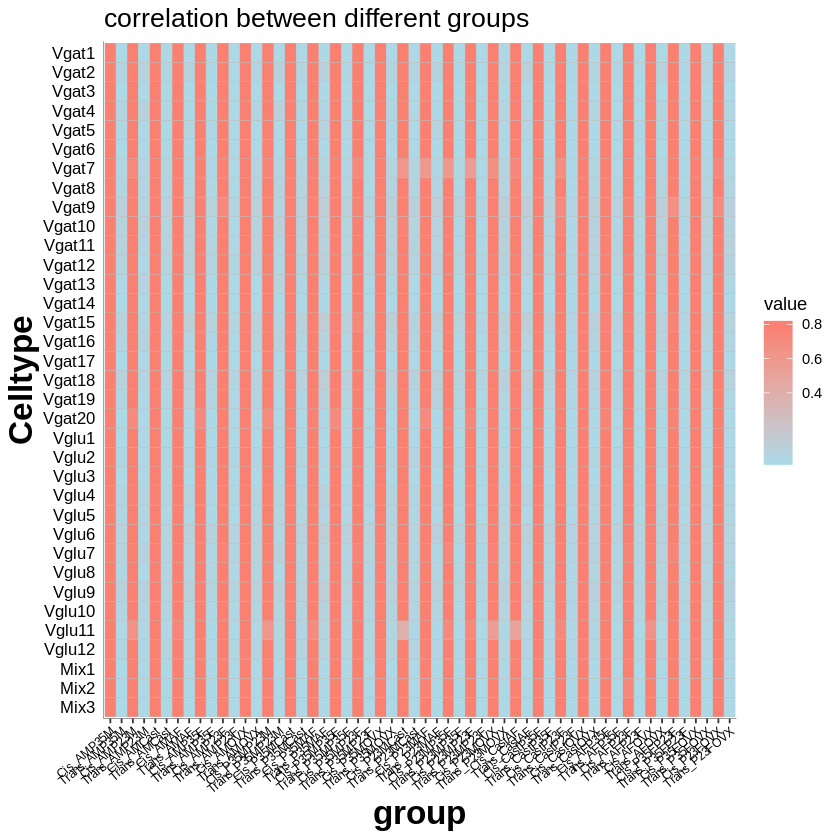

In [169]:
p <-  ggplot(test.m, aes(Var2,Var1, fill= value)) + 
  geom_tile(color = "gray")+ scale_fill_continuous(limits=c(-0, 0.8), breaks=seq(0.4,1,by=0.2),low = "lightblue"
                                                   ,high = "salmon", oob=squish)
#scale_x_discrete(breaks=c(0,5994,7712,9820,11428,11674,11836,11878))
pp<-p+ylab("Celltype")+xlab("group")+theme(axis.text.y=element_text(size=10,
                                                                    colour = "black"),axis.text.x=element_text(size=7,angle = 40, hjust =1,colour = "black"),axis.title=element_text(size=20,face="bold"),plot.title = element_text(size=16),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black", size = 0.1),axis.ticks.y = element_blank())+ggtitle("correlation between different groups")
print(pp)
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/celltype simillarity_2_blue.pdf"
,width=12,height=10)

In [114]:
group<-rev(c("AM","P35M","P23M","Cast","AF","P35F","P23F","OVX"))
Celltype<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3")

In [115]:
Final<-data.frame(celltype=Celltype)
for(i in 1:(length(group)-1)){
G1<-group[i]
    temp<-((i+1):length(group))
for(k in temp){
G2<-group[k]
C1<-Celltype
C2<-Celltype
corr<- data.frame(matrix(NA, ncol=length(C1),nrow=length(C2)))
rownames(corr)<-factor(C2,levels=C2)
colnames(corr)<-factor(C1,levels=C1)
C1_exp<-MPOA.integrated@assays$integrated@data[,rownames(subset(MPOA.integrated@meta.data,stim==G1))]
C2_exp<-MPOA.integrated@assays$integrated@data[,rownames(subset(MPOA.integrated@meta.data,stim==G2))]
C1_exp<-C1_exp[rowSums(as.matrix(C1_exp))>0,]
C2_exp<-C2_exp[rowSums(as.matrix(C2_exp))>0,]
common_genes<-intersect(rownames(C1_exp),rownames(C2_exp))
C1_exp<-C1_exp[common_genes,]
C2_exp<-C2_exp[common_genes,]
C1_exp<-t(scale(t(as.matrix(C1_exp))))
C2_exp<-t(scale(t(as.matrix(C2_exp))))
for (i in 1:length(C1)){
    for (j in 1:length(C2)){
    corr[j,i]<-cor(rowMeans(as.matrix(C1_exp[,eval(parse(text = paste(C1[i],"_barcode_",G1,sep="")))])),rowMeans(as.matrix(C2_exp[,eval(parse(text = paste(C2[j],"_barcode_",G2,sep="")))])))
}}

test.m <- melt(as.matrix(corr))

same<-numeric()
different<-numeric()
for (l in 1:dim(test.m)[1]){
if(test.m$Var1[l]==test.m$Var2[l]){same<-c(same,l)
                            different<-different}else{
    same<-same
    different<-c(different,l)}}
Corr<-test.m[same,]
value_different<-numeric()
for (m in 1:length(Celltype)){
    value_different[m]<-mean(subset(test.m[different,],Var2==Celltype[m])$value)
}
Final[,paste("same_celltype",G1,G2,sep="")]<-Corr$value
Final[,paste("different_celltype",G1,G2,sep="")]<-value_different
    }}
Final<-Final[,2:dim(Final)[2]]
rownames(Final)<-factor(Celltype,levels=Celltype)
test.m <- melt(as.matrix(Final))

In [1]:
p <-  ggplot(test.m, aes(Var1,Var2, fill= value)) + 
  geom_tile(color = "gray")+ scale_fill_continuous(limits=c(-0, 0.8), breaks=seq(0.4,1,by=0.2),low = "white",high = "salmon", oob=squish)
#scale_x_discrete(breaks=c(0,5994,7712,9820,11428,11674,11836,11878))
pp<-p+ylab("Celltype")+xlab("group")+theme(axis.text.x=element_text(size=7,angle = 50, hjust =1,colour = "black"),axis.title=element_text(size=20,face="bold"),plot.title = element_text(size=16),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black", size = 0.1),axis.ticks.y = element_blank())+ggtitle("correlation between different groups")
pp
ggsave(file="/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/celltype simillarity.pdf",width=10,height=10)

ERROR: Error in ggplot(test.m, aes(Var1, Var2, fill = value)): could not find function "ggplot"


In [2]:
#use below

In [3]:
Celltype<-c("Vgat1","Vgat2","Vgat3","Vgat4","Vgat5","Vgat6","Vgat7","Vgat8","Vgat9","Vgat10","Vgat11","Vgat12","Vgat13","Vgat14","Vgat15","Vgat16","Vgat17","Vgat18","Vgat19","Vgat20","Vglu1","Vglu2","Vglu3","Vglu4","Vglu5","Vglu6","Vglu7","Vglu8","Vglu9","Vglu10","Vglu11","Vglu12","Mix1","Mix2","Mix3")
row_type<-"AF"
col_type<-"OVX"

col<-Celltype
row<-Celltype
corr<- data.frame(matrix(NA, ncol=length(col),nrow=length(row)))
rownames(corr)<-factor(row,levels=row)
colnames(corr)<-factor(col,levels=col)
p_value<- data.frame(matrix(NA, ncol=length(col),nrow=length(row)))
rownames(p_value)<-factor(row,levels=row)
colnames(p_value)<-factor(col,levels=col)
col_exp<-MPOA.integrated@assays$integrated@data[,rownames(subset(MPOA.integrated@meta.data,stim==col_type))]
row_exp<-MPOA.integrated@assays$integrated@data[,rownames(subset(MPOA.integrated@meta.data,stim==row_type))]
col_exp<-col_exp[rowSums(as.matrix(col_exp))>0,]
row_exp<-row_exp[rowSums(as.matrix(row_exp))>0,]
common_genes<-intersect(rownames(col_exp),rownames(row_exp))
col_exp<-col_exp[common_genes,]
row_exp<-row_exp[common_genes,]
col_exp<-t(scale(t(as.matrix(col_exp))))
row_exp<-t(scale(t(as.matrix(row_exp))))
for (i in 1:length(col)){
    for (j in 1:length(row)){
    corr[j,i]<-cor(rowMeans(as.matrix(col_exp[,eval(parse(text = paste(col[i],"_barcode_",col_type,sep="")))])),rowMeans(as.matrix(row_exp[,eval(parse(text = paste(row[j],"_barcode_",row_type,sep="")))])))
}}
for (i in 1:length(col)){
    for (j in 1:length(row)){
   p_value[j,i]<-cor.test(rowMeans(as.matrix(col_exp[,eval(parse(text = paste(col[i],"_barcode_",col_type,sep="")))])),rowMeans(as.matrix(row_exp[,eval(parse(text = paste(row[j],"_barcode_",row_type,sep="")))])))$p.value
}}
test.m <- melt(as.matrix(corr))
test.p <- melt(as.matrix(p_value))
for(i in 1:dim(test.m)[1]){
    if (test.p$value[i]>0.01){
        test.m$value[i]<-0
    }else{
        test.m$value[i]<-test.m$value[i]
    }
}




ERROR: Error in eval(expr, envir, enclos): object 'MPOA.integrated' not found


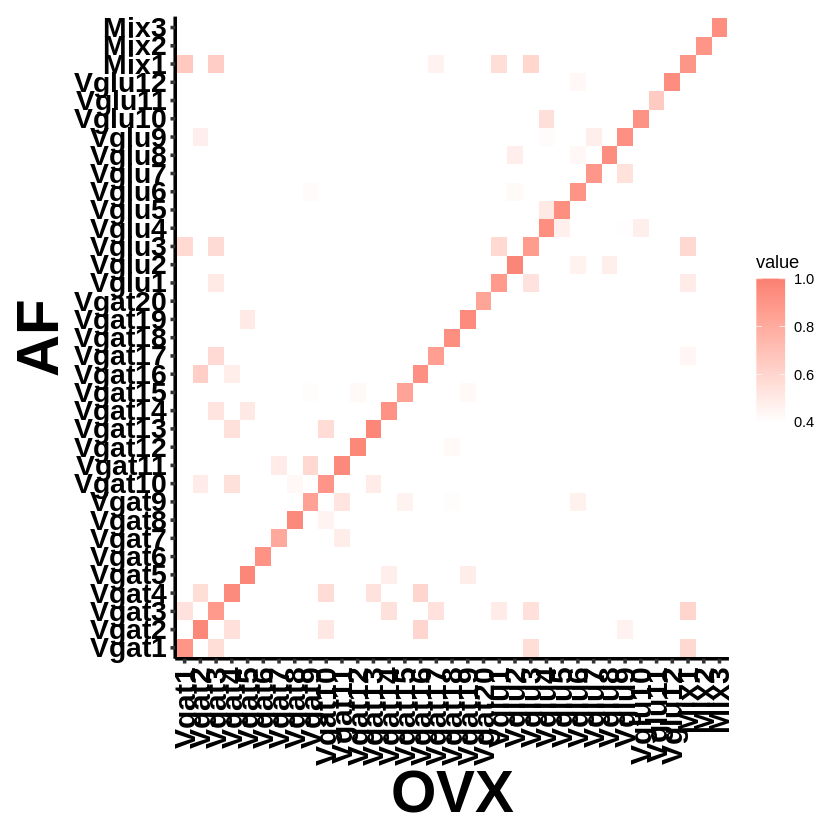

In [58]:
p <-  ggplot(test.m, aes(Var2,Var1, fill= value)) + 
  geom_tile()+ scale_fill_continuous(limits=c(0.4, 1), breaks=seq(0.4,1,by=0.2),low = "white",high = "salmon", oob=squish)
#scale_x_discrete(breaks=c(0,5994,7712,9820,11428,11674,11836,11878))
pp<-p+ylab(row_type)+xlab(col_type)+theme(axis.text.y=element_text(size=17, hjust =1,colour = "black",face="bold"),axis.text.x=element_text(size=18,angle = 90, hjust =1,vjust=0.5,colour = "black",face="bold"),axis.title=element_text(size=35,face="bold"),plot.title = element_text(size=16),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank(), axis.line = element_line(colour = "black", size = 1),axis.ticks.length=unit(.1, "cm"),axis.ticks = element_line(size = 1), plot.margin = margin(10, 10, 10, 10))
ggsave(file=paste("/media/garret/New Volume/scRNAseq_data/Koichi/V3_analysis/MPOA/MPOA_integrated/log/Neurons/correlation",row_type,col_type,".pdf",sep=""),width=10,height=10,paper="letter")
print(pp)